<a href="https://colab.research.google.com/github/EnriquePagePerez/IHC-Protein-Staining-Analysis/blob/main/IHC-Protein-Staining-Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# // ======================================================== //

# **@ [ ` ENGINE ` ] :**

## // ------------------------------------------------------------ //

## **@ [ ` ENGINE ` ] - [ ` IMPORTs ` ] :**

In [75]:
from   matplotlib               import pyplot      as plt
from   PIL                      import Image       as im
from   PIL                      import ImageFilter as imfilter
from   google.colab             import drive
from   numpy._core.numerictypes import issubdtype
import skimage                                     as sk
import numpy                                       as np
import matplotlib                                  as mpl
import numpy                                       as np
import pandas                                      as pd
import os
import io
import shutil
import ipywidgets

## // ------------------------------------------------------------ //

## **@ [ ` ENGINE ` ] - [ ` FUNCTIONs ` ] :**

In [76]:
def load_images_from_folder_container(
      folder                               ,
      decimation_factor       = 1          ,
      decimation_interpolator = im.NEAREST ,
      return_details          = False      ,
                                     ):
    """Loads images from a folder using PIL and returns them as a list of NumPy arrays.

    Args:
        folder: The path to the folder containing the images.
        return_details: If True, returns a tuple of lists:
                        (images, filenames, n_channels, min_max_values).

    Returns:
        A list of NumPy arrays representing the images, or a tuple of lists
        if return_details is True.
    """
    images         = []
    filenames      = []
    n_channels     = []
    min_max_values = []

    for filename in os.listdir(folder):
        try:
            img_path  = os.path.join(folder, filename)
            img       = im.open(img_path)
            if decimation_factor != 1:
              img     = img.resize( (img.width // decimation_factor , img.height // decimation_factor) , resample = decimation_interpolator )
            img_array = np.array(img)

            images.append(img_array)
            filenames.append(filename)
            n_channels.append(img_array.shape[-1] if img_array.ndim == 3 else 1)

            if img_array.ndim == 3:
                # // ---- // CALCULATE MIN/MAX PER CHANNEL FOR MULTI-CHANNEL IMGs:
                channel_min_max = [(np.min(img_array[:,:,i]), np.max(img_array[:,:,i])) for i in range(img_array.shape[-1])]
                min_max_values.append(channel_min_max)
            else:
                # // ---- // CALCULATE MIN/MAX FOR SINGLE-CHANNEL IMGs:
                min_max_values.append([(np.min(img_array), np.max(img_array))])

        except Exception as e:
            print(f"Could not load image {filename}: {e}")

    if return_details:
        # // ---- // SORT LISTS BASED ON FILENAMES:
        sorted_lists = sorted(zip(filenames, images, n_channels, min_max_values))
        sorted_filenames, sorted_images, sorted_n_channels, sorted_min_max_values = zip(*sorted_lists)
        return (list(sorted_images), list(sorted_filenames), list(sorted_n_channels), list(sorted_min_max_values))
    else:
        return images

In [77]:
def image_mask_multiply(
      image ,
      mask  ,
                       ):
  """Multiplies an image by a mask.

  Args:
      image: A NumPy array representing the image.
      mask: A NumPy array representing the mask.

  Returns:
      A masked image.
  """

  if image.dtype != np.float32 : _image = dtyped_image( image , dtype = np.float32 )
  else                         : _image = image

  if mask.dtype  != np.float32 : _mask  = dtyped_image( mask  , dtype = np.float32 )
  else                         : _mask  = mask

  return dtyped_image(
          _image * _mask      ,
          dtype = image.dtype ,
                     )

In [78]:
def normalize_image(
      image                        ,
      normalize_per_channel = True ,
      dtype                 = None ,
                   ):
    """Normalizes a single image represented as a NumPy array.

    Args:
        image: A NumPy array representing the image.

    Returns:
        A normalized image.
    """

    img = image

    if img.ndim > 2 and normalize_per_channel:
      return np.asarray([
    normalize_image( img[:,:,d] ) for d in range(img.shape[-1])
                        ]).transpose(1,2,0)
    else:
      min_val   = np.min( img )
      max_val   = np.max( img )
      range_val = max_val - min_val

      if dtype is None : dtype = img.dtype
      if   range_val != 0 : return dtyped_image( ( ( img - min_val ) / range_val ) , dtype )
      else                : return img

In [79]:
def histogram_match_image(
      source_image             ,
      target_image             ,
      match_per_channel = True ,
                         ):
  """Performs histogram matching on a source signal to match the histogram of a target signal.

  Args:
      source_image: A NumPy array representing the source image.
      target_image: A NumPy array representing the target image.

  Returns:
      A NumPy array representing the histogram-matched source image.
  """
  if   source_image.dtype != np.uint8 : _source_image = dtyped_image( source_image , np.uint8 )
  else                                : _source_image = source_image

  if   target_image.dtype != np.uint8 : _target_image = dtyped_image( target_image , np.uint8 )
  else                                : _target_image = target_image


  if _source_image.ndim != 2 and match_per_channel:
  # // ----------------------------------------------- //
  # // -------- // MULTI-CHANNEL PIPELINE // --------- //
  # // ----------------------------------------------- //
    matched_image = np.zeros_like( _source_image )
    for ch in range(_source_image.shape[-1]):
      if _source_image.ndim == _target_image.ndim:
        matched_image[:,:,ch] = histogram_match_image(
          _source_image[ : , : , ch ] ,
          _target_image[ : , : , ch ] ,
                                                     )
      else:
        if _target_image.ndim != 2:
          matched_image[:,:,ch] = histogram_match_image(
            _source_image[ : , : , ch                      ] ,
            _target_image[ : , : , ch % _target_image.ndim ] ,
                                                       )
        else:
          matched_image[:,:,ch] = histogram_match_image(
            _source_image[ : , : , ch ] ,
            _target_image               ,
                                                       )

  # // ----------------------------------------------- //


  else:
  # // ----------------------------------------------- //
  # // -------- // SINGLE-CHANNEL PIPELINE // -------- //
  # // ----------------------------------------------- //

    # // ---- // DETERMINE UNIQUE VALUES AND THEIR INVERSE INDICES:
    src_values, src_unique_indices, src_counts = np.unique( _source_image , return_inverse = True , return_counts = True )
    ref_values, ref_counts                     = np.unique( _target_image ,                         return_counts = True )

    # // ---- // CALCULATE CUMULATIVE DISTRIBUTION FUNCTIONS (CDFs):
    src_cdf = np.cumsum(src_counts).astype(float) / _source_image.size
    ref_cdf = np.cumsum(ref_counts).astype(float) / _target_image.size

    # // ---- // CREATE A MAPPING (of intensities) FROM SOURCE VALUES TO TARGETs:
    interp_values = np.interp( src_cdf , ref_cdf , ref_values )

    # // ---- // APPLY THE MAPPING TO THE SOURCE IMAGE'S DATA AND RESHAPE IT:
    matched_image = interp_values[src_unique_indices].reshape(_source_image.shape) / 255.0

  # // ----------------------------------------------- //



  # // ---- // SANITIZING THE OUTPUT'S DTYPE:
  if matched_image.dtype != source_image.dtype :
    matched_image = dtyped_image( matched_image , source_image.dtype )

  # // ---- // RETURN THE MATCHED-IMAGE:
  return matched_image

# // ----------------------------------------------------------------------- //
# // ----------------------------------------------------------------------- //
# // ----------------------------------------------------------------------- //

In [80]:
def array_info_breakdown(
    array                        ,
    return_data          = False ,
    print_info_breakdown = True  ,
    info_name            = None  ,
                        ):
  """Performs a basic array / signal analysis.

  Args:
      array: A NumPy array representing the array / signal.
      return_data: a boolean defining whether the results should be returned as values or not.
      print_info_breakdown: a boolean defining whether the breakdown should be printed or not.
      info_name: a string defining the name of the printable-array breakdown.

  Returns (optional):
      A tuple of values representing the breakdown data.
  """

  # // ---- // EXTRACT THE INFO FROM THE ARRAY:
  min    = array.min()
  mean   = array.mean()
  median = np.median(array)
  max    = array.max()
  sum    = array.sum()
  dtype  = array.dtype

  # // ---- // PRINT THE INFO DUMP (if requested):
  if print_info_breakdown:
    if info_name is None : _info_name = ''
    else                 : _info_name = info_name.upper()
    print(
    f'''
{_info_name} array DATA:
             |--|> MIN    : { min    }
             |--|> MEAN   : { mean   }
             |--|> MEDIAN : { median }
             |--|> MAX    : { max    }
             |--|> SUM    : { sum    }
             |--|> DTYPE  : { dtype  }
    '''
        )

  # // ---- // RETURN THE DATA TUPLE (if requested):
  if return_data:
    return ( min , mean , median , max , dtype )

In [81]:
def dtyped_image(
    image ,
    dtype ,
                ):
  """Transforms an image array from its original dtype to a specified one.

  Args:
      image: A NumPy array representing the array / signal.
      dtype: The desired data type for the output image.

  Returns:
      The image array transformed to the specified dtype.
  """

  if type(image) == np.ndarray and image.dtype == dtype:
    return image.copy()

  else : # // ---- // CONVERT TO NUMPY ARRAY (if necessary):
    dtyped_img = np.asarray(image)

    # // ---- // GET CURRENT MIN-MAX VALUES:
    input_min = np.min(dtyped_img)
    input_max = np.max(dtyped_img)

    # // ---- // DETERMINE INPUT RANGE / D-TYPE:
    if np.issubdtype(dtyped_img.dtype, np.floating):
      in_dtype_min , in_dtype_max = 0.0, 1.0
    elif np.issubdtype(dtyped_img.dtype, np.integer):
      in_dtype_min , in_dtype_max = np.iinfo(dtyped_img.dtype).min , np.iinfo(dtyped_img.dtype).max
    else:
      raise ValueError(f"Unsupported input dtype: {dtyped_img.dtype}")

    # // ---- // DETERMINE TARGET RANGE BASED ON REQUESTED D-TYPE:
    if np.issubdtype(dtype, np.floating):
      out_dtype_min , out_dtype_max = 0.0, 1.0
    elif np.issubdtype(dtype, np.integer):
      out_dtype_min , out_dtype_max = np.iinfo(dtype).min , np.iinfo(dtype).max
    else:
      raise ValueError(f"Unsupported output dtype: {dtype}")

    # // ---- // AVOID DIVISION BY ZERO IF IMAGE IS CONSTANT:
    if input_max == input_min:
      # // ---- // IF ALL PIXELS ARE THE SAME, MAP THEM TO A REPRESENTATIVE VALUE IN THE TARGET RANGE:
      if np.issubdtype(dtyped_img.dtype, np.floating) and input_min >= 0.0 and input_max <= 1.0:
          scaled_img = dtyped_img # // ---- // IMAGE IS ALREADY IN THE REQUESTED RANGE.
      else:
          # // ---- // MAP CONSTANT VALUE TO MIDDLE OF REQUESTED RANGE:
          scaled_img = np.full_like(dtyped_img, (out_dtype_min + out_dtype_max) / 2.0, dtype=np.float64)
    else:
      # // ---- // SCALE INPUT VALUE TO [ 0 , 1 ] RANGE AND THEN PUT IT IN THE REQUESTED ONE:
      normalized_img = ( dtyped_img - input_min ) / ( input_max - input_min )

      scale_factor   = ( input_max - input_min ) / ( in_dtype_max - in_dtype_min )
      max_val        = ( input_max             ) / ( in_dtype_max - in_dtype_min )
      min_val        = ( input_min             ) / ( in_dtype_max - in_dtype_min )
      scaled_img     = normalized_img * scale_factor + min_val

      scaled_img     = out_dtype_min + scaled_img * out_dtype_max

    # // ---- // RETURN THE RE-RANGED IMAGE:
    return scaled_img.astype(dtype)

In [82]:
def image_blur(
    image       ,
    blur_factor ,
              ):
  """Blurs an image using PIL's filter library by a blur factor.

  Args:
      image: A NumPy array representing the array / signal.
      blur_factor: The factor by which to blur the image.

  Returns:
      A blurred image.
  """
  input_image   = dtyped_image( image , np.uint8 )
  blurred_image = im.fromarray( input_image )
  blurred_image = blurred_image.filter( imfilter.GaussianBlur( blur_factor ) )
  blurred_image = np.asarray( blurred_image )
  blurred_image = dtyped_image( blurred_image , image.dtype )

  return blurred_image

In [83]:
def colorize_image(
  image                             ,
  colors                            ,
  colorization_factor      = 1      ,
  normalize_per_channel    = True   ,
  normalize                = True   ,
  use_complimentary_colors = False  ,
  colorizer_functor        = np.max ,
                 ):
  """Generates a visualizable / colorized image out of an array / signal and a specified color-scheme.

  Args:
      image: A NumPy array representing the array / signal.
      colors: A list of RGB color values to use for colorization.
      colorization_factor: A factor by which to scale the colorized image.
      normalize_per_channel: A boolean indicating whether to normalize each channel separately.
      normalize: A boolean indicating whether to normalize the entire image.
      use_complimentary_colors: A boolean indicating whether to use complementary colors.
      colorizer_functor: A function used for colorization.

  Returns:
      The image array's visual representation under the specified color-scheme.
  """
  in_colorized = dtyped_image( image , np.float32 )
  if in_colorized.ndim == 2 : in_colorized = np.dstack( ( in_colorized , ) * 1 )

  primary_colors = np.asarray( colors )
  primary_colors = primary_colors / primary_colors.max()

  if   use_complimentary_colors : comp_colors = 1. - primary_colors
  else                          : comp_colors = None

  def colorization_sub_process( img , primary_colors , complimentary_colors = None ):
    _img = img.copy()
    if _img.ndim == 2 : _img = np.dstack( ( _img , ) * len( primary_colors ) )
    if normalize      : _img = normalize_image( img , normalize_per_channel )

    if use_complimentary_colors:
      _img = [
        colorizer_functor(
        [
          np.dstack( (    _img[:,:,ch]   , ) * 3 ) * (  1 - primary_colors[ ch ]     ) ,
          np.dstack( ( 1. - _img[:,:,ch] , ) * 3 ) * ( complimentary_colors[ ch ] ) ,
        ]        ,
        axis = 0 ,
                          ).squeeze()
        for ch in range(_img.shape[-1])
              ]
    else:
      _img = [
          colorizer_functor(
        [ np.dstack( ( _img[:,:,ch] , ) * 3 ) * ( primary_colors[ ch ] )
        for ch in range(_img.shape[-1]) ] ,
        axis = 0 ,
                            ).squeeze()
              ]

    return np.asarray(_img)

  colorized = colorization_sub_process( in_colorized , primary_colors , comp_colors )
  colorized = np.asarray( colorized ).mean(axis = 0)
  colorized = np.clip( colorized * colorization_factor , 0 , 1 )
  colorized = colorized / colorized.max()
  colorized = colorized * in_colorized.max()

  return dtyped_image( colorized , image.dtype )

In [84]:
def dual_image(
    image_a                   ,
    image_b                   ,
    x_offset  = 0             ,
    div_size  = 3             ,
    div_color = [ 0 , 0 , 0 ] ,
              ):
  """Generates a visualizable / colorized image out of an array / signal and a specified color-scheme.

  Args:
      image_a: A NumPy array representing the first array / signal.
      image_b: A NumPy array representing the second array / signal.
      x_offset: the x-offset of the divisor line.
      div_size: the size of the divisor line.
      div_color: the color of the divisor line.

  Returns:
      A dual image containing two regions separated by a divisor line.
  """
  dual_image             = dtyped_image( image_a , image_a.dtype )
  _image_b               = dtyped_image( image_b , image_a.dtype )
  img_width , img_height = dual_image.shape[:2][::-1]

  for x in range( img_width ):
    for y in range( img_height ):
      if x + x_offset > img_height - y:
        dual_image[ y , x ] = _image_b[ y , x ]
      elif np.abs(x + x_offset - ( img_height - y)) < div_size:
        dual_image[ y , x ] = np.asarray( div_color )

  return dual_image

In [85]:
def augment_image(
    image                          ,
    num_augmentations = 5          ,
    rotation_range    = (-15, 15)  ,
    scale_range       = (0.8, 1.2) ,
    crop_size_ratio   = (0.7, 1.0) ,
                 ):
    """Applies random rotations, scaling, and cropping to an image.

    Args:
        image (numpy.ndarray): The input image.
        num_augmentations (int): The number of augmented images to generate.
        rotation_range (tuple): A tuple (min_angle, max_angle) for random rotation in degrees.
        scale_range (tuple): A tuple (min_scale_factor, max_scale_factor) for random scaling.
        crop_size_ratio (tuple): A tuple (min_ratio, max_ratio) for random cropping size
                                   relative to the original image dimensions.

    Returns:
        list: A list of augmented images.
    """
    augmented_images = []
    img_height, img_width = image.shape[0], image.shape[1]

    for augmentation in range(num_augmentations):
        transformed_image = image.copy()

        # // ---- // APPLYING RANDOM ROTATION:
        angle             = np.random.uniform(rotation_range[0], rotation_range[1])
        transformed_image = sk.transform.rotate( transformed_image , angle , resize = False , preserve_range = True , mode = 'reflect' )

        # // ---- // APPLYING RANDOM SCALING:
        scale_factor = np.random.uniform(scale_range[0], scale_range[1])
        if   image.ndim == 3 : transformed_image = sk.transform.rescale( transformed_image , scale_factor , channel_axis = -1, preserve_range = True, anti_aliasing = True )
        else                 : transformed_image = sk.transform.rescale( transformed_image , scale_factor , preserve_range = True, anti_aliasing = True )

        # // --|> ENSURE THE SCALED IMAGE IS WITHING INTEGER BOUNDS (clamping if necessary):
        if np.issubdtype(image.dtype, np.integer):
            transformed_image = np.clip( transformed_image , 0 , np.iinfo(image.dtype).max ).astype( image.dtype )

        # // --|> EXTRACT CURRENT IMAGE'S HEIGHT & WIDTH:
        current_h, current_w = transformed_image.shape[0], transformed_image.shape[1]


        # // ---- // APPLY RANDOM CROPPING:
        min_crop_ratio, max_crop_ratio = crop_size_ratio
        crop_ratio = np.random.uniform(min_crop_ratio, max_crop_ratio)

        target_h   = int(current_h * crop_ratio)
        target_w   = int(current_w * crop_ratio)

        # // --|> CLAMPING THE CROP-TARGETs SO THEY DON'T EXCEED THE
        # //      CURRENT SIZE AND ARE ALSO (at least) EQUAL TO 1 (px):
        target_h   = max(1, min(target_h, current_h))
        target_w   = max(1, min(target_w, current_w))

        # // --|> APPLYING RANDOM START POINTs TO HEIGHT AND WIDTH:
        start_h    = np.random.randint(0, max( 0 , current_h - target_h ))
        start_w    = np.random.randint(0, max( 0 , current_w - target_w ))

        # // --|> CROPPING THE IMAGE:
        transformed_image = transformed_image[start_h:start_h + target_h, start_w:start_w + target_w]

        # // ---- // RESIZING THE CROPPED IMAGE TO ITS ORIGINAL SIZE (for consistency):
        if transformed_image.shape[0] != img_height or transformed_image.shape[1] != img_width:
            transformed_image = sk.transform.resize( transformed_image, ( img_height , img_width ) , preserve_range = True , anti_aliasing = True )
            # // ---- // CLAMPING THE OUTPUT RANGE (if necessary):
            if np.issubdtype( image.dtype , np.integer ):
                transformed_image = np.clip( transformed_image , 0 , np.iinfo(image.dtype).max ).astype( image.dtype )

        # // ---- // APPENDING THE TRANSFORMED IMAGE TO THE IMAGE-AUGMENTATION SET:
        augmented_images.append(transformed_image)

    return augmented_images

In [86]:
def image_from_figure( figure , format = 'png' ):
  """Converts a Matplotlib figure to a NumPy array.

  Args:
      figure: A Matplotlib figure.

  Returns:
      A NumPy array representing the figure as an image.
  """
  img_buf = io.BytesIO()
  figure.savefig(
                  img_buf                            ,
                  format    = format                 ,
                  facecolor = figure.get_facecolor() ,
                  edgecolor = figure.get_edgecolor() ,
                )
  plt.close()
  return np.asarray( im.open(img_buf) )

## // ------------------------------------------------------------ //

# // ======================================================== //

# **@ [ ` PIPELINE ` ] :**

## // ------------------------------------------------------------ //

## **@ [ ` PIPELINE ` ] - [ ` SETUP ` ] :**

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` PARAMs ` ] :**

In [87]:
# // ---- // BOOLEAN FLAG DEFINING WHETHER TO MOUNT GOOGLE DRIVE AS A STORAGE UNIT OR NOT:
MOUNT_GOOGLE_DRIVE_AS_STORAGE_UNIT = True

# // ---- // BOOLEAN FLAG DEFINING WHETHER TO ACTUALLY LOAD DATA FROM A STORAGE
# // ---- // UNIT  OR  TO  USE  A  REPOSITORY-DOWNLOADED  TEST-(AUGMENTED)-SET:
USE_REPOSITORY_TEST_IMAGE_SET      = True

# // ---- // NUMBER OF FIGs TO COMPUTE PER ANALYSIS:
PREVIEW_RANGE                      = 4 # <|==|| USE "None" TO COMPUTE ALL POSSIBLE FIGs (one per IHC image).

In [88]:
# // ---- // MOUNTING THE GOOGLE DRIVE STORAGE UNIT (if requested):
if MOUNT_GOOGLE_DRIVE_AS_STORAGE_UNIT:
  # // ---- // HOOKING UP TO GOOGLE DRIVE FOR CLOUD STORAGE:
  print( 'MOUNTING DRIVE-STORAGE-UNIT...:')
  drive_root_path      = '/content/drive'
  drive.mount(drive_root_path)
else:
  drive_root_path      = ''

# // ---- // DE-SERIALIZATION PARAMs:
# // --|> PROJECT REPOSITORY ** root container for loadable data & storable results ** :
# EXAMPLE:  if your "root container" of the project is "/C/MyProjectRootContainer" then the
#           "data container" (where data is to be loaded from) should be "/C/MyProjectRootContainer/DATA"
#           (NOTE: "DATA" path is generated procedurally -- you only need to indicate the "root container"'s path!):
meta_container_path  = drive_root_path + '/MyDrive/PPX-IHC-ANALYSIS/'
# // ---- // DATA-CONTAINER PATH:
data_container_path  = meta_container_path + 'DATA'

# // ---- // SERIALIZATION PARAMs:
# // --|> RESULTS' SUB-CONTAINER ** to store the generated data ** :
container_name       = 'PPX-TEST-ANALYSIS'
# // ---- // SAVE-CONTAINER PATH:
save_path            = meta_container_path + 'RESULTS/' + container_name

IMAGE_SAVE_EXTENSION = 'png'
IMAGE_SAVE_EXTENSION = '.' + (IMAGE_SAVE_EXTENSION.split('.')[-1]).lower()

# // ---- // MASK(s) NOMENCLATURE:
manual_mask_str                = 'EXOCRINE'
threshold_mask_str             = 'ENDOCRINE'

print( 'DESIGNATED SAVE PATH:' )
print( '    - SAVE-CONTAINER NAME : ' + container_name )
print( '    - SAVE-CONTAINER PATH : ' + save_path      )

MOUNTING DRIVE-STORAGE-UNIT...:
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
DESIGNATED SAVE PATH:
    - SAVE-CONTAINER NAME : PPX-TEST-ANALYSIS
    - SAVE-CONTAINER PATH : /content/drive/MyDrive/PPX-IHC-ANALYSIS/RESULTS/PPX-TEST-ANALYSIS


In [89]:
# // --------------------------------------------------------- //
# // -------- // DATA AUGMENTATION PIPELINE PARAMs // -------- //
# // --------------------------------------------------------- //

# // ---- // FAKE-EXOCRINE (MANUAL)-MASK THRESHOLD PARAM:
source_simulated_exocrine_mask_threshold_point  = 169
# // ---- // TRANSFORM DATA AUGMENTATION PARAMs:
num_augmentations                               = 10
rotation_range                                  = 270
scale_range                                     = [ 0.25 , 1. ]
crop_size_ratio                                 = [ 0.4 , .75 ]
fake_random_seed                                = 1
# // ---- // WINDOWING PARAMs:
include_source_augmentation_images              = True
num_augmentation_windows                        = 2
data_augmentation_pipeline_interpolation_method = im.BICUBIC
# // ---- // DATASET-PACKING PARAMs:
num_fake_laminates                              = 10


data_augmentation_pipeline_params = {
'num_augmentations' : num_augmentations                    ,
'rotation_range'    : ( -rotation_range , rotation_range ) ,
'scale_range'       : scale_range                          ,
'crop_size_ratio'   : crop_size_ratio                      ,
                                    }

# // --------------------------------------------------------- //

In [90]:
# // --------- // META-PARAMs (PRE-PROCESS AND "OTHERs"):

decimation_factor                   = 6
microns_per_pixel_stride            = 50
pixel_stride                        = 680
micron_squared_normalization_factor = (
  (
    ( microns_per_pixel_stride         )  /
    ( pixel_stride / decimation_factor )
  )**2
                                      )

# // ---- // LOAD IMAGES FROM FOLDER CONTAINER PARAMs:
load_images_from_folder_container_params = {
  'decimation_factor'       : decimation_factor ,
  'decimation_interpolator' : im.NEAREST        ,
  'return_details'          : True              ,
                                           }

# // ---- // ESTABLISHING THE EXTRACTION CONTAINERS REL-PATHs (loadable data paths):
images_load_path   = data_container_path + '/RAWs'
masks_load_path    = data_container_path + '/MASKs'
print( 'IMAGES LOAD PATH:'          )
print( '   - ' + images_load_path   )
print( 'MASKS LOAD PATH:'           )
print( '   - ' + masks_load_path    )

IMAGES LOAD PATH:
   - /content/drive/MyDrive/PPX-IHC-ANALYSIS/DATA/RAWs
MASKS LOAD PATH:
   - /content/drive/MyDrive/PPX-IHC-ANALYSIS/DATA/MASKs


In [91]:
# // ---- // CONTROLs' ANALYSIS' PARAMs:
remove_zeros_from_controls_data                       = True #True # TRUE <|--- GIVES GOOD RESULTS BUT DOESN'T MAKE SENSE TO EXCLUDE ZEROs FROM CONTROLS (double-check)....

control_index_offset                                  = 0 # // --|> 0 FOR TRUE CONTROLS:
control_01_index                                      = 14 - control_index_offset
control_02_index                                      = 38 - control_index_offset


normalize_controls                                    = True #not as important (True - "lowers quality of results(...)") as long as we hist-match afterwards.
histogram_match_controls                              = True

use_masked_control_images_for_threshold_determination = True
use_exo_masked_data_for_threshold_determination       = False


# // ---- // H&E-DAB SEGMENTATION PARAMs:
my_custom_threshold_determinator_functor              = lambda x: np.mean(x) + np.std(x)

threshold_determinator_functor                        = my_custom_threshold_determinator_functor
threshold_mixer_functor                               = np.mean

threshold_factor                                      = 1.0
subtractive_influence                                 = threshold_factor * 0.0

full_data_compute_pipeline                            = True

normalize_input_rgb_images                            = False
match_input_rgb_images                                = False
normalize_stain_images                                = True
match_stain_images                                    = True

stain_blur_factor                                     = None
binarize_mask                                         = True
binarize_blurred_mask                                 = stain_blur_factor is not None and binarize_mask


# // ---- // HISTOGRAM-MATCHING PARAMs:
# // --|> RGB     - REF INDEX:
histogram_matching_rgb_reference_index                = 11 #13 #11 #30 #29 #28 # 11 # 10
normalize_histogram_matching_rgb_reference_image      = normalize_controls #True

# // --|> H&E-DAB - REF INDEX:
histogram_matching_stain_reference_index              = histogram_matching_rgb_reference_index
normalize_histogram_matching_stain_reference_image    = normalize_controls


In [92]:
# // --|> HISTOGRAM-MATCHING OP. PARAMs:
num_control_bins                     = 16 * 1
threshold_cutting_line_skip_interval = 4
alpha                                = 0.5

# // --|> BINs:
h_bins_0_1                           = 4096
h_bins_0_1                           = 4096
h_bins_0_16                          = 16
h_bins_0_24                          = 24
h_bins_0_32                          = 32
h_bins_0_64                          = 64
h_bins_0_128                         = 128
h_bins_0_192                         = 192
h_bins_0_256                         = 256
# // --|> RANGEs:
h_range_0_1                          = [ 0 ,            1 ]
h_range_0_16                         = [ 0 ,  h_bins_0_16 ]
h_range_0_24                         = [ 0 ,  h_bins_0_24 ]
h_range_0_32                         = [ 0 ,  h_bins_0_32 ]
h_range_0_64                         = [ 0 ,  h_bins_0_64 ]
h_range_0_128                        = [ 0 , h_bins_0_128 ]
h_range_0_192                        = [ 0 , h_bins_0_192 ]
h_range_0_256                        = [ 0 , h_bins_0_256 ]

In [93]:
# // ---- // PIPELINE NORMALIZATION OPs PARAMs:
rgb_normalization_params   = {
  'normalize_per_channel' : False ,
                             }

stain_normalization_params = {
  'normalize_per_channel' : False ,
                             }


# // ---- // PIPELINE HISTOGRAM-MATCHING OPs PARAMs:
rgb_histogram_matching_params   = {
   'match_per_channel' : True ,
                                  }

stain_histogram_matching_params = {
   'match_per_channel' : True ,
                                  }


# // ---- // DUAL-IMG VIZ PARAMs:
# // --|> COMMON DUAL-IMG PARAMs:
dual_image_params = {
    'x_offset'  : -64           ,
    'div_size'  : 2             ,
    'div_color' : [ 0 , 0 , 0 ] ,
                    }

# // --|> WHITE BACKGROUND DUAL-IMGs:
white_dual_image_params              = dual_image_params.copy()
white_dual_image_params['div_color'] = np.asarray( [ 1.0 , 1.0 , 1.0 ] ) * 0
white_dual_image_params['div_size' ] = dual_image_params['div_size']

# // --|> BLACK BACKGROUND DUAL-IMGs:
black_dual_image_params              = dual_image_params.copy()
black_dual_image_params['div_color'] = np.asarray( [ 1.0 , 0.0 , 0.0 ] ) * 255
black_dual_image_params['div_size' ] = dual_image_params['div_size'] + 1

In [94]:
# // ---------------------------------------------------- //
# // ---- // DOUBLE-CHECK WHICH ONE IS THE GOOD ONE:
stain_matrix        = sk.color.hdx_from_rgb  ; mask_channel = 1 ; subtractive_mask_channel = 0 #?
#stain_matrix        = sk.color.hed_from_rgb  ; mask_channel = 2 ; subtractive_mask_channel = 0
# // ---------------------------------------------------- //

# // ---------------------------------------------------- //
# // ---- // DEFAULT COLOR-MAP:
cmap = 'gray'
# // ---------------------------------------------------- //


# // ---------------------------------------------------- //
# // ---- // GRAYSCALE COLOR SCHEME:
# // ---------------------------------------------------- //

gs_acronym          = [ 'GS'    ]
gs_ch_acronyms      = [ 'B/W'   ]
gs_mpl_color_labels = [ 'black' ]

b_color             = np.asarray([ 0. , 0. , 0. ])
w_color             = np.asarray([ 1. , 1. , 1. ])

gs_colors           = [ b_color ]

# // ---------------------------------------------------- //


# // ---------------------------------------------------- //
# // ---- // RGB COLOR SCHEME:
# // ---------------------------------------------------- //

rgb_acronym          = 'RGB'
rgb_ch_acronym       = 'GREEN'
rgb_chs_acronyms     = [ 'R'      , 'G'      , 'B'     ]
rgb_mpl_color_labels = [ 'red'    , 'green'  , 'blue'  ]

r_color              = np.asarray([ 1. , 0. , 0. ])
g_color              = np.asarray([ 0. , 1. , 0. ])
b_color              = np.asarray([ 0. , 0. , 1. ])

rgb_colors           = np.asarray([ r_color , g_color , b_color ])

# // ---------------------------------------------------- //


# // ---------------------------------------------------- //
# // ---- // H&E-DAB COLOR SCHEME:
# // ---------------------------------------------------- //

hed_acronym                  = 'H&E-DAB'
hed_ch_acronym               = 'DAB'
hed_chs_acronyms             = [ 'H'      , 'E'      , 'DAB'   ]
hed_mpl_color_labels         = [ 'brown'  , 'purple' , 'green' ]

h_color                      = np.asarray([ 0.25 , 0.00 , 1.00 ])
e_color                      = np.asarray([ 1.00 , 0.10 , 0.70 ])
dab_color                    = np.asarray([ 0.55 , 0.35 , 0.00 ])

hed_colors                   = np.asarray([ h_color , e_color , dab_color ])

hed_matrix                   = sk.color.hed_from_rgb
hed_mask_channel             = 2
hed_subtractive_mask_channel = 0

# // ---------------------------------------------------- //


# // ---------------------------------------------------- //
# // ---- // HDX COLOR SCHEME:
# // ---------------------------------------------------- //

hdx_acronym                  = 'HDX'
hdx_ch_acronym               = 'DAB'
hdx_chs_acronyms             = [ 'H'      , 'DAB'    , 'X'     ]
hdx_mpl_color_labels         = [ 'brown'  , 'purple' , 'green' ]

# TEST-TRUTH:
hh_color                     = np.asarray([ 0.15 , 0.00 , 0.85 ])
dd_color                     = np.asarray([ 0.82 , 0.69 , 0.00 ])
xx_color                     = np.asarray([ 0.05 , 0.95 , 0.05 ])

hdx_colors                   = np.asarray([ hh_color , dd_color , xx_color ])

hdx_matrix                   = sk.color.hdx_from_rgb
hdx_mask_channel             = 1
hdx_subtractive_mask_channel = 0

# // ---------------------------------------------------- //


# // ---------------------------------------------------- //
# // ---- // CUSTOM COLOR SCHEME:
cr_color   = np.asarray([ .2 , .5 , .9 ])
cg_color   = np.asarray([ .5 , .4 , .1 ])
cb_color   = np.asarray([ .3 , .7 , .0 ])

ctm_colors = np.asarray([ cr_color , cg_color , cb_color ])

# // ---- // DEFAULT COLORIZE IMAGE DICTIONARY PARAMs:
colorize_image_params = {
    'colors'                   : [
        cr_color ,
        cg_color ,
        cb_color ,
                                 ]      ,
    'colorization_factor'      : 2.     ,
    'normalize_per_channel'    : False  ,
    'normalize'                : True   ,
    'use_complimentary_colors' : False  ,
    'colorizer_functor'        : np.sum ,
    #'colorizer_functor'        : np.concatenate ,
                         }

# // ---------------------------------------------------- //



# // ---------------------------------------------------- //
# // ----|> MODDED COLORIZE IMAGE DICT PARAMs:
# // ---------------------------------------------------- //

rgb_colorize_image_params              = colorize_image_params.copy()
rgb_colorize_image_params   ['colors'] = [ r_color  , g_color  , b_color   ]

hed_colorize_image_params              = colorize_image_params.copy()
hed_colorize_image_params   ['colors'] = [ h_color  , e_color  , dab_color ]

hdx_colorize_image_params              = colorize_image_params.copy()
hdx_colorize_image_params   ['colors'] = [ hh_color , dd_color , xx_color  ]

# // ---------------------------------------------------- //




# // ---------------------------------------------------- //
# WIP: ACRONYM BASED SELECTION!!:
# // ---------------------------------------------------- //

# // ---- // SELECTED STAIN COLORs:
stain_acronym               = hdx_acronym
stain_ch_acronym            = hdx_ch_acronym
stain_chs_acronyms          = hdx_chs_acronyms
stain_mpl_color_labels      = hdx_mpl_color_labels

stain_color_00              = hdx_colors[0]
stain_color_01              = hdx_colors[1]
stain_color_02              = hdx_colors[2]
stain_colors                = [ hdx_colors[0] , hdx_colors[1] , hdx_colors[2] ]

stain_colorize_image_params = hdx_colorize_image_params

stain_matrix                = hdx_matrix
mask_channel                = hdx_mask_channel
subtractive_mask_channel    = hdx_subtractive_mask_channel

# // ---------------------------------------------------- //

In [95]:
# // ---- // META-CSV GENERATION PARAMs:
CSV_DATA__EXPORT_AS_PERCENTAGES                                              = False

# // ---- // CSV-DATA INCLUSION PARAMETERs:
# // --|> BASIC DATA:
CSV_DATA__INCLUDE_LAMINATES                                                  = True
CSV_DATA__INCLUDE_SUBJECT_IDS                                                = True
CSV_DATA__INCLUDE_IMAGE_NAMES                                                = True
CSV_DATA__INCLUDE_IMAGE_PIXELS                                               = True
CSV_DATA__INCLUDE_TARGET_STAIN_PIXELS                                        = True
CSV_DATA__INCLUDE_MMM_STATISTICS                                             = False # // ---- // MMM = [ MIN , MEAN , MAX ] DATA
# // --|> DAB AREAS:
CSV_DATA__INCLUDE_STAIN_AREA_AS_PERCENTAGE                                   = True
CSV_DATA__INCLUDE_STAIN_AREA_IN_PIXELS                                       = True
CSV_DATA__INCLUDE_STAIN_AREA_IN_MICRONS                                      = True
# // --|> DAB DENSITIES:
CSV_DATA__INCLUDE_STAIN_DENSITY_AS_PERCENTAGE                                = True
CSV_DATA__INCLUDE_STAIN_DENSITY_IN_PIXELS                                    = True
CSV_DATA__INCLUDE_STAIN_DENSITY_IN_MICRONS                                   = True
CSV_DATA__INCLUDE_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL                   = True
# // --|> BASIC MAX DAB DENSITIES:
CSV_DATA__INCLUDE_MAX_STAIN_DENSITY_IN_MICRONS                               = False
CSV_DATA__INCLUDE_MAX_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL               = False
# // --|> PERCENTAGES OF MAX DAB DENSITIESs:
CSV_DATA__INCLUDE_PERCENTAGE_OF_MAX_STAIN_DENSITY_IN_MICRONS                 = False
CSV_DATA__INCLUDE_PERCENTAGE_OF_MAX_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL = True

In [96]:
# // ---- // SAVE (SUB) PATHs:
figs_save_path                                          = save_path + "/FIGs/"
imgs_save_path                                          = save_path + "/IMGs/"

process_input_images_save_path                          = imgs_save_path + "/PROCESS INPUT IMAGES/"
manual_masks_save_path                                  = imgs_save_path + "/MANUAL MASKS/"
threshold_masks_save_path                               = imgs_save_path + "/THRESHOLD MASKS/"
rgb_endocrine_masked_images_save_path                   = imgs_save_path + f"/ENDOCRINE-MASKED {rgb_acronym} IMAGES/"
stain_endocrine_masked_images_save_path                 = imgs_save_path + f"/ENDOCRINE-MASKED {stain_acronym} IMAGES/"
stain_images_save_path                                  = imgs_save_path + f"/{stain_acronym} IMAGES/"
stain_target_channel_images_save_path                   = imgs_save_path + f"/{stain_ch_acronym}s/"
stain_visualizables_save_path                           = imgs_save_path + f"/{stain_acronym} IMAGES (STAIN-COLORIZED)/"

figs_stain_coloring_scheme_save_path                    = figs_save_path + f"/{stain_acronym} COLORING SCHEME/"
figs_segmentation_process_overview_save_path            = figs_save_path + "/SEGMENTATION PROCESS OVERVIEW/"
figs_basic_rgb_histogram_analysis_save_path             = figs_save_path + f"/BASIC {  rgb_acronym  } HISTOGRAM ANALYSIS/"
figs_basic_stain_histogram_analysis_save_path           = figs_save_path + f"/BASIC { stain_acronym } HISTOGRAM ANALYSIS/"

figs_statistics_save_path                               = figs_save_path + "/STATISTICS/"

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` STATICs ` ] :**

In [97]:
# // ---- // STATIC CONTAINERs' DECLs:
# // ------------------------------------------------------------ //
# // -------- || ALL TYPES OF HISTOGRAMS IN PARALLEL  || -------- //
# // ------------------------------------------------------------ //

# // -------------------------------------------------- //
# // ------------------ // IMAGES // ------------------ //

# // ---- // LOADABLE STATIC SETs:
process_loaded_rgb_images                     = None
process_loaded_manual_masks                   = None

# // ---- // INPUT FORMATTING PIPEPLINE STATICs:
process_image_names                           = None
process_input_images                          = None
process_manual_masks                          = None


# // ---- // HISTOGRAM MATCHING REFERENCEs' STATICs:
histogram_matching_rgb_reference_image        = None
histogram_matching_stain_reference_image      = None


# // ---- // CONTROLs' STATICs:
control_01_rgb                                = None
control_02_rgb                                = None
control_01_stain_marker                       = None
control_02_stain_marker                       = None
control_01_stain_marker_raw                   = None
control_02_stain_marker_raw                   = None
controls_stain_raw_data                       = None
controls_stain_data                           = None


# // ---- // SEGMENTATION PROCESS' STATICs:
process_threshold_point                       = None
process_threshold_masks                       = None
process_normalized_rgb_images                 = None
process_histogram_matched_rgb_images          = None
process_masked_rgb_images                     = None
process_stain_images                          = None
process_normalized_stain_images               = None
process_histogram_matched_stain_images        = None
process_masked_stain_images                   = None


# // ---- // DATA AUGMENTATION DATASET STATICs:
augmented_dataset_test_images                 = None
augmented_dataset_image_names                 = None
augmented_dataset_test_exocrine_masks         = None
augmented_dataset_exocrine_masks_names        = None

# // -------------------------------------------------- //



# // -------------------------------------------------- //
# // ----------------- // FIGURES // ------------------ //

figs_stain_coloring_scheme                    = None
figs_segmentation_process_overview            = None
figs_basic_rgb_histogram_analysis             = None
figs_basic_stain_histogram_analysis           = None

figs_statistics                               = None

# // -------------------------------------------------- //

# // ------------------------------------------------------------ //



# // ------------------------------------------------------------ //
# // --------------- || VIDEO-FRAME CONTAINERs  || -------------- //
# // ------------------------------------------------------------ //

# // ---- // FIG-VID FRAME COLLECTIONs:
figs_segmentation_process_overview_vids       = None

# // ------------------------------------------------------------ //

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` DATA MANAGEMENT ` ] :**

#### // ------------------------------------ //

#### **@ [ ` PIPELINE ` ] - [ ` DATA ` ] - [ ` FAKE-DATASET GENERATION ` ] :**
  - a fake, augmented dataset which is generated for tests (if requested):

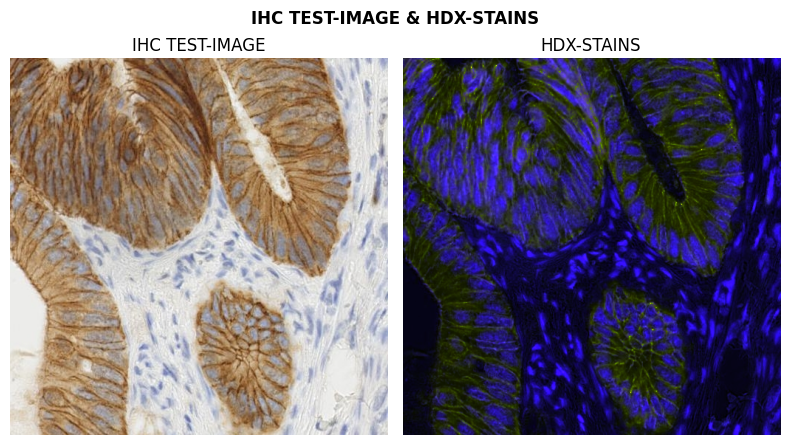

In [98]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // 'DOWNLOADING' THE TEST-IMAGE:
  source_test_ihc_image = sk.data.immunohistochemistry()

  # // ---- // A QUICK PREVIEW OF THE 'DOWNLOADED' DATA:
  test_ihc_hdx          = source_test_ihc_image.copy()

  test_ihc_hdx          = sk.color.separate_stains( test_ihc_hdx , stain_matrix )
  test_ihc_hdx          = normalize_image(test_ihc_hdx)

  test_ihc_hdx          = colorize_image( test_ihc_hdx , **stain_colorize_image_params )

  # // ---- // FIG:
  f_s = 4
  fig, ax = plt.subplots( figsize = (f_s*2, f_s * 1.1) , ncols = 2 , nrows = 1 )
  fig.suptitle( f'IHC TEST-IMAGE & HDX-STAINS' , fontweight = 'bold' , y = 1.002)

  ax[0].imshow( source_test_ihc_image )
  ax[0].set_title( 'IHC TEST-IMAGE' )
  ax[0].axis('off')

  ax[1].imshow( test_ihc_hdx   )
  ax[1].set_title( 'HDX-STAINS' )
  ax[1].axis('off')

  fig.tight_layout()

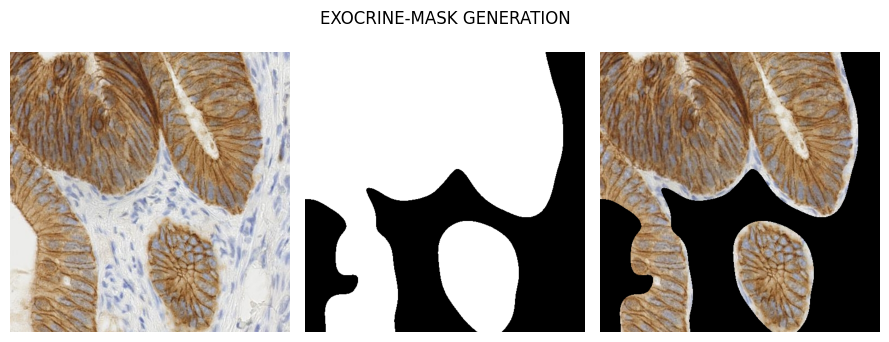

In [99]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // FAKE-EXOCRINE (MANUAL)-MASK GENERATION:
  source_simulated_exocrine_mask = source_test_ihc_image.copy()


  # // ---- // BINARIZING THE IMAGE AND BLURRING IT (multiple times for morphology):
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point ] = 255

  source_simulated_exocrine_mask = image_blur( source_simulated_exocrine_mask , 1 )

  # // --|> AGAIN...:
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point ] = 255

  source_simulated_exocrine_mask = image_blur( source_simulated_exocrine_mask , 2 )

  # // --|> AGAIN...:
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point * 0.85 ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point * 0.85 ] = 255

  source_simulated_exocrine_mask = image_blur( source_simulated_exocrine_mask , 4 )

  # // --|> AGAIN...:
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point * 0.75 ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point * 0.75 ] = 255

  # // --|> AGAIN...:
  source_simulated_exocrine_mask = image_blur( source_simulated_exocrine_mask , 8 )

  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point * 0.45 ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point * 0.45 ] = 255

  # // --|> AGAIN...:
  source_simulated_exocrine_mask = image_blur( source_simulated_exocrine_mask , 16 )

  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] <  source_simulated_exocrine_mask_threshold_point * 1.3 ] = 0
  source_simulated_exocrine_mask[source_simulated_exocrine_mask[:,:,0] >= source_simulated_exocrine_mask_threshold_point * 1.3 ] = 255

  # // --|> FLIPPING THE MASK:
  source_simulated_exocrine_mask = 255 - source_simulated_exocrine_mask


  f_s = 3
  fig, ax = plt.subplots(1, 3, figsize=(f_s * 3, f_s * 1.15))
  fig.suptitle(
      f'EXOCRINE-MASK GENERATION'
              )

  a_test_ihc_image                 = source_test_ihc_image
  a_test_exocrine_mask             = source_simulated_exocrine_mask
  a_test_exocrine_masked_ihc_image = image_mask_multiply( a_test_ihc_image , a_test_exocrine_mask )

  ax[0].imshow(a_test_ihc_image)
  ax[0].axis('off')
  ax[1].imshow(a_test_exocrine_mask)
  ax[1].axis('off')
  ax[2].imshow(a_test_exocrine_masked_ihc_image)
  ax[2].axis('off')

  fig.tight_layout()

In [100]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // ESTABLISHING THE RANDOM GENERATOR SEED:
  np.random.seed(fake_random_seed)

  # // ---- // GENERATING (via data augmentation) IHC TEST-IMAGES:
  source_augmented_test_ihc_images = augment_image(
    source_test_ihc_image               ,
    **data_augmentation_pipeline_params ,
                                                  )

In [101]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // ESTABLISHING THE RANDOM GENERATOR SEED:
  np.random.seed(fake_random_seed)

  # // ---- // GENERATING CORRESPONDING EXOCRINE MASKS FOR THE IHC TEST-IMAGES:
  source_augmented_test_exocrine_masks = augment_image(
    source_simulated_exocrine_mask      ,
    **data_augmentation_pipeline_params ,
                                                      )

In [102]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // FAKE-DATA IMG CONTAINERs:
  augmented_dataset_test_images         = []
  augmented_dataset_test_exocrine_masks = []

  # // ---- // WINDOW AUGMENTATION SUB-ROUTINE:
  if num_augmentation_windows > 1:
    # // ---- // APPENDING SOURCE 'FAKE' IMGs (if requested:)
    if include_source_augmentation_images:
      for idx in range( len(source_augmented_test_ihc_images) ):
          augmented_dataset_test_images.append( source_augmented_test_ihc_images[idx] )
          augmented_dataset_test_exocrine_masks.append( source_augmented_test_exocrine_masks[idx] )


    # // ---- // WINDOWED IMGs SUB-ROUTINE:
    for idx, img in enumerate( source_augmented_test_ihc_images ):
      windowed_imgs , windowed_masks = [] , []
      y_size        , x_size         = img.shape[:2]
      y_stride      , x_stride       = y_size // num_augmentation_windows, x_size // num_augmentation_windows

      for y in range(num_augmentation_windows):
        for x in range(num_augmentation_windows):
          y_start, y_end = y * y_stride, (y + 1) * y_stride
          x_start, x_end = x * x_stride, (x + 1) * x_stride

          windowed_img  = img[y_start:y_end, x_start:x_end]
          windowed_mask = source_augmented_test_exocrine_masks[idx][y_start:y_end, x_start:x_end]

          windowed_img  = np.asarray( im.fromarray( windowed_img  ).resize( img.shape[:2][::-1] , resample = data_augmentation_pipeline_interpolation_method ) ).astype(np.uint8)
          windowed_mask = np.asarray( im.fromarray( windowed_mask ).resize( img.shape[:2][::-1] , resample = data_augmentation_pipeline_interpolation_method ) ).astype(np.uint8)

          windowed_mask[ windowed_mask[:,:,0] <  127 ] = 0
          windowed_mask[ windowed_mask[:,:,0] >= 127 ] = 255

          windowed_imgs.append( windowed_img )
          windowed_masks.append( windowed_mask )

      for w_idx in range( len(windowed_imgs) ):
        augmented_dataset_test_images.append( windowed_imgs[w_idx] )
        augmented_dataset_test_exocrine_masks.append( windowed_masks[w_idx] )

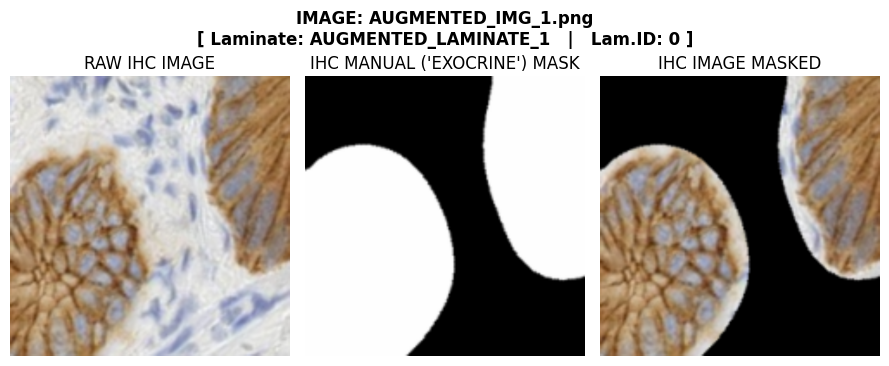

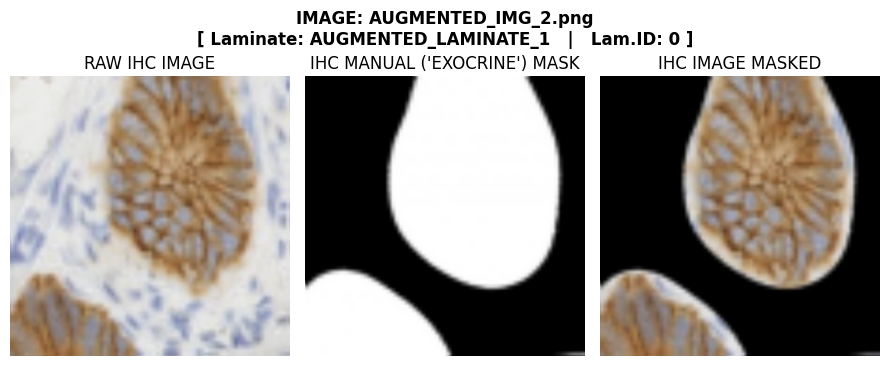

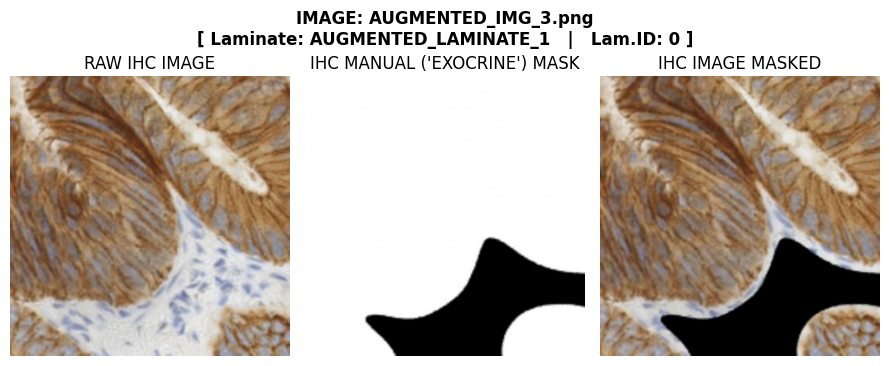

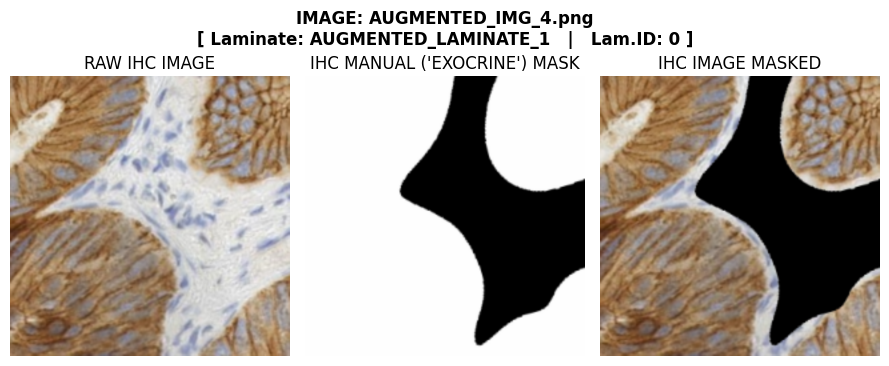

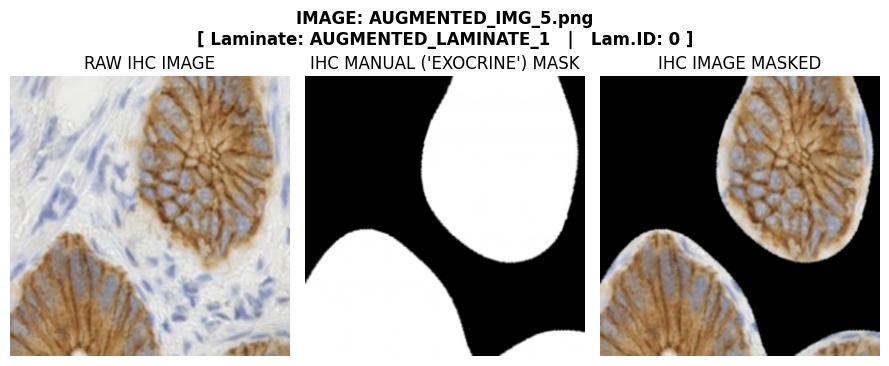

...

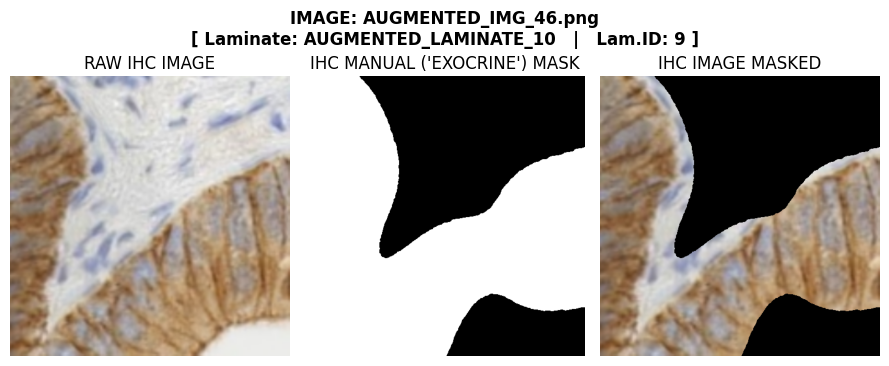

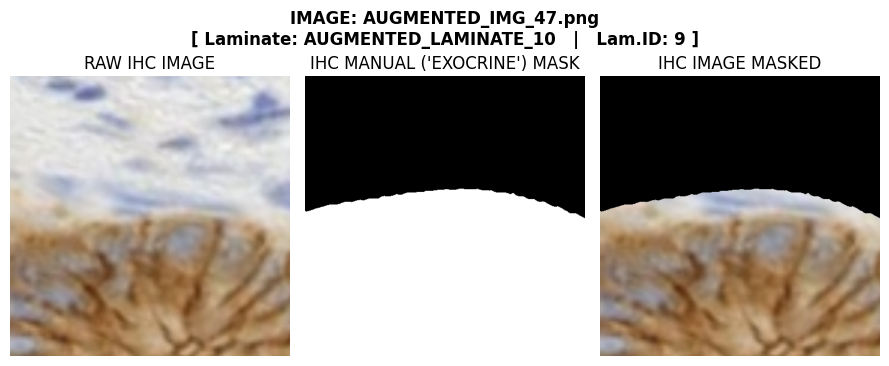

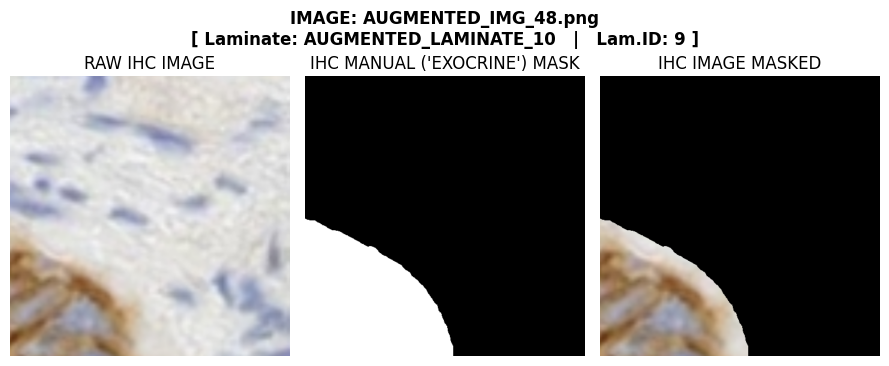

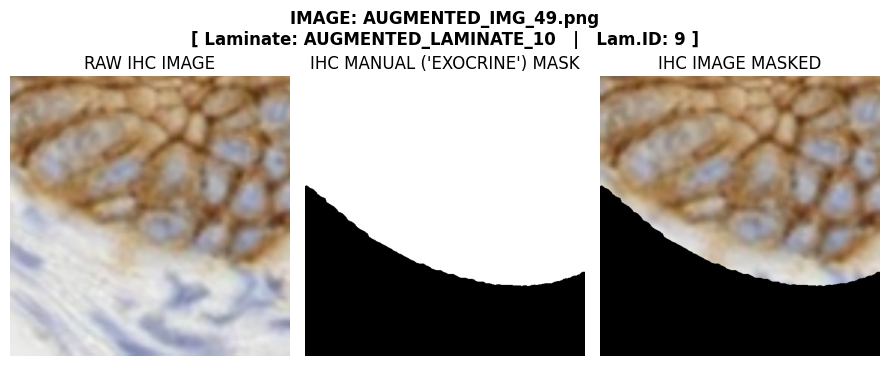

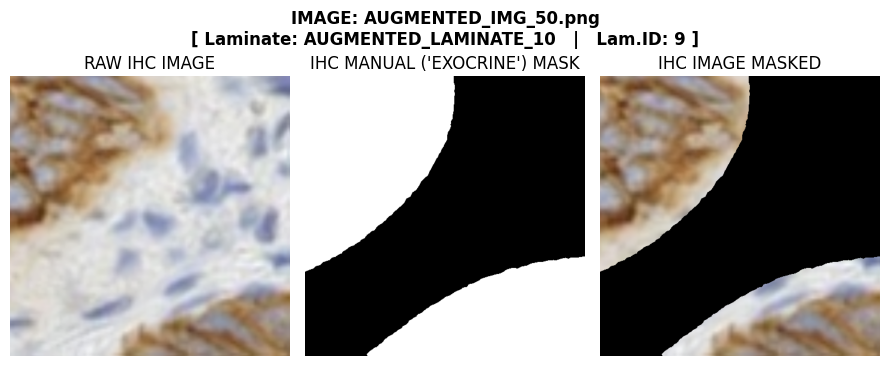

In [103]:
if USE_REPOSITORY_TEST_IMAGE_SET:
  # // ---- // FAKE-DATA GEN / PACKING ROUTINE:
  augmented_dataset_image_names         = [ f'AUGMENTED_IMG_{idx+1}.png'            for idx in range( len( augmented_dataset_test_images         ) ) ]
  source_simulated_exocrine_masks_names = [ f'SIMULATED_EXOCRINE_MASK{idx+1}.png'   for idx in range( len( augmented_dataset_test_exocrine_masks ) ) ]
  fake_laminate_names                   = [ [ f'AUGMENTED_LAMINATE_{idx+1}' , idx ] for idx in range( num_fake_laminates                           ) ]

  imgs_per_laminate = len(augmented_dataset_image_names) // len(fake_laminate_names)

  metadata_entries = {}
  for u in range(len(fake_laminate_names)):
    for i in range(imgs_per_laminate):
      metadata_entries[augmented_dataset_image_names[i + u * imgs_per_laminate]] = fake_laminate_names[u]

  non_registered_images_data = [
    ( img_name , idx ) if img_name not in list(metadata_entries.keys()) else (None , None)
    for idx , img_name in enumerate(augmented_dataset_image_names)
                              ]

  for non_registered_name, non_registered_l_id in non_registered_images_data:
    if non_registered_name is not None and non_registered_l_id is not None:
      metadata_entries[ non_registered_name ] = fake_laminate_names[ non_registered_l_id % len(fake_laminate_names) ]

  f_s = 3
  for idx , ( key , value ) in enumerate(metadata_entries.items()) :
      fig, ax = plt.subplots( figsize = ( f_s * 3 , f_s * 1.25 ) , ncols = 3, nrows = 1 )
      fig.suptitle(
          f'IMAGE: {key}\n[ Laminate: {value[0]}   |   Lam.ID: {value[1]} ]' ,
          fontweight = 'bold'                                                ,
                  )

      a_test_ihc_image                 = augmented_dataset_test_images[idx]
      a_test_exocrine_mask             = augmented_dataset_test_exocrine_masks[idx]
      a_test_exocrine_masked_ihc_image = image_mask_multiply( a_test_ihc_image , a_test_exocrine_mask )

      ax[0].imshow(a_test_ihc_image)
      ax[0].axis('off')
      ax[0].set_title('RAW IHC IMAGE')

      ax[1].imshow(a_test_exocrine_mask)
      ax[1].axis('off')
      ax[1].set_title(f"IHC MANUAL ('EXOCRINE') MASK")

      ax[2].imshow(a_test_exocrine_masked_ihc_image)
      ax[2].axis('off')
      ax[2].set_title('IHC IMAGE MASKED')

      fig.tight_layout()

      plt.show()

      print()

#### // ------------------------------------ //

#### **@ [ ` PIPELINE ` ] - [ ` DATA ` ] - [ ` DATA MANIFEST GENERATION ` ] :**

In [104]:
# // ---- //      0 : CONTROL   ENTRIES.
# // ---- //     -1 : DISCARDED ENTRIES.
# // ---- // OTHERS : REGULAR ENTRIES [ = ID ].
if USE_REPOSITORY_TEST_IMAGE_SET:
  process_input_images_meta_data = metadata_entries           # ||==|>           EXTRACT PROCESS INPUT IMAGES' META-DATA FROM THE EXEMPLARY "fake IHC" AUGMENTED DATASET.
else:
  process_input_images_meta_data = {
  ###########################################################
  # FORMATTING EXAMPLE:                                     #
  ###########################################################
  # | IMAGE NAME   |  ( LAMINATE NAME   |      L. ID )    | #
  ###########################################################
  #                                                         #
    'Img_CTRL.tiff' : [ 'LAMINATE_00'   ,        0        ] , # ||==|>           CONTROLs HAVE TO HAVE A LAMINATE ID OF "0".
    'Img_001.tiff'  : [ 'LAMINATE_01'   ,        1        ] ,
    'Img_002.tiff'  : [ 'LAMINATE_01'   ,        1        ] ,
    'Img_003.tiff'  : [ 'LAMINATE_02'   ,        2        ] ,
    'Img_004.tiff'  : [ 'LAMINATE_03'   ,       -1        ] , # ||==|>           DISCARDABLE ENTRIES HAVE A LAMINATE ID OF "-1" (these entries are not taken into account for final analysis)-
  #                                                         #
  ###########################################################
                                  }

process_input_images_meta_data

{'AUGMENTED_IMG_1.png': ['AUGMENTED_LAMINATE_1', 0],
 'AUGMENTED_IMG_2.png': ['AUGMENTED_LAMINATE_1', 0],
 'AUGMENTED_IMG_3.png': ['AUGMENTED_LAMINATE_1', 0],
 'AUGMENTED_IMG_4.png': ['AUGMENTED_LAMINATE_1', 0],
 'AUGMENTED_IMG_5.png': ['AUGMENTED_LAMINATE_1', 0],
 'AUGMENTED_IMG_6.png': ['AUGMENTED_LAMINATE_2', 1],
 'AUGMENTED_IMG_7.png': ['AUGMENTED_LAMINATE_2', 1],
 'AUGMENTED_IMG_8.png': ['AUGMENTED_LAMINATE_2', 1],
 'AUGMENTED_IMG_9.png': ['AUGMENTED_LAMINATE_2', 1],
 'AUGMENTED_IMG_10.png': ['AUGMENTED_LAMINATE_2', 1],
 'AUGMENTED_IMG_11.png': ['AUGMENTED_LAMINATE_3', 2],
 'AUGMENTED_IMG_12.png': ['AUGMENTED_LAMINATE_3', 2],
 'AUGMENTED_IMG_13.png': ['AUGMENTED_LAMINATE_3', 2],
 'AUGMENTED_IMG_14.png': ['AUGMENTED_LAMINATE_3', 2],
 'AUGMENTED_IMG_15.png': ['AUGMENTED_LAMINATE_3', 2],
 'AUGMENTED_IMG_16.png': ['AUGMENTED_LAMINATE_4', 3],
 'AUGMENTED_IMG_17.png': ['AUGMENTED_LAMINATE_4', 3],
 'AUGMENTED_IMG_18.png': ['AUGMENTED_LAMINATE_4', 3],
 'AUGMENTED_IMG_19.png': ['AUGMENTED_

In [105]:
process_input_images_to_discard = {}

if process_input_images_meta_data is not None:
  for image_name, ( laminate_name , laminate_id ) in process_input_images_meta_data.items():
    if laminate_id == -1: process_input_images_to_discard[ image_name ] = laminate_name

if process_input_images_to_discard == {}:
  process_input_images_to_discard = None

print( "PROCESS INPUT IMAGES TO DISCARD: ", process_input_images_to_discard )

PROCESS INPUT IMAGES TO DISCARD:  None


In [106]:
# // ---- // LAST VALIDATION STEP FOR THE ENTIRE SET'S INCLUSION DEFINITIONs:
if process_input_images_to_discard is not None:
  valid_names   = []
  valid_indices = []
  for idx, name in enumerate( process_input_images_meta_data.keys() ):
    if name not in process_input_images_to_discard.keys(): # // ---- // (-1) TAG = DISCARDED ENTRY.
      valid_names.append(name)
      valid_indices.append(idx)
else:
  valid_names   = None
  valid_indices = None

print( "VALID NAMES   :" , valid_names   )
print( "VALID INDICES :" , valid_indices )

VALID NAMES   : None
VALID INDICES : None


#### // ------------------------------------ //

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` DEFINITIONS ` ] :**

#### // ------------------------------------ //

#### **@ [ ` PIPELINE-PROCESSING ` ] :**

##### // ------------------------- //

##### **@ [ ` PRE-PROCESSING ` ] - [ ` STEP-01 ` ] - EXTRACTING / FORMATTING THE INPUT DATA-SETs :**

In [107]:
def PIPELINE_INPUT_PRE_PROCESSING(
      process_input_rgb_dataset          ,
      process_input_manual_masks_dataset ,
                                 ):
  """PIPELINE: Packing the input dataset under the desired 'work-format'.

  Args:
    process_input_rgb_dataset: the "raw" dataset to utilize as input dataset for the Pipeline (must be one of RGB images).

  Returns:
    A tuple of data containing names , images and their respective processed manual masks:
      1 - process_image_names: A list containing the names of the images on the set.
      2 - process_input_images: A list containing the images on the set.
      3 - process_manual_masks: A list containing the manual masks images on the set.
  """
  # // ------------------------------------------- //
  # // ------- || INPUT-SET DESIGNATION || ------- //
  # // ------------------------------------------- //

  # // ---- // RELEVANT PRE-PROCESSED SETS FOR FIGURE ANALYSIS:
  process_image_names  = []
  process_input_images = []
  process_manual_masks = []


  # // ---- // TRAVERSING THE INPUT RGBs SET:
  for entry_idx , raw_entry in enumerate( process_input_rgb_dataset ):

    # // ---- // EXTRACT BASIC META-DATA & RAW IMAGE:
    process_image_name  = raw_entry[2].split('.')[0].upper()
    process_input_image = raw_entry[1]

  # // ----- // APPEND IMAGES TO COLLECTIONS:
    process_image_names.append ( process_image_name  )
    process_input_images.append( process_input_image )

  # // ------------------------------------------- //


  # // ---- // TRAVERSING THE INPUT MASKs SET:
  for entry_idx , raw_entry in enumerate( process_input_manual_masks_dataset ):

    # // ---- // EXTRACT THE RAW 'MANUAL MASK' IMAGE:
    process_manual_mask = raw_entry[1][:,:,:3]

    # // ---- // PROCESSED MANUAL MASK:
    process_manual_mask = dtyped_image( process_manual_mask , np.float32 ).mean(axis = -1)
    process_manual_mask[ process_manual_mask  < 0.5 ] = 0
    process_manual_mask[ process_manual_mask >= 0.5 ] = 1
    process_manual_mask = np.dstack( ( process_manual_mask , ) * 3 )

  # // ----- // APPEND IMAGES TO COLLECTIONS:
    process_manual_masks.append( process_manual_mask )

  # // ------------------------------------------- //


  # // ------------------------------------------- //
  # // ----- || INPUT-SETs' FORMAT PACKING || ---- //
  # // ------------------------------------------- //

  # // ---- // TURN THE COLLECTION-LISTs INTO ARRAYs:
  process_image_names  = np.asarray( process_image_names  )
  process_input_images = np.asarray( process_input_images )
  process_manual_masks = np.asarray( process_manual_masks )

  # // ---- // WILL PROCESS IMAGES ON SET AND PUT THEM UNDER THE REQUESTED DTYPE:
  process_input_images = dtyped_image( process_input_images , dtype = np.uint8 )
  process_manual_masks = dtyped_image( process_manual_masks , dtype = np.uint8 )
  # // ------------------------------------------- //


  # // ------------------------------------------- //
  # // ----------- || RETURN TUPLE || ------------ //
  # // ------------------------------------------- //

  return (
    process_image_names  ,
    process_input_images ,
    process_manual_masks ,
         )

  # // ------------------------------------------- //

##### // ------------------------- //

##### **@ [ ` PRE-PROCESSING ` ] - [ ` STEP-02 ` ] - HISTOGRAM MATCHING REFERENCES ESTABLISHMENT :**

In [108]:
def PIPELINE_HISTOGRAM_MATCHING_REFERENCES_DEFINITION(
    histogram_matching_rgb_reference_index                     ,
    histogram_matching_stain_reference_index                   ,
    match_input_rgb_images                             = False ,
    match_stain_images                                 = False ,
    normalize_histogram_matching_rgb_reference_image   = False ,
    normalize_histogram_matching_stain_reference_image = False ,
    full_data_compute_pipeline                         = False ,
                                                     ):
  """PIPELINE: Defining the pre-processing of (& extracting) the relevant histogram-matching references for the Pipeline.

  Args:
    histogram_matching_rgb_reference_index: An integer representing the index of the rgb histogram-matching reference image.
    histogram_matching_stain_reference_index: An integer representing the index of the stain-marker histogram-matching reference image.
    match_input_rgb_images: A boolean indicating whether to match the input rgb images or not.
    match_stain_images:  A boolean indicating whether to match the input stain images or not.
    normalize_histogram_matching_rgb_reference_image: A boolean indicating whether to normalize the rgb histogram-matching reference image or not.
    normalize_histogram_matching_stain_reference_image: A boolean indicating whether to normalize the stain-marker histogram-matching reference image or not.
    full_data_compute_pipeline: A boolean indicating whether to compute all outputs or not (regardless of individually-set flags).

  Returns:
    A tuple of histogram-matching reference images:
      1 - histogram_matching_rgb_reference_image: The rgb histogram-matching reference image.
      2 - histogram_matching_stain_reference_image: The stain-marker histogram-matching reference image.
    Note: You must assign to a variable all returnable images regardless of whether they will be generated or not; Non-requested images are returned as "None" objects.
  """
  # // ---------------------------------------------------- //
  # // ------- || HISTOGRAM-MATCHING DEFINITIONS  || ------ //
  # // ---------------------------------------------------- //

  # // ---- // DEFINING THE HISTOGRAM-MATCHING REFERENCES:
  if match_input_rgb_images or full_data_compute_pipeline:
    histogram_matching_rgb_reference_image   = process_input_images[
        histogram_matching_rgb_reference_index
                                                                   ]
  else:
    histogram_matching_rgb_reference_image = None

  if match_stain_images or full_data_compute_pipeline:
    histogram_matching_stain_reference_image = sk.color.separate_stains(
    process_input_images[ histogram_matching_stain_reference_index ] ,
    conv_matrix = stain_matrix                                       ,
                                                                       )
  else:
    histogram_matching_stain_reference_image = None

  # // ---- // NORMALIZE THE HISTOGRAM-MATCHING REFERENCES (if requested):
  if histogram_matching_rgb_reference_image is not None:
    if match_input_rgb_images or full_data_compute_pipeline:
      if normalize_histogram_matching_rgb_reference_image:
        histogram_matching_rgb_reference_image   = normalize_image(
          histogram_matching_rgb_reference_image ,
          **rgb_normalization_params             ,
                                                                  )

  if histogram_matching_stain_reference_image is not None:
    if match_stain_images or full_data_compute_pipeline:
      if normalize_histogram_matching_stain_reference_image:
        histogram_matching_stain_reference_image = normalize_image(
            histogram_matching_stain_reference_image ,
            **stain_normalization_params             ,
                                                                  )

  # // ---------------------------------------------------- //


  # // ---------------------------------------------------- //
  # // -------------- || DATA-RETURN PHASE || ------------- //
  # // ---------------------------------------------------- //

  return (
    histogram_matching_rgb_reference_image   ,
    histogram_matching_stain_reference_image ,
         )

  # // ---------------------------------------------------- //

##### // ------------------------- //

##### **@ [ ` PRE-PROCESSING ` ] - [ ` STEP-03 ` ] - CONTROLS' STATISTICS :**

In [109]:
def PIPELINE_CONTROLS_STATISTICS_EXTRACTION(
  control_01_index                                              ,
  control_02_index                                              ,
  normalize_controls                                    = False ,
  histogram_match_controls                              = False ,
  use_masked_control_images_for_threshold_determination = False ,
  use_exo_masked_data_for_threshold_determination       = False ,
  remove_zeros_from_controls_data                       = False ,
                                           ):
  """PIPELINE: Extracting the relevant data from the control images.

  Args:
      control_01_index: An integer representing index of the first control image.
      control_02_index: An integer representing index of the second control image.
      normalize_controls: A boolean indicating whether to normalize the controls as pre-processing or not.
      histogram_match_controls: A boolean indicating whether to histogram-match the controls as pre-processing or not.
      use_masked_control_images_for_threshold_determination: A boolean indicating whether to use masked control images for threshold determination or not.
      use_exo_masked_data_for_threshold_determination: A boolean indicating whether to use exo-masked data for threshold determination or not.
      remove_zeros_from_controls_data: A boolean indicating whether to remove zeros from the controls data or not.

  Returns:
      A tuple of sets of images & data units:
        1 - control_01_rgb: The rgb image of the control 01 sample.
        2 - control_02_rgb: The rgb image of the control 02 sample.
        3 - control_01_stain_marker: The stain-marker image of the control 01 sample.
        4 - control_02_stain_marker: The stain-marker image of the control 02 sample.
        5 - control_01_stain_marker_raw: The raw stain-marker image of the control 01 sample.
        6 - control_02_stain_marker_raw: The raw stain-marker image of the control 02 sample.
        7 - controls_stain_raw_data: The raw stain-data of the controls.
        8 - controls_stain_data: The stain-data of the controls.
      Note: You must assign to a variable all returnable sets regardless of whether they will be generated or not; Non-requested sets are returned as "None" objects.
  """
  # // ---------------------------------------------------- //
  # // ---------- || CONTROLS'PROCESSING PHASE || --------- //
  # // ---------------------------------------------------- //

  # // ---- // DEFINING THE CONTROL IMAGES:
  control_01_rgb                     = process_input_images[ control_01_index ]
  control_02_rgb                     = process_input_images[ control_02_index ]

  # // ---- // EXTRACTING THE STAIN-IMAGES FROM THE CONTROL IMAGES:
  control_01_stain_marker            = sk.color.separate_stains( control_01_rgb , conv_matrix = stain_matrix )
  control_02_stain_marker            = sk.color.separate_stains( control_02_rgb , conv_matrix = stain_matrix )

  # // ---- // EXTRACT RAW IMAGEs REGARDLESS OF PARAMETERs (for Figs):
  control_01_stain_marker_raw        = control_01_stain_marker.copy()
  control_02_stain_marker_raw        = control_02_stain_marker.copy()

  # // ---- // EXTRACT RAW DATA REGARDLESS OF PARAMETERs (for Figs):
  control_01_stain_marker_raw_data   = control_01_stain_marker_raw.copy()
  control_02_stain_marker_raw_data   = control_02_stain_marker_raw.copy()

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ---------- || CONTROLS'PROCESSING PHASE || --------- //
  # // ----------------- ||OPTIONALs || ------------------- //

  # // ---- // NORMALIZE THE CONTROLS (if requested):
  if normalize_controls:
    # // --|> NORMALIZED STAIN MARKERs:
    control_01_stain_marker_normalized = normalize_image( control_01_stain_marker , **stain_normalization_params )
    control_02_stain_marker_normalized = normalize_image( control_02_stain_marker , **stain_normalization_params )
    # // --|> COPYING  NORMALIZED IMAGES TO THE THE 'PROCESS' VARs:
    control_01_stain_marker            = control_01_stain_marker_normalized.copy()
    control_02_stain_marker            = control_01_stain_marker_normalized.copy()

  # // ---- // HISTOGRAM-MATCH THE CONTROLS (if requested):
  if histogram_match_controls:
    # // --|> HISTOGRAM-MATCHED STAIN MARKERs:
    control_01_stain_marker_histogram_matched = histogram_match_image( control_01_stain_marker , histogram_matching_stain_reference_image )
    control_02_stain_marker_histogram_matched = histogram_match_image( control_02_stain_marker , histogram_matching_stain_reference_image )
    # // --|> COPYING  NORMALIZED IMAGES TO THE THE 'PROCESS' VARs:
    control_01_stain_marker                   = control_01_stain_marker_histogram_matched.copy()
    control_02_stain_marker                   = control_01_stain_marker_histogram_matched.copy()

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ---------- || CONTROLS'PROCESSING PHASE || --------- //
  # // ----------------- || MANDATORIES || ---------------- //

  # // ---- // MASKING THE CONTROL IMAGES:
  control_01_stain_marker_masked              = dtyped_image( image_mask_multiply( control_01_stain_marker          ,       process_manual_masks[ control_01_index ] ) , dtype = control_01_stain_marker.dtype )
  control_02_stain_marker_masked              = dtyped_image( image_mask_multiply( control_02_stain_marker          ,       process_manual_masks[ control_02_index ] ) , dtype = control_02_stain_marker.dtype )

  control_01_stain_marker_exo_masked          = dtyped_image( image_mask_multiply( control_01_stain_marker          , 255 - process_manual_masks[ control_01_index ] ) , dtype = control_01_stain_marker.dtype )
  control_02_stain_marker_exo_masked          = dtyped_image( image_mask_multiply( control_02_stain_marker          , 255 - process_manual_masks[ control_02_index ] ) , dtype = control_02_stain_marker.dtype )

  control_01_stain_marker_raw_data_masked     = dtyped_image( image_mask_multiply( control_01_stain_marker_raw_data ,       process_manual_masks[ control_01_index ] ) , dtype = control_01_stain_marker.dtype )
  control_02_stain_marker_raw_data_masked     = dtyped_image( image_mask_multiply( control_02_stain_marker_raw_data ,       process_manual_masks[ control_02_index ] ) , dtype = control_02_stain_marker.dtype )

  control_01_stain_marker_raw_data_exo_masked = dtyped_image( image_mask_multiply( control_01_stain_marker_raw_data , 255 - process_manual_masks[ control_01_index ] ) , dtype = control_01_stain_marker.dtype )
  control_02_stain_marker_raw_data_exo_masked = dtyped_image( image_mask_multiply( control_02_stain_marker_raw_data , 255 - process_manual_masks[ control_02_index ] ) , dtype = control_02_stain_marker.dtype )

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ------- || PROCESS-CONTROLs DETERMINATION || ------- //
  # // ---------------------------------------------------- //

  # // ---- // DETERMINING THE ANALYSIS' CONTROLs:
  if use_masked_control_images_for_threshold_determination :
    if   use_exo_masked_data_for_threshold_determination   : control_01_stain_marker_data = control_01_stain_marker_exo_masked.copy() ; control_01_stain_marker_raw_data = control_01_stain_marker_raw_data_exo_masked.copy()
    else                                                   : control_01_stain_marker_data = control_01_stain_marker_masked.copy()     ; control_01_stain_marker_raw_data = control_01_stain_marker_raw_data_masked.copy()
  else                                                     : control_01_stain_marker_data = control_01_stain_marker_raw_data          ; control_01_stain_marker_raw_data = control_01_stain_marker_raw_data

  if use_masked_control_images_for_threshold_determination :
    if   use_exo_masked_data_for_threshold_determination   : control_02_stain_marker_data = control_02_stain_marker_exo_masked.copy() ; control_02_stain_marker_raw_data = control_02_stain_marker_raw_data_exo_masked.copy()
    else                                                   : control_02_stain_marker_data = control_02_stain_marker_masked.copy()     ; control_02_stain_marker_raw_data = control_02_stain_marker_raw_data_masked.copy()
  else                                                     : control_02_stain_marker_data = control_02_stain_marker_raw_data          ; control_02_stain_marker_raw_data = control_02_stain_marker_raw_data

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ------- || CONTROLS' POST PROCESSING PHASE || ------ //
  # // ---------------------------------------------------- //

  # // ---- // TRIM-OUT THE MASKED VALUES (out of the data-set):
  if remove_zeros_from_controls_data:
    control_01_stain_marker_data     = control_01_stain_marker_data    [ control_01_stain_marker_data    [:,:,mask_channel] != 0 ]
    control_02_stain_marker_data     = control_02_stain_marker_data    [ control_02_stain_marker_data    [:,:,mask_channel] != 0 ]
    control_01_stain_marker_raw_data = control_01_stain_marker_raw_data[ control_01_stain_marker_raw_data[:,:,mask_channel] != 0 ]
    control_02_stain_marker_raw_data = control_02_stain_marker_raw_data[ control_02_stain_marker_raw_data[:,:,mask_channel] != 0 ]

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ------------ || CONTROLS'PACKING PHASE || ---------- //
  # // ---------------------------------------------------- //

  # // ---- // PACKING THE RAW CONTROLS-STAIN DATA:
  controls_stain_raw_data = np.asarray(
  [
    control_01_stain_marker_raw_data ,
    control_02_stain_marker_raw_data ,
  ]                                     ,
  dtype = object                        ,
                                      )

  # // ---- // PACKING THE CONTROLS-STAIN DATA:
  controls_stain_data = np.asarray(
  [
    control_01_stain_marker_data ,
    control_02_stain_marker_data ,
  ]                                 ,
  dtype = object                    ,
                                  )

  # // ---------------------------------------------------- //



  # // ---------------------------------------------------- //
  # // ---------------- || RETURN TUPLE || ---------------- //
  # // ---------------------------------------------------- //

  return (
    control_01_rgb                              ,
    control_02_rgb                              ,
    control_01_stain_marker                     ,
    control_02_stain_marker                     ,
    control_01_stain_marker_raw                 ,
    control_02_stain_marker_raw                 ,
    controls_stain_data                         ,
    controls_stain_raw_data                     ,
         )

  # // ---------------------------------------------------- //


##### // ------------------------- //

##### **@ [ ` PROCESS ` ] - [ ` STEP-04 ` ] - STAIN-IMAGES ANALYSIS / THRESHOLD MASK GENERATION :**

In [110]:
def PIPELINE_STAIN_SEGMENTATION_PROCESS(
  process_input_images                                            ,
  process_manual_masks                                            ,
  controls_stain_data                                             ,
  threshold_determinator_functor = threshold_determinator_functor ,
  threshold_mixer_functor        = threshold_mixer_functor        ,
  threshold_factor               = 1.                             ,
  subtractive_influence          = 0.                             ,
  stain_blur_factor              = None                           ,
  normalize_input_rgb_images     = True                           ,
  match_input_rgb_images         = True                           ,
  normalize_stain_images         = True                           ,
  match_stain_images             = True                           ,
  binarize_mask                  = True                           ,
  binarize_blurred_mask          = False                          ,
                                        ):
  """The Main Processing Pipeline for the Stain-Images.

  Args:
      process_input_images: A collection of RGB images.
      process_manual_masks: A collection of manual masks roughly segmenting the islets of the image.
      controls_stain_data: The "Controls' Data Unit" collection.
      threshold_determinator_functor: The threshold-determinator functor.
      threshold_mixer_functor: The threshold-mixer functor.
      threshold_factor: The threshold-factor.
      subtractive_influence: The subtractive influence.
      stain_blur_factor: The stain blur factor.
      normalize_input_rgb_images: Whether to normalize the input images as pre-processing.
      match_input_rgb_images: Whether to match the input images as pre-processing.
      normalize_stain_images: Whether to normalize the stain images as pre-processing.
      match_stain_images: Whether to match the stain images as pre-processing.
      binarize_mask: Whether to binarize the masks.
      binarize_blurred_mask: Whether to binarize the masks after blurring them for morphological operations to minimize noise-driven errors.

  Returns:
      A tuple of sets of images:
          1 - process_normalized_rgb_images: the normalized rgb images (if requested).
          2 - process_histogram_matched_rgb_images: the histogram-matched rgb images (if requested).
          3 - process_normalized_stain_images: the normalized stain-images (if requested).
          4 - process_histogram_matched_stain_images: the histogram-matched stain-images (if requested).
          5 - process_threshold_masks: the generated threshold-masks.
          6 - process_masked_rgb_images: the generated masked images.
          7 - process_stain_images: the generated, fully visible stain-images.
          8 - process_masked_stain_images: the generated, masked stain-images.
          9 - process_threshold_point: the process-defined threshold-point.
      Note: You must assign to a variable all returnable sets regardless of whether they will be generated or not; Non-requested sets are returned as "None" objects.
  """


  # // ---- // FILL-IN DATA LIST-ARRAYs:
  if   normalize_input_rgb_images : process_normalized_rgb_images          = []
  else                            : process_normalized_rgb_images          = None
  if   match_input_rgb_images     : process_histogram_matched_rgb_images   = []
  else                            : process_histogram_matched_rgb_images   = None
  if   normalize_stain_images     : process_normalized_stain_images        = []
  else                            : process_normalized_stain_images        = None
  if   match_stain_images         : process_histogram_matched_stain_images = []
  else                            : process_histogram_matched_stain_images = None
  process_masked_rgb_images   = []
  process_stain_images        = []
  process_masked_stain_images = []
  process_threshold_masks     = []

  # // ---- // DEFINING THE THRESHOLDING METHODOLOGY:
  control_stats = []
  for control in controls_stain_data:
    control_stat = threshold_determinator_functor( control )
    control_stats.append( control_stat )

  # // ---- // DEFINE THE ACTUAL THRESHOLD AND HEMOTOXIN-INFLUENCE FACTORs:
  process_threshold_point = threshold_mixer_functor( control_stats ) * threshold_factor
  sub_influence           = process_threshold_point * subtractive_influence

  # // ---- // ROUTINE:
  for img_idx in range( len(process_input_images) ):
    # // ---- // PROCESS IMAGES:
    img    = process_input_images[ img_idx ]
    m_mask = process_manual_masks[ img_idx ]

    # // ---- // SOURCE-IMG:
    input_img = img.copy()
    if normalize_input_rgb_images:
      input_img = normalize_image(
        input_img                     ,
        normalize_per_channel = False ,
                                 )
      rgb_normalized = input_img.copy()

    if match_input_rgb_images:
      input_img = histogram_match_image(
        input_img                                     ,
        histogram_matching_rgb_reference_image        ,
        match_per_channel                      = True ,
                                       )
      rgb_hist_matched = input_img.copy()

    # // ---- // HED-IMG:
    stain_marker_image = sk.color.separate_stains(
      input_img                  ,
      conv_matrix = stain_matrix ,
                                                 )

    if normalize_stain_images:
      stain_marker_image = normalize_image(
        stain_marker_image            ,
        normalize_per_channel = False ,
                                          )
      stain_normalized = stain_marker_image.copy()

    if match_stain_images:
      stain_marker_image = histogram_match_image(
        stain_marker_image                              ,
        histogram_matching_stain_reference_image        ,
        match_per_channel                        = True ,
                                                )
      stain_hist_matched = stain_marker_image.copy()



    # // ---- // MASK-THRESHOLDING:
    process_threshold_mask = (
        ( stain_marker_image[: , : , mask_channel             ]                 ) -
        ( stain_marker_image[: , : , subtractive_mask_channel ] * sub_influence )
                             )
    if binarize_mask:
      process_threshold_mask[ process_threshold_mask >  process_threshold_point ] = 1
    process_threshold_mask  [ process_threshold_mask <= process_threshold_point ] = 0

    # // ---- // MASK-BLUR:
    if stain_blur_factor is not None:
      process_threshold_mask = dtyped_image(
          image_blur( dtyped_image( process_threshold_mask , np.uint8 ) , stain_blur_factor ) ,
          np.float32                                                                          ,
                                           )

      if binarize_blurred_mask:
        process_threshold_mask[ process_threshold_mask >  0.5 ] = 1
      process_threshold_mask  [ process_threshold_mask <= 0.5 ] = 0

    process_threshold_mask = dtyped_image( process_threshold_mask        , dtype = np.uint8 )
    process_threshold_mask = np.dstack   ( (process_threshold_mask,) * 3                    )


    # // ---- // MANUAL MASK APPLICATION:
    process_threshold_mask = normalize_image( image_mask_multiply( process_threshold_mask , m_mask ) )

    # // ---- // VIZ-IMG MASKING:
    img_masked       = image_mask_multiply     ( img / 255  , process_threshold_mask     )
    hedab_img        = sk.color.separate_stains( img        , conv_matrix = stain_matrix )
    hedab_img_masked = image_mask_multiply     ( hedab_img  , process_threshold_mask     )

    # // ---- /// PROCESS COLLECTION:
    if normalize_input_rgb_images : process_normalized_rgb_images          .append( rgb_normalized     )
    if match_input_rgb_images     : process_histogram_matched_rgb_images   .append( rgb_hist_matched   )
    if normalize_stain_images     : process_normalized_stain_images        .append( stain_normalized   )
    if match_stain_images         : process_histogram_matched_stain_images .append( stain_hist_matched )
    process_threshold_masks    .append( process_threshold_mask )
    process_masked_rgb_images  .append( img_masked             )
    process_stain_images       .append( hedab_img              )
    process_masked_stain_images.append( hedab_img_masked       )


  # // ---- //  TRANSFORMING THE COLLECTION-LISTs INTO ARRAYs:
  if normalize_input_rgb_images : process_normalized_rgb_images          = np.asarray( process_normalized_rgb_images          )
  if match_input_rgb_images     : process_histogram_matched_rgb_images   = np.asarray( process_histogram_matched_rgb_images   )
  if normalize_stain_images     : process_normalized_stain_images        = np.asarray( process_normalized_stain_images        )
  if match_stain_images         : process_histogram_matched_stain_images = np.asarray( process_histogram_matched_stain_images )
  process_threshold_masks     = np.asarray( process_threshold_masks     )
  process_masked_rgb_images   = np.asarray( process_masked_rgb_images   )
  process_stain_images        = np.asarray( process_stain_images        )
  process_masked_stain_images = np.asarray( process_masked_stain_images )


  # // ---- // PUTTING THE IMAGE-SETs UNDER THE PREFERED DTYPE (np.uint8):
  if normalize_input_rgb_images   : process_normalized_rgb_images          = ( ( process_normalized_rgb_images          ) * 1   ).astype( np.uint8 )
  if match_input_rgb_images       : process_histogram_matched_rgb_images   = ( ( process_histogram_matched_rgb_images   ) * 1   ).astype( np.uint8 )
  if normalize_stain_images       : process_normalized_stain_images        = ( ( process_normalized_stain_images        ) * 255 ).astype( np.uint8 )
  if match_stain_images           : process_histogram_matched_stain_images = ( ( process_histogram_matched_stain_images ) * 255 ).astype( np.uint8 )
  process_threshold_masks     = ( ( process_threshold_masks / process_threshold_masks.max() ) * 255 ).astype( np.uint8 )
  process_masked_rgb_images   = ( ( process_masked_rgb_images                               ) * 255 ).astype( np.uint8 )
  process_stain_images        = ( ( process_stain_images                                    ) * 255 ).astype( np.uint8 )
  process_masked_stain_images = ( ( process_masked_stain_images                             ) * 255 ).astype( np.uint8 )

  # // ---- // RETURN PHASE:
  return (
    process_normalized_rgb_images          ,
    process_histogram_matched_rgb_images   ,
    process_normalized_stain_images        ,
    process_histogram_matched_stain_images ,
    process_threshold_masks                ,
    process_masked_rgb_images              ,
    process_stain_images                   ,
    process_masked_stain_images            ,
    process_threshold_point                ,
         )

##### // ------------------------- //

#### // ------------------------------------ //

#### **@ [ ` PIPELINE-FIGURES ` ] :**

##### // ------------------------- //

##### **@ [ ` FIG ` ] - RGB IMAGE-SET PRE-PROCESSING PIPELINEs - HISTOGRAM ANALYSIS :**

In [111]:
def FIGURE_FULL_SET_PROCESS_HISTOGRAM_COMPARISON(
    entry_index                                               ,
    fig_raw_images                                            ,
    fig_histogram_matching_reference_image                    ,
    fig_colors                             = rgb_colors       ,
    fig_acronym                            = rgb_acronym      ,
    fig_chs_acronyms                       = rgb_chs_acronyms ,
    fig_bins                               = None             ,
    fig_ranges                             = None             ,
    fig_colorize_images                    = False            ,
    fig_colorize_image_params              = None             ,
    alpha_overlay_multiplier               = 1                ,
    f_s                                    = 5                ,
    return_figure                          = False            ,
                                                ):

  # // ---- // INPUT-PROCESS IMAGE-QUALITY COMPARISON / ANALYSIS:

  img_name              = process_image_names [ entry_index ]
  raw_img               = fig_raw_images      [ entry_index ]
  normalized_img        = normalize_image(
      raw_img                       ,
      normalize_per_channel = False ,
                                         )
  histogram_matched_img = histogram_match_image(
      normalized_img                         ,
      fig_histogram_matching_reference_image ,
      match_per_channel = False              ,
                                               )

  if fig_colorize_images:
    v_raw_img               = colorize_image( raw_img               , **fig_colorize_image_params )
    v_normalized_img        = colorize_image( normalized_img        , **fig_colorize_image_params )
    v_histogram_matched_img = colorize_image( histogram_matched_img , **fig_colorize_image_params )
  else:
    v_raw_img               = raw_img
    v_normalized_img        = normalized_img
    v_histogram_matched_img = histogram_matched_img

  if fig_bins   is None : fig_bins   = [ h_bins_0_256  , h_bins_0_256  , h_bins_0_256  ]
  if fig_ranges is None : fig_ranges = [ h_range_0_256 , h_range_0_256 , h_range_0_256 ]


  fig, ax = plt.subplots( figsize = (f_s * 2, f_s * 1), ncols = 3, nrows = 2)
  fig.suptitle(f'{img_name}' , fontsize = f_s * 3.5, fontweight = 'bold')

  ax[0,0].set_title( f'RAW {fig_acronym} IMAGE'               , fontweight = 'bold' , fontsize = f_s * 1.5 )
  ax[0,0].imshow   ( v_raw_img                                                                                 )
  ax[0,0].axis     ( 'off'                                                                                     )

  ax[0,1].set_title(f'NORMALIZED {fig_acronym} IMAGE'         , fontweight = 'bold' , fontsize = f_s * 1.5 )
  ax[0,1].imshow   ( v_normalized_img                                                                          )
  ax[0,1].axis     ( 'off'                                                                                     )

  ax[0,2].set_title( f'HISTOGRAM-MATCHED {fig_acronym} IMAGE' , fontweight = 'bold' , fontsize = f_s * 1.5 )
  ax[0,2].imshow   ( v_histogram_matched_img                                                                   )
  ax[0,2].axis     ( 'off'                                                                                     )

  # // ---- // PLOTTING THEIR HISTOGRAMS....
  for method_type_idx in range(3):
    for i, color in enumerate(fig_colors):
      if   method_type_idx == 0 : img_to_chart = raw_img
      elif method_type_idx == 1 : img_to_chart = normalized_img
      elif method_type_idx == 2 : img_to_chart = histogram_matched_img

      flattened_image = img_to_chart[:, :, i].flatten()
      flattened_image = flattened_image[flattened_image != 0]
      hist, bins      = np.histogram(
          flattened_image                        ,
          bins  = fig_bins   [ method_type_idx ] ,
          range = fig_ranges [ method_type_idx ] ,
                                    )
      ax[1 , method_type_idx].plot(
          bins[:-1]                                ,
          hist                                     ,
          color = color                            ,
          alpha = alpha * alpha_overlay_multiplier ,
          label = fig_chs_acronyms[i]              ,
                                  )



    ax[1 , method_type_idx].set_title  (f"{fig_acronym} CHANNEL HISTOGRAMS" , fontweight = 'bold' , fontsize = f_s * 1.5 )
    ax[1 , method_type_idx].set_xlabel ("Pixel Intensity"                                         , fontsize = f_s * 1.5 )
    ax[1 , method_type_idx].set_ylabel ("Frequency"                                               , fontsize = f_s * 1.5 )
    ax[1 , method_type_idx].legend()

  fig.tight_layout()

  if return_figure: plt.close(); return fig
  else            : plt.pause(0.01)

##### // ------------------------- //

##### **@ [ ` FIGs ` ] - [ ` META-FIG ` ] - STAIN SEGMENTATION PROCESS :**

In [112]:
def FIGURE_META_SEGMENTATION_PROCESS_OVERVIEW(
      image_index                       ,
      fig_colorize_image_params         ,
      x_offset                          ,
      remove_empty_frames       = False ,
      f_s                       = 4     ,
      return_figure             = False ,
                                             ):
  # // ---- // AX-TITLEs:
  ax_titles          = [
    f'{rgb_acronym} IMAGE\nRAW'                                           ,
    f'{stain_acronym} IMAGE\nRAW'                                         ,
    f'{stain_acronym} IMAGE\nNORMALIZED'                                  ,
    f'{stain_acronym} IMAGE\nHISTOGRAM-MATCHED'                           ,
    f'{manual_mask_str} MASK'                                             ,
    f'{stain_acronym} IMAGE\nHISTOGRAM-MATCHED\n{manual_mask_str}-MASKED' ,
    f'{threshold_mask_str} MASK\n{stain_ch_acronym}-THRESHOLD DERIVED'    ,
    f'{stain_acronym} IMAGE\nRAW\n{threshold_mask_str}-MASKED'            ,
                       ]

  # // ---- // AX-SIDE-SUB-TITLEs:
  tr_point      = process_threshold_point
  y_ax_d        = { 'y_ticks' : [] , 'y_label' : '[ RAW ]'                             }
  x_ax_d        = { 'x_ticks' : [] , 'x_label' : '[ NORMALIZED (visual enhancement) ]' }



  # // ---- // FIG-GEN ROUTINE:
  # //--|> FIG DATA-READs:
  fig_title      = process_image_names     [ image_index ]
  manual_mask    = process_manual_masks    [ image_index ] / 255.0
  raw_rgb_image  = process_input_images    [ image_index ] / 255.0
  threshold_mask = process_threshold_masks [ image_index ] / 255.0


  # //--|> FIG DUAL IMAGE PARAMs:
  fig_dual_image_params              = dual_image_params.copy()
  fig_dual_image_params['div_color'] = (np.asarray( [ 0.00 , 0.45 , 0.35 ] ) * 1)
  fig_dual_image_params['div_size' ] = 10
  fig_dual_image_params['x_offset' ] = x_offset


  # //--|> FIG-COMPUTED IMAGES:
  raw_stain_image                      = sk.color.separate_stains( raw_rgb_image , conv_matrix = stain_matrix )

  normalized_stain_image               = normalize_image( raw_stain_image , **stain_normalization_params )
  histogram_matched_stain_image        = histogram_match_image( normalized_stain_image , histogram_matching_stain_reference_image , **stain_histogram_matching_params )

  masked_rgb_image                     = image_mask_multiply( raw_rgb_image                 , manual_mask )
  masked_stain_image                   = image_mask_multiply( raw_stain_image               , manual_mask )
  normalized_masked_stain_image        = image_mask_multiply( normalized_stain_image        , manual_mask )
  histogram_matched_masked_stain_image = image_mask_multiply( histogram_matched_stain_image , manual_mask )

  if process_normalized_stain_images        is not None : masked_hed_normalized                 = image_mask_multiply(
      process_normalized_stain_images [ image_index ] ,
      manual_mask                                     ,
                                                                                                                     )
  if process_histogram_matched_stain_images is not None : masked_stain_image_histogram_matched  = image_mask_multiply(
      process_histogram_matched_stain_images [ image_index ] ,
      manual_mask                                            ,
                                                                                                                     )
  if process_masked_stain_images            is not None : process_masked_stain_image_normalized = image_mask_multiply(
      normalize_image(
          process_masked_stain_images[ image_index ] ,
          normalize_per_channel            = False   ,
                     )                                  ,
      manual_mask                                       ,
                                                                                                                     )


  raw_stain_image_dual_image            = dual_image(
      raw_stain_image         ,
      normalized_stain_image  ,
      **fig_dual_image_params ,
                                                    )


  process_masked_stain_image            = image_mask_multiply( raw_stain_image        , threshold_mask )
  process_masked_stain_image_normalized = image_mask_multiply( normalized_stain_image , threshold_mask )
  process_masked_stain_image_dual_image = dual_image(
    process_masked_stain_image            ,
    process_masked_stain_image_normalized ,
    **fig_dual_image_params               ,
                                                    )



  # //--|> FIG'S AX IMAGES [DEFINITIONS]:
  ax_images = [
    raw_rgb_image                         if process_input_images        is not None else None , # 0
    raw_stain_image_dual_image            if process_input_images        is not None else None , # 1
    normalized_stain_image                if process_input_images        is not None else None , # 2
    histogram_matched_stain_image         if process_input_images        is not None else None , # 3
    manual_mask                           if process_manual_masks        is not None else None , # 4
    histogram_matched_masked_stain_image  if process_input_images        is not None else None , # 5
    threshold_mask                        if process_threshold_masks     is not None else None , # 6
    process_masked_stain_image_dual_image if process_masked_stain_images is not None else None , # 7
              ]

  # //--|> FIG'S AX EXCLUSION FLAGs:
  fig_inclusion_indices = []
  for image_index, ax_img in enumerate( ax_images ):
    if ax_img is not None:
      fig_inclusion_indices.append( image_index )


  h_bins_stain  = 4096
  h_range_stain = 0 , raw_stain_image.max()

  # //--|> FIG'S AX DATA UNITS:
  ax_data_units = [
    #     images          titles          ch acronyms        color labels   i rem. XTs   h rem. XTs        bins        ranges(!)     viz norm.   viz colorize   y-ax-d   x-ax-d   threshold   alt h data
    ( ax_images[ 0 ] , ax_titles[ 0 ] , rgb_chs_acronyms   , rgb_colors   , False      , True       , h_bins_0_256  , h_range_0_1    , False    , False        , None   , None   , None      , None                       ) ,
    ( ax_images[ 1 ] , ax_titles[ 1 ] , stain_chs_acronyms , stain_colors , False      , True       , h_bins_stain  , h_range_stain  , False    , True         , y_ax_d , x_ax_d , None      , raw_stain_image            ) ,
    ( ax_images[ 2 ] , ax_titles[ 2 ] , stain_chs_acronyms , stain_colors , False      , True       , h_bins_0_1    , h_range_0_1    , False    , True         , None   , None   , None      , None                       ) ,
    ( ax_images[ 3 ] , ax_titles[ 3 ] , stain_chs_acronyms , stain_colors , False      , True       , h_bins_0_1    , h_range_0_1    , False    , True         , None   , None   , None      , None                       ) ,
    ( ax_images[ 4 ] , ax_titles[ 4 ] , gs_ch_acronyms     , gs_colors    , False      , False      , h_bins_0_256  , h_range_0_1    , False    , False        , None   , None   , None      , None                       ) ,
    ( ax_images[ 5 ] , ax_titles[ 5 ] , stain_chs_acronyms , stain_colors , True       , True       , h_bins_0_1    , h_range_0_1    , False    , True         , None   , None   , tr_point  , None                       ) ,
    ( ax_images[ 6 ] , ax_titles[ 6 ] , gs_ch_acronyms     , gs_colors    , False      , False      , h_bins_0_256  , h_range_0_1    , False    , False        , None   , None   , None      , None                       ) ,
    ( ax_images[ 7 ] , ax_titles[ 7 ] , stain_chs_acronyms , stain_colors , True       , True       , h_bins_0_1    , h_range_stain  , False    , True         , y_ax_d , x_ax_d , None      , process_masked_stain_image ) ,
                  ]
  ax_data_units = np.asarray( ax_data_units , dtype = object ) [ fig_inclusion_indices ]



  # // -------- // FIG-ROUTINE:
  num_cols  = 2
  num_rows  = 4

  slot_figs = []

  for slot_figure_index in range( 2 ):
    slot_ax_data_units = [ ]

    for ax_data_unit_index , ax_data_unit in enumerate( ax_data_units ):
      if   slot_figure_index == 0 and ax_data_unit_index <  4:
        slot_ax_data_units.append( ax_data_unit )
      elif slot_figure_index == 1 and ax_data_unit_index >= 4:
        slot_ax_data_units.append( ax_data_unit )


    fig , ax = plt.subplots(
      figsize = ( f_s * num_cols * 0.75 , f_s * num_rows * 3/4 ) ,
      nrows   = num_rows                                         ,
      ncols   = num_cols                                         ,
                           )

    for ax_data_unit_index , (
          ax_image                ,
          ax_title                ,
          ax_labels               ,
          ax_colors               ,
          ax_remove_extremes      ,
          ax_hist_remove_extremes ,
          ax_bins                 ,
          ax_ranges               ,
          ax_viz_normalize        ,
          ax_viz_colorize         ,
          ax_y_data               ,
          ax_x_data               ,
          ax_threshold_point      ,
          alt_hist_data           ,
                             ) in enumerate( slot_ax_data_units ):

      # // ---- // MODIFYING THE VISUALIZABLE IMAGE:
      if   ax_viz_colorize    : ax_img_viz = colorize_image( ax_image , **fig_colorize_image_params )
      else                    : ax_img_viz = ax_image.copy()
      if   ax_viz_normalize   : ax_img_viz = normalize_image( ax_img_viz , normalize_per_channel = False )
      if   ax_remove_extremes : ax_img_viz[ ax_img_viz.mean(axis = -1) == 0 ] = 1

      # // ---- // IMGs:
      ax[ ax_data_unit_index , 0 ].set_title( ax_title )
      ax[ ax_data_unit_index , 0 ].imshow( ax_img_viz )
      if ax_y_data is not None and ax_x_data is not None:
        ax[ ax_data_unit_index , 0 ].set_yticks( ax_y_data['y_ticks'] )
        ax[ ax_data_unit_index , 0 ].set_ylabel( ax_y_data['y_label'] )
        ax[ ax_data_unit_index , 0 ].set_xticks( ax_x_data['x_ticks'] )
        ax[ ax_data_unit_index , 0 ].set_xlabel( ax_x_data['x_label'] )
      else:
        if remove_empty_frames:
          ax[ ax_data_unit_index , 0 ].axis('off')
        else:
          ax[ ax_data_unit_index , 0 ].set_yticks( [] )
          ax[ ax_data_unit_index , 0 ].set_xticks( [] )

      # // ---- // HISTOGRAMs:
      for i, color in enumerate(ax_colors):
        if   alt_hist_data is not None : flattened_img = alt_hist_data[ : , : , i ]
        else                           : flattened_img = ax_image     [ : , : , i ]
        flattened_img = flattened_img.flatten()
        if ax_hist_remove_extremes:
          flattened_img = flattened_img[ flattened_img != 0            ]
          flattened_img = flattened_img[ flattened_img != ax_ranges[1] ]
        hist, bins    = np.histogram( flattened_img , bins = ax_bins , range = ax_ranges )
        ax[ ax_data_unit_index , 1 ].plot( bins[:-1] , hist , color = color , alpha = alpha , label = ax_labels[i] )

      if   ax_labels[0] == rgb_chs_acronyms[0]   : ax[ ax_data_unit_index , 1 ].set_title ( f"\nCHANNEL HISTOGRAMS\n[ {rgb_acronym} ]"   )
      elif ax_labels[0] == stain_chs_acronyms[0] : ax[ ax_data_unit_index , 1 ].set_title ( f"\nCHANNEL HISTOGRAMS\n[ {stain_acronym} ]" )
      else                                       : ax[ ax_data_unit_index , 1 ].set_title ( f"\nCHANNEL HISTOGRAM\n[ {gs_acronym} ]"     )

      ax[ ax_data_unit_index , 1 ].set_xlabel( "Pixel Intensity" )
      ax[ ax_data_unit_index , 1 ].set_ylabel( "Frequency"       )

      if ax_threshold_point is not None:
        threshold_color = 'black' #ax_colors[mask_channel]
        ax[ ax_data_unit_index , 1 ].axvline( x = ax_threshold_point , color = threshold_color , linestyle = '--' , alpha = 0.75 , label = f'{stain_ch_acronym}-THRESHOLD' )
        for x in np.linspace( 0, ax_threshold_point, int(16 / threshold_cutting_line_skip_interval) ):
          ax[ax_data_unit_index , 1 ].axvline( x = x , color = threshold_color , alpha = alpha * 0.5 , linestyle = '--' )

      ax[ ax_data_unit_index , 1 ].legend()


    fig.tight_layout()

    slot_figs.append( fig )

    plt.close()


  f_s_r   = 0.85
  fig, ax = plt.subplots(
    figsize = ( f_s * num_cols * 2.00 * 0.9 * f_s_r , f_s * num_rows * 3/4 * f_s_r ) ,
    nrows   = 1                                                                      ,
    ncols   = 2                                                                      ,
                        )

  fig.suptitle(
    f'PROCESSING PIPELINE ANALYSIS\n{fig_title}' ,
    fontweight = 'bold'                          ,
    fontsize   = f_s * 6                         ,
              )

  l_fig_img = image_from_figure(slot_figs[0])
  r_fig_img = image_from_figure(slot_figs[1])

  ax[0].imshow( l_fig_img )
  ax[0].axis('off')
  ax[1].imshow( r_fig_img )
  ax[1].axis('off')

  fig.tight_layout()

  if   return_figure : plt.close(); return fig
  else               : plt.pause(0.01)

##### // ------------------------- //

##### **@ [ ` FIGs ` ] - [ ` META-FIG ` ] - PANDAS' STATISTICS :**

In [113]:
def FIGURE_FROM_PANDAS_COLUMN( column_name , return_figure = False ):
  # // ---- // DEFINE THE FIGURE'S SIZE:
  plt.figure(figsize=(12, 7))

  # // ---- // GROUPING BY 'SUBJECT' AND GETTING THE COLUMN'S VALUES:
  data_per_subject = DF.groupby('SUBJECT SAMPLE ID')[ column_name ].apply(list)
  mean_per_subject = DF.groupby('SUBJECT SAMPLE ID')[ column_name ].mean()

  # // ---- // GETTING UNIQUE SUBJECTS FOR CONSISTENT COLORING (excluding -1 (DISCARDED ENTRIES)):
  unique_subjects = sorted(data_per_subject.keys().difference({-1}))
  # // ---- // USING A COLORMAP FOR DISTINCT COLORS:
  if use_colored_markers:
    colors = plt.get_cmap( graphic_cmap , len(unique_subjects) * gradient_stretch_factor )
    # // ---- // CREATING A MAPPING FROM SUBJECT ID TO COLOR:
    subject_color_map = {subject: colors(colors.N-i) for i, subject in enumerate(unique_subjects)}
  else:
    colors = np.asarray( [ np.asarray( [0.0, 0.0, 0.0] ) ] * len(unique_subjects) )
    # // ---- // CREATING A MAPPING FROM SUBJECT ID TO COLOR:
    subject_color_map = {subject: colors[i] for i, subject in enumerate(unique_subjects)}


  # // ---- // PLOTTING THE INDIVIDUAL DATA-POINTS:
  for idx, (subject, values) in enumerate(data_per_subject.items()):
      # // ---- // PLOTTING ALL VALID SUBJECTS (excluding -1 (DISCARDED), but including 0 (CONTROLs)):
      if subject != -1:
          color        = subject_color_map.get(subject, 'gray') # // ---- // GET ASSIGNED COLOR or DEFAULT TO GRAY (if not found):
          x_coordinate = subject
          x_jittered   = (
                          np.array([x_coordinate] * len(values))      +
                          np.random.uniform(
                            -horizontal_offset_factor               ,
                            horizontal_offset_factor                ,
                            size                      = len(values) ,
                                            )
                        )
          plt.scatter(
              x_jittered                              ,
              values                                  ,
              marker = subject_marker_types[idx-1][0] ,
              s      = subject_marker_types[idx-1][1] ,
              color  = color                          ,
              label  = f'Subject {subject}'           ,
              alpha  = subject_values_alpha           ,
                    )

  # // ---- // PLOTTING THE MEAN VALUES:
  for subject, mean_value in mean_per_subject.items():
      if subject != -1:
          color        = subject_color_map.get(subject, 'gray') # // ---- // GET ASSIGNED COLOR or DEFAULT TO GRAY (if not found):
          x_coordinate = subject
          plt.scatter(
            x_coordinate                             ,
            mean_value                               ,
            marker       = mean_marker_type          ,
            s            = mean_marker_size          ,
            color        = color                     ,
            #edgecolor    = 'black'                   ,
            zorder       = 5                         ,
            alpha        = mean_values_alpha         ,
            label        = f'Mean Subject {subject}' ,
                    )

  if plot_mean_floor:
    # // ---- // GETTING SOME FIG-DATA FROM THE CONTROL-SUBJECTs:
    control_mean  = 0
    num_controls  = 0
    control_color = None
    for subject, mean_value in mean_per_subject.items():
      if subject == 0:
        control_color = subject_color_map.get(subject, 'gray') # // ---- // GET ASSIGNED COLOR or DEFAULT TO GRAY (if not found):
        control_mean += mean_value
        num_controls += 1
    control_mean /= num_controls

    # // ---- // PLOTTING THE CONTROLs' MEAN VALUE ACROSS THE WHOLE SET:
    for subject, mean_value in mean_per_subject.items():
        if subject != -1:
            x_coordinate = subject
            plt.scatter(
              x_coordinate                             ,
              control_mean                             ,
              marker       = mean_floor_marker_type    ,
              s            = mean_floor_marker_size    ,
              color        = control_color             ,
              #edgecolor    = 'black'                   ,
              zorder       = 5                         ,
              alpha        = mean_floor_values_alpha   ,
              #label        = f'Mean Subject {subject}' ,
                      )

  # // ---- // X-AXIS LABEL:
  plt.xlabel('Subject ID')
  # // ---- // Y-AXIS LABEL:
  plt.ylabel(column_name)
  # // ---- // TITLE:
  plt.title(f'[ {column_name} ]\nPER SUBJECT (WITH MEAN)', fontweight='bold')
  plt.xticks(sorted(data_per_subject.keys().difference({-1})))
  plt.grid( True , linestyle = '--' , alpha = grid_alpha )


  # // ---- // CREATE A SINGLE LEGEND ENTRY FOR ALL MEANS
  # // ---- // (if desired; otherwise remove this and keep individual labels):
  handles, labels = plt.gca().get_legend_handles_labels()

  # // ---- // CREATING A DICTIONARY TO STORE HANDLES AND LABELS FOR EASIER LOOKUPs:
  all_entries = {}
  for h, l in zip(handles, labels):
      all_entries[l] = h

  # // ---- // ORDERING THE LEGEND ENTRIES:
  ordered_handles = []
  ordered_labels  = []

  for subject_id in unique_subjects:
      # // ---- // ADDING INDIVIDUAL SUBJECT DATA-POINTs:
      subject_label = f'Subject {subject_id}'
      if   subject_id == 0 : _subject_label = f'Subject {subject_id} - CONTROL'
      else                 : _subject_label = f'Subject {subject_id}'
      if subject_label in all_entries:
          ordered_handles.append(all_entries[subject_label])
          ordered_labels.append(_subject_label)

      # // ---- // ADDING MEAN DATA-POINTs:
      mean_label = f'Mean Subject {subject_id}'
      if mean_label in all_entries:
          ordered_handles.append(all_entries[mean_label])
          ordered_labels.append(mean_label)

  plt.legend(
      ordered_handles               ,
      ordered_labels                ,
      bbox_to_anchor = (1.05, 1)    ,
      loc            = 'upper left' ,
            )

  plt.tight_layout()

  if   return_figure : fig = plt.gcf() ; plt.close() ; return fig
  else               : plt.show()

##### // ------------------------- //

#### // ------------------------------------ //

### // ----------------------------------------------- //

## // ------------------------------------------------------------ //

## **@ [ ` PIPELINE ` ] - [ ` LOADING THE DATASET & ITS META-DATA ` ] :**

In [114]:
# // -------- // LOADING THE SOURCE IHC IMAGES:
if USE_REPOSITORY_TEST_IMAGE_SET:
  process_loaded_rgb_dataset = list(
    zip(
      np.arange(0, len(augmented_dataset_image_names), 1) ,
      augmented_dataset_test_images                       ,
      augmented_dataset_image_names                       ,
       )
                                   )

else:
  # // ---- // LOADING THE SOURCE IMAGES:
  (
    process_loaded_rgb_images                ,
    process_loaded_rgb_image_filenames       ,
    process_loaded_rgb_image_n_channels      ,
    process_loaded_rgb_images_min_max_values ,
  )   =   load_images_from_folder_container(
      images_load_path                           ,
      **load_images_from_folder_container_params ,
                                          )

  # // ----- // PACKING THE DATA UNDER A CONVENIENT STRUCTURE:
  process_loaded_rgb_dataset = list(
    zip(
      np.arange(0, len(process_loaded_rgb_image_filenames), 1) ,
      process_loaded_rgb_images                                ,
      process_loaded_rgb_image_filenames                       ,
      process_loaded_rgb_image_n_channels                      ,
      process_loaded_rgb_images_min_max_values                 ,
        )
                                  )

  # // ---- // PACKING THE INPUT STRUCTURE SUCH THAT WE
  # // ---- // DISCARD PRE-DEFINED (discard) ENTRIES:
  process_loaded_rgb_dataset = np.asarray(
    process_loaded_rgb_dataset        ,
    dtype               = object      ,
                                        )

  print(f"Loaded {len(process_loaded_rgb_images)} source-images using PIL.")

In [115]:
# // -------- // LOADING THE EXOCRINE (manual) MASKS:
if USE_REPOSITORY_TEST_IMAGE_SET:
  process_loaded_manual_masks_dataset = list(
    zip(
      np.arange(0, len(source_simulated_exocrine_masks_names), 1) ,
      augmented_dataset_test_exocrine_masks                       ,
      source_simulated_exocrine_masks_names                       ,
       )
                                            )

else:
  # // ---- // LOADING THE MANUALLY-DRAWN MASKS:
  (
    process_loaded_manual_masks        ,
    process_loaded_mask_names          ,
    process_loaded_mask_n_channels     ,
    process_loaded_mask_min_max_values ,
  )   =   load_images_from_folder_container(
      masks_load_path                            ,
      **load_images_from_folder_container_params ,
                                          )

  # // ----- // PACKING THE DATA UNDER A CONVENIENT STRUCTURE:
  process_loaded_manual_masks_dataset = list(
    zip(
      np.arange(0, len(process_loaded_mask_names), 1) ,
      process_loaded_manual_masks                     ,
      process_loaded_mask_names                       ,
      process_loaded_mask_n_channels                  ,
      process_loaded_mask_min_max_values              ,
        )
                                            )


  # // ---- // PACKING THE INPUT STRUCTURE SUCH THAT WE
  # // ---- // DISCARD PRE-DEFINED (discard) ENTRIES:
  process_loaded_manual_masks_dataset = np.asarray(
    process_loaded_manual_masks_dataset ,
    dtype               = object       ,
                                                )

  print(f"Loaded {len(process_loaded_manual_masks)} manually-drawn-masks using PIL.")

## // ------------------------------------------------------------ //

## **@ [ ` PIPELINE ` ] - [ ` DATA GENERATION / SIGNAL SEGMENTATION / STAIN ANALYSIS ` ] :**

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` STEP-01 ` ] - EXTRACTING THE ` PROCESS INPUT DATA ` & CATEGORIZING IT :**

In [116]:
# // ------------------------------------------- //
# // ------- // INPUT-SET DESIGNATION // ------- //
# // ------------------------------------------- //

# // ---- // RELEVANT PRE-PROCESSED SETS FOR FIGURE ANALYSIS:
(
  process_image_names  ,
  process_input_images ,
  process_manual_masks ,
)   =  PIPELINE_INPUT_PRE_PROCESSING(
                                  ** {
        'process_input_rgb_dataset'          : process_loaded_rgb_dataset          ,
        'process_input_manual_masks_dataset' : process_loaded_manual_masks_dataset ,
                                     }
                                    )

# // ------------------------------------------- //

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` STEP-02 ` ] - DEFINING THE STAIN / RGB HISTOGRAMS MATCHING REFERENCES :**

In [117]:
# // ---------------------------------------------------- //
# // ------- || HISTOGRAM-MATCHING DEFINITIONS  || ------ //
# // ---------------------------------------------------- //

(
  histogram_matching_rgb_reference_image   ,
  histogram_matching_stain_reference_image ,
)   =   PIPELINE_HISTOGRAM_MATCHING_REFERENCES_DEFINITION(
                                                        ** {
          'histogram_matching_rgb_reference_index'             : histogram_matching_rgb_reference_index             ,
          'histogram_matching_stain_reference_index'           : histogram_matching_stain_reference_index           ,
          'match_input_rgb_images'                             : match_input_rgb_images                             ,
          'match_stain_images'                                 : match_stain_images                                 ,
          'normalize_histogram_matching_rgb_reference_image'   : normalize_histogram_matching_rgb_reference_image   ,
          'normalize_histogram_matching_stain_reference_image' : normalize_histogram_matching_stain_reference_image ,
          'full_data_compute_pipeline'                         : full_data_compute_pipeline                         ,
                                                           }
                                                         )

# // ---------------------------------------------------- //

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` STEP-03 ` ] - CONTROLs' STATISTICS :**

In [118]:
# // ---------------------------------------------------- //
# // ---------- || CONTROLS'PROCESSING PHASE || --------- //
# // ---------------------------------------------------- //

(
  control_01_rgb                              ,
  control_02_rgb                              ,
  control_01_stain_marker                     ,
  control_02_stain_marker                     ,
  control_01_stain_marker_raw                 ,
  control_02_stain_marker_raw                 ,
  controls_stain_data                         ,
  controls_stain_raw_data                     ,
)   =   PIPELINE_CONTROLS_STATISTICS_EXTRACTION(
                                              ** {
          'control_01_index'                                      : control_01_index                                      ,
          'control_02_index'                                      : control_02_index                                      ,
          'normalize_controls'                                    : normalize_controls                                    ,
          'histogram_match_controls'                              : histogram_match_controls                              ,
          'use_masked_control_images_for_threshold_determination' : use_masked_control_images_for_threshold_determination ,
          'use_exo_masked_data_for_threshold_determination'       : use_exo_masked_data_for_threshold_determination       ,
          'remove_zeros_from_controls_data'                       : remove_zeros_from_controls_data                       ,
                                                 }
                                               )

# // ---------------------------------------------------- //

### // ----------------------------------------------- //

### **@ [ ` PIPELINE ` ] - [ ` STEP-04 ` ] - STAIN SEGMENTATION :**

In [119]:
# // ---------------------------------------------------- //
# // ---------- || FULL-SET PROCESSING PHASE || --------- //
# // ---------------------------------------------------- //

# // ---- // PROCESSING THE INPUT THE INPUT DATA AND EXTRACTING MULTIPLE FACETS FROM IT:
(
  process_normalized_rgb_images          , # <|----|| THESE SETs WILL BE 'None' UNLESS SPECIFICALLY REQUESTED (as part of the processing).
  process_histogram_matched_rgb_images   , # <|----|| THESE SETs WILL BE 'None' UNLESS SPECIFICALLY REQUESTED (as part of the processing).
  process_normalized_stain_images        , # <|----|| THESE SETs WILL BE 'None' UNLESS SPECIFICALLY REQUESTED (as part of the processing).
  process_histogram_matched_stain_images , # <|----|| THESE SETs WILL BE 'None' UNLESS SPECIFICALLY REQUESTED (as part of the processing).
  process_threshold_masks                , # <|----|| THESE SETs ARE ALWAYS GENERATED (regardless of the parameters employed for the processing).
  process_masked_rgb_images              , # <|----|| THESE SETs ARE ALWAYS GENERATED (regardless of the parameters employed for the processing).
  process_stain_images                   , # <|----|| THESE SETs ARE ALWAYS GENERATED (regardless of the parameters employed for the processing).
  process_masked_stain_images            , # <|----|| THESE SETs ARE ALWAYS GENERATED (regardless of the parameters employed for the processing).
  process_threshold_point                , # <|----|| THE (single value) THRESHOLD DETERMINED / EMPLOYED TO CUT THE STAIN SIGNAL.
)   =   PIPELINE_STAIN_SEGMENTATION_PROCESS(
                                          ** {
          'process_input_images'           : process_input_images           ,
          'process_manual_masks'           : process_manual_masks           ,
          'controls_stain_data'            : controls_stain_data            ,
          'threshold_determinator_functor' : threshold_determinator_functor ,
          'threshold_mixer_functor'        : threshold_mixer_functor        ,
          'threshold_factor'               : threshold_factor               ,
          'subtractive_influence'          : subtractive_influence          ,
          'stain_blur_factor'              : stain_blur_factor              ,
          'normalize_input_rgb_images'     : normalize_input_rgb_images     ,
          'match_input_rgb_images'         : match_input_rgb_images         ,
          'normalize_stain_images'         : normalize_stain_images         ,
          'match_stain_images'             : match_stain_images             ,
          'binarize_mask'                  : binarize_mask                  ,
          'binarize_blurred_mask'          : binarize_blurred_mask          ,
                                            }
                                          )

# // ---------------------------------------------------- //

### // ----------------------------------------------- //

## // ------------------------------------------------------------ //

## **@ [ ` PIPELINE ` ] - [ ` FINAL STEP |--|> DATA PACKING ` ] - [ ` DATA TO CSV ` ] :**

In [120]:
# // ---- // PARAMs:
analytics_dataset           = process_masked_stain_images
num_decimal_digits          = 2
normalize_analytics_dataset = True
display_data                = False
print_csv_data_as_text      = False


# // ---- // PRE-PROCESS THE ANALYTICS SET:
analytics_dataset = np.asarray( analytics_dataset )[ valid_indices ] if valid_indices is not None else np.asarray( analytics_dataset )


          - entry  : 50 / 50
          - min    : 0.0
          - mean   : 0.034726036919487856
          - median : 0.0
          - max    : 0.7777777777777778

          


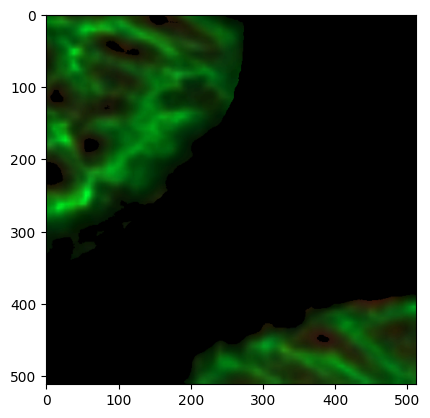


DATASET'S DAB SIGNAL MAX INTENSITY: 1.0


In [121]:
# // ---- // ROUTINE:
if   normalize_analytics_dataset : analytics_dataset = ( analytics_dataset / analytics_dataset[:,:,:,mask_channel].max() )
else                             : analytics_dataset = dtyped_image( analytics_dataset , np.float32 )

for idx in range(analytics_dataset.shape[0]):
  if display_data or idx == analytics_dataset.shape[0]-1:
    print(
        f'''
          - entry  : { idx+1 } / { analytics_dataset.shape[0] }
          - min    : { analytics_dataset[idx].min()           }
          - mean   : { analytics_dataset[idx].mean()          }
          - median : { np.median(analytics_dataset[idx])      }
          - max    : { analytics_dataset[idx].max()           }

          '''
          )
    plt.imshow(normalize_image( analytics_dataset[idx] , normalize_per_channel = False ) )
    plt.pause(0.01)

print()
print(f"DATASET'S {stain_chs_acronyms[mask_channel]} SIGNAL MAX INTENSITY: {analytics_dataset[:,:,:,mask_channel].max()}")

In [122]:
# // ---- // NUMBER OF PIXELS IN IMAGES:
num_pixels                          = ( analytics_dataset[0].shape[0] * analytics_dataset[0].shape[1] )

# // ---- // RGB IMAGES:
rgb_min_values                      = np.asarray([ img[img != 0].min()  / 1   for img in process_masked_rgb_images ])
rgb_mean_values                     = np.asarray([ img[img != 0].mean() / 1   for img in process_masked_rgb_images ])
rgb_max_values                      = np.asarray([ img[img != 0].max()  / 1   for img in process_masked_rgb_images ])

# // ---- // STAIN IMAGES:
all_stains_min_values               = np.asarray([ img[img != 0].min()        for img in analytics_dataset ])
all_stains_mean_values              = np.asarray([ img[img != 0].mean()       for img in analytics_dataset ])
all_stains_max_values               = np.asarray([ img[img != 0].max()        for img in analytics_dataset ])

# // ---- // TARGET STAIN CHANNEL (exclusively):
target_stain_channel_min_values     = np.asarray([ img[img != 0].min()        for img in analytics_dataset[:,:,:,mask_channel] ])
target_stain_channel_mean_values    = np.asarray([ img[img != 0].mean()       for img in analytics_dataset[:,:,:,mask_channel] ])
stain_target_channel_max_values     = np.asarray([ img[img != 0].max()        for img in analytics_dataset[:,:,:,mask_channel] ])

In [123]:
areas       = []
intensities = []
densities   = []

for idx in range(0 , len( analytics_dataset ) ):
  primary_stain_ch_flattened      = analytics_dataset[idx,:,:,0].flatten()
  secondary_stain_ch_flattened    = analytics_dataset[idx,:,:,1].flatten()
  tertiary_stain_ch_flattened     = analytics_dataset[idx,:,:,2].flatten()

  primary_stain_islet_flattened   = primary_stain_ch_flattened  [ primary_stain_ch_flattened   != 0 ]
  secondary_stain_islet_flattened = secondary_stain_ch_flattened[ secondary_stain_ch_flattened != 0 ]
  tertiary_stain_islet_flattened  = tertiary_stain_ch_flattened [ tertiary_stain_ch_flattened  != 0 ]

  # // ---- // AREAs:
  primary_stain_area                              = primary_stain_ch_flattened.flatten()
  primary_stain_area  [primary_stain_area != 0]   = 1
  primary_stain_area                              = primary_stain_area.sum() / len(primary_stain_area)

  secondary_stain_area                            = secondary_stain_ch_flattened.flatten()
  secondary_stain_area[secondary_stain_area != 0] = 1
  secondary_stain_area                            = secondary_stain_area.sum() / len(secondary_stain_area)

  tertiary_stain_area                             = tertiary_stain_ch_flattened.flatten()
  tertiary_stain_area [tertiary_stain_area != 0]  = 1
  tertiary_stain_area                             = tertiary_stain_area.sum() / len(tertiary_stain_area)

  # // ---- // INTENSITY:
  primary_stain_density         = primary_stain_ch_flattened.sum()   / len(primary_stain_ch_flattened)
  secondary_stain_density       = secondary_stain_ch_flattened.sum() / len(secondary_stain_ch_flattened)
  tertiary_stain_density        = tertiary_stain_ch_flattened.sum()  / len(tertiary_stain_ch_flattened)

  # // ---- // DENSITY:
  primary_stain_islet_density   = primary_stain_islet_flattened.sum()   / len(primary_stain_islet_flattened)   if len(primary_stain_islet_flattened)   != 0 else 0
  secondary_stain_islet_density = secondary_stain_islet_flattened.sum() / len(secondary_stain_islet_flattened) if len(secondary_stain_islet_flattened) != 0 else 0
  tertiary_stain_islet_density  = tertiary_stain_islet_flattened.sum()  / len(tertiary_stain_islet_flattened)  if len(tertiary_stain_islet_flattened)  != 0 else 0

  # // ---- // STORING THE AREAS & DENSITIES OF THE IMAGE(s):
  areas.append      ( ( primary_stain_area          , secondary_stain_area          , tertiary_stain_area          ) )
  intensities.append( ( primary_stain_density       , secondary_stain_density       , tertiary_stain_density       ) )
  densities.append  ( ( primary_stain_islet_density , secondary_stain_islet_density , tertiary_stain_islet_density ) )

  name = process_image_names[idx].split('.')[0].upper()

  if print_csv_data_as_text:
    print(  '|| ======================================== ||'                             )
    print(                                                                               )
    print( f'° {name} ISLET AREA / INTENSITY / DENSITY INFO:'                            )
    print( '     - STAIN AREA DATA:'                                                     )
    print( '        - PRIMARY STAIN AREA              :' , primary_stain_area            )
    print( '        - SECONDARY STAIN AREA            :' , secondary_stain_area          )
    print( '        - TERTIARY STAIN AREA             :' , tertiary_stain_area           )
    print( '     - IMAGE DENSITY DATA:'                                                  )
    print( '        - PRIMARY STAIN INTENSITY         :' , primary_stain_density         )
    print( '        - SECONDARY STAIN INTENSITY       :' , secondary_stain_density       )
    print( '        - TERTIARY STAIN INTENSITY        :' , tertiary_stain_density        )
    print( '     - ISLET DENSITY DATA:'                                                  )
    print( '        - ISLET PRIMARY STAIN INTENSITY   :' , primary_stain_islet_density   )
    print( '        - ISLET SECONDARY STAIN INTENSITY :' , secondary_stain_islet_density )
    print( '        - ISLET TERTIARY STAIN INTENSITY  :' , tertiary_stain_islet_density  )
    print(                                                                               )
    print(  '|| ======================================== ||'                             )
    print(                                                                               )
    print(                                                                               )

In [124]:
CSV_DATA = {}

if valid_names is None : manifest_valid_names = np.asarray( process_input_images_meta_data.keys() ).tolist()
else                   : manifest_valid_names = valid_names

# // ---- // MAIN DATA / INFO:
CSV_DATA[ 'LAMINATE'                                                            ] = [ process_input_images_meta_data[name][0] for name in manifest_valid_names ]
CSV_DATA[ 'SUBJECT SAMPLE ID'                                                   ] = [ process_input_images_meta_data[name][1] for name in manifest_valid_names ]
CSV_DATA[ 'IMAGE NAME'                                                          ] = [ name.split('.')[0]                      for name in manifest_valid_names ]
CSV_DATA[ 'IMAGE PIXELS'                                                        ] = [ num_pixels ] * len(analytics_dataset)
CSV_DATA[ f'{stain_ch_acronym} PIXELS'                                          ] = [ None ] * len(analytics_dataset)

# // ---- // DAB AREAS:
CSV_DATA[ f'{stain_ch_acronym} AREA (%)'                                        ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'{stain_ch_acronym} AREA (pix)'                                      ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'{stain_ch_acronym} AREA (µm²)'                                      ] = [ None ] * len(analytics_dataset)

# // ----- // DAB DENSITIES:
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (%)'                          ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (pix)'                        ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                        ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'              ] = [ None ] * len(analytics_dataset)

# // ---- // CSV MAX DAB DENSITIES IN MICRONS:
CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                    ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'          ] = [ None ] * len(analytics_dataset)

# // ---- // CSV PERCENTAGES OF MAX DAB DENSITIES:
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (% of MAX per µm²)'           ] = [ None ] * len(analytics_dataset)
CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY - CONTROL (% of MAX per µm²)' ] = [ None ] * len(analytics_dataset)


# // ---- // EXTRACTING THE AREAS AND DENSITIES OF THE DAB CHANNELS:
STAIN_AREAS     = np.asarray(   areas   )[:,mask_channel]
STAIN_DENSITIES = np.asarray( densities )[:,mask_channel]


# // ---- // DETERMINING THE BACKGROUND-NOISE TO SUBTRACT:
c_density   = 0
c_densities = []
for idx, name in enumerate(manifest_valid_names):
 subject_ID = process_input_images_meta_data[name][1]
 if subject_ID == 0: # <|==|| THEN, IT'S A CONTROL SAMPLE.
   analytics_entry     = analytics_dataset[idx,:,:,mask_channel].flatten()
   num_non_zero_pixels = len(analytics_entry [ analytics_entry != 0 ] )
   c_densities.append  ( threshold_determinator_functor(STAIN_DENSITIES[idx]) * num_non_zero_pixels * micron_squared_normalization_factor )
c_density = threshold_mixer_functor( np.asarray(c_densities) )


# // ---- // INCLUDING THE NECESSARY DATA IN THE CSV:
for idx in range( 0 , len( analytics_dataset ) ):
  analytics_entry                                                                        = analytics_dataset[idx,:,:,mask_channel].flatten()
  num_non_zero_pixels                                                                    = len(analytics_entry [ analytics_entry != 0 ] )

  CSV_DATA[ f'{stain_ch_acronym} PIXELS'                                          ][idx] = num_non_zero_pixels
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (%)'                          ][idx] = np.round( STAIN_DENSITIES[idx] * 100                                                                                                                                                      , num_decimal_digits )
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (pix)'                        ][idx] = np.round( STAIN_DENSITIES[idx] * num_non_zero_pixels                                                                                                                                      , num_decimal_digits )
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                        ][idx] = np.round( STAIN_DENSITIES[idx] * num_non_zero_pixels * micron_squared_normalization_factor                                                                                                , num_decimal_digits )
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'              ][idx] = np.round( STAIN_DENSITIES[idx] * num_non_zero_pixels * micron_squared_normalization_factor - c_density                                                                                    , num_decimal_digits )
  CSV_DATA[ f'{stain_ch_acronym} AREA (%)'                                        ][idx] = np.round( STAIN_AREAS[idx] * 100                                                                                                                                                          , num_decimal_digits )
  CSV_DATA[ f'{stain_ch_acronym} AREA (pix)'                                      ][idx] = np.round( STAIN_AREAS[idx] * num_pixels                                                                                                                                                   , num_decimal_digits )
  CSV_DATA[ f'{stain_ch_acronym} AREA (µm²)'                                      ][idx] = np.round( STAIN_AREAS[idx] * num_pixels * micron_squared_normalization_factor                                                                                                             , num_decimal_digits )
  CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                    ][idx] = np.round( num_pixels * micron_squared_normalization_factor                                                                                                                                , num_decimal_digits )
  CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'          ][idx] = np.round( num_pixels * micron_squared_normalization_factor - c_density                                                                                                                    , num_decimal_digits )
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (% of MAX per µm²)'           ][idx] = np.round( 100 * ( ( CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²)' ][idx]             ) / ( CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)' ][idx]             ) ) , num_decimal_digits )
  CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY - CONTROL (% of MAX per µm²)' ][idx] = np.round( 100 * ( ( CSV_DATA[ f'INTEGRATED {stain_ch_acronym} DENSITY (µm²)' ][idx] - c_density ) / ( CSV_DATA[ f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)' ][idx] - c_density ) ) , num_decimal_digits )


# // ---- // MMM ( M[in] M[ean] M[ax] ) STATISTICS:
if CSV_DATA__INCLUDE_MMM_STATISTICS:
  CSV_DATA[ f'{stain_ch_acronym} MIN [0:1]'  ] = np.round( target_stain_channel_min_values     , num_decimal_digits )
  CSV_DATA[ f'{stain_ch_acronym} MEAN [0:1]' ] = np.round( target_stain_channel_mean_values    , num_decimal_digits )
  CSV_DATA[ f'{stain_ch_acronym} MAX [0:1]'  ] = np.round( stain_target_channel_max_values     , num_decimal_digits )

  CSV_DATA[ f'{stain_acronym} MIN [0:1]'     ] = np.round( all_stains_min_values               , num_decimal_digits )
  CSV_DATA[ f'{stain_acronym} MEAN [0:1]'    ] = np.round( all_stains_mean_values              , num_decimal_digits )
  CSV_DATA[ f'{stain_acronym} MAX [0:1]'     ] = np.round( all_stains_max_values               , num_decimal_digits )

  CSV_DATA[ 'RGB MIN [0:1]'                  ] = np.round( rgb_min_values                      , num_decimal_digits )
  CSV_DATA[ 'RGB MEAN [0:1]'                 ] = np.round( rgb_mean_values                     , num_decimal_digits )
  CSV_DATA[ 'RGB MAX [0:1]'                  ] = np.round( rgb_max_values                      , num_decimal_digits )


# // ---- // FORMATTING THE OUTPUT CSV DATA TO PERCENTAGES (if requested):
if CSV_DATA__EXPORT_AS_PERCENTAGES:

  CSV_DATA_AS_PERCENTAGES = CSV_DATA.copy()

  CSV_DATA_AS_PERCENTAGES[ f'{stain_ch_acronym} MIN %'  ] = np.round( target_stain_channel_min_values  * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ f'{stain_ch_acronym} MEAN %' ] = np.round( target_stain_channel_mean_values * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ f'{stain_ch_acronym} MAX %'  ] = np.round( stain_target_channel_max_values  * 100 , num_decimal_digits )

  CSV_DATA_AS_PERCENTAGES[ f'{stain_acronym} MIN %'     ] = np.round( all_stains_min_values            * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ f'{stain_acronym} MEAN %'    ] = np.round( all_stains_mean_values           * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ f'{stain_acronym} MAX %'     ] = np.round( all_stains_max_values            * 100 , num_decimal_digits )

  CSV_DATA_AS_PERCENTAGES[ 'RGB MIN %'                  ] = np.round( rgb_min_values                   * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ 'RGB MEAN %'                 ] = np.round( rgb_mean_values                  * 100 , num_decimal_digits )
  CSV_DATA_AS_PERCENTAGES[ 'RGB MAX %'                  ] = np.round( rgb_max_values                   * 100 , num_decimal_digits )

  DF = pd.DataFrame( CSV_DATA_AS_PERCENTAGES )

else:

  DF = pd.DataFrame( CSV_DATA )

# // ---- // EXTRACT A BACK-UP DF WITH ALL THE DATA BEFORE WE DROP UNREQUESTED ENTRIES (columns):
FULL_DF = DF.copy()

# // ---- // DETERMINE WHICH COLUMNS TO DROP (the non-requested columns):
columns_to_drop = []
if not CSV_DATA__INCLUDE_TARGET_STAIN_PIXELS                                        : columns_to_drop.append( f'{stain_ch_acronym} PIXELS'                                          )
if not CSV_DATA__INCLUDE_STAIN_DENSITY_AS_PERCENTAGE                                : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY (%)'                          )
if not CSV_DATA__INCLUDE_STAIN_DENSITY_IN_PIXELS                                    : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY (pix)'                        )
if not CSV_DATA__INCLUDE_STAIN_DENSITY_IN_MICRONS                                   : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                        )
if not CSV_DATA__INCLUDE_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL                   : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'              )
if not CSV_DATA__INCLUDE_STAIN_AREA_AS_PERCENTAGE                                   : columns_to_drop.append( f'{stain_ch_acronym} AREA (%)'                                        )
if not CSV_DATA__INCLUDE_STAIN_AREA_IN_PIXELS                                       : columns_to_drop.append( f'{stain_ch_acronym} AREA (pix)'                                      )
if not CSV_DATA__INCLUDE_STAIN_AREA_IN_MICRONS                                      : columns_to_drop.append( f'{stain_ch_acronym} AREA (µm²)'                                      )
if not CSV_DATA__INCLUDE_MAX_STAIN_DENSITY_IN_MICRONS                               : columns_to_drop.append( f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)'                    )
if not CSV_DATA__INCLUDE_MAX_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL               : columns_to_drop.append( f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL'          )
if not CSV_DATA__INCLUDE_PERCENTAGE_OF_MAX_STAIN_DENSITY_IN_MICRONS                 : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY (% of MAX per µm²)'           )
if not CSV_DATA__INCLUDE_PERCENTAGE_OF_MAX_STAIN_DENSITY_IN_MICRONS_WITHOUT_CONTROL : columns_to_drop.append( f'INTEGRATED {stain_ch_acronym} DENSITY - CONTROL (% of MAX per µm²)' )
# // ---- // ACTUALLY DROP THE COLUMNS FROM THE DATAFRAME:
DF = DF.drop( columns = columns_to_drop )
# // ---- // SORT THE DF BASED ON THE SUBJECT-ID:
DF = DF.sort_values( by = 'SUBJECT SAMPLE ID' , ascending = True )
# // ---- // DISPLAYING THE GENERATED OUTPUT DATA FRAME:
DF

,LAMINATE,SUBJECT SAMPLE ID,IMAGE NAME,IMAGE PIXELS,DAB PIXELS,DAB AREA (%),DAB AREA (pix),DAB AREA (µm²),INTEGRATED DAB DENSITY (%),INTEGRATED DAB DENSITY (pix),INTEGRATED DAB DENSITY (µm²),INTEGRATED DAB DENSITY (µm²) - CONTROL,INTEGRATED DAB DENSITY - CONTROL (% of MAX per µm²)
0,AUGMENTED_LAMINATE_1,0,AUGMENTED_IMG_1,262144,96669,36.88,96669.0,18815.33,29.05,28085.90,5466.55,-284.41,-0.63
1,AUGMENTED_LAMINATE_1,0,AUGMENTED_IMG_2,262144,95879,36.57,95879.0,18661.57,25.30,24258.40,4721.57,-1029.38,-2.27
2,AUGMENTED_LAMINATE_1,0,AUGMENTED_IMG_3,262144,97186,37.07,97186.0,18915.96,37.34,36285.37,7062.46,1311.51,2.90
3,AUGMENTED_LAMINATE_1,0,AUGMENTED_IMG_4,262144,97739,37.28,97739.0,19023.59,32.97,32220.81,6271.35,520.40,1.15
4,AUGMENTED_LAMINATE_1,0,AUGMENTED_IMG_5,262144,95432,36.40,95432.0,18574.57,28.17,26885.22,5232.85,-518.11,-1.14
5,AUGMENTED_LAMINATE_2,1,AUGMENTED_IMG_6,262144,95838,36.56,95838.0,18653.59,31.40,30091.62,5856.93,105.98,0.23
6,AUGMENTED_LAMINATE_2,1,AUGMENTED_IMG_7,262144,95713,36.51,95713.0,18629.26,24.63,23577.63,4589.07,-1161.89,-2.57
7,AUGMENTED_LAMINATE_2,1,AUGMENTED_IMG_8,262144,92181,35.16,92181.0,17941.80,30.00,27657.02,5383.07,-367.89,-0.81
8,AUGMENTED_LAMINATE_2,1,AUGMENTED_IMG_9,262144,96308,36.74,96308.0,18745.07,35.90,34571.37,6728.86,977.90,2.16
9,AUGMENTED_LAMINATE_2,1,AUGMENTED_IMG_10,262144,95417,36.40,95417.0,18571.65,25.12,23968.15,4665.08,-1085.88,-2.40


## // ------------------------------------------------------------ //

# // ======================================================== //

# **@ [ ` FIGs ` ] :**

## // ------------------------------------------------------------ //

## **@ [ ` FIGs ` ] - STAIN-COLORING SCHEME :**

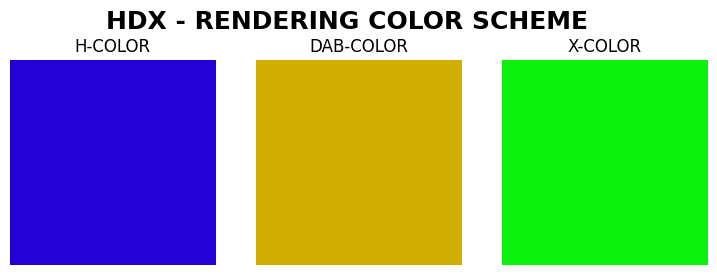

In [125]:
# // ---------------------------------------------------- //
# WIP:  STAIN-COLORS INFO-FIG:
# // ---------------------------------------------------- //

figs_stain_coloring_scheme = []

f_s           = 3

color_img_00 = np.ones( (32,32,3) ) * stain_color_00
color_img_01 = np.ones( (32,32,3) ) * stain_color_01
color_img_02 = np.ones( (32,32,3) ) * stain_color_02

fig, ax = plt.subplots( figsize = ( f_s*3 , f_s ), ncols = 3, nrows = 1)

fig.suptitle(
    f'{stain_acronym} - RENDERING COLOR SCHEME' ,
    fontweight = 'bold'                         ,
    fontsize   = f_s * 6                        ,
    y          = 1.005                          ,
            )

ax[0].set_title( f'{stain_chs_acronyms[0]}-COLOR' )
ax[0].imshow   ( color_img_00                     )
ax[0].axis     ( 'off'                            )

ax[1].set_title( f'{stain_chs_acronyms[1]}-COLOR' )
ax[1].imshow   ( color_img_01                     )
ax[1].axis     ( 'off'                            )

ax[2].set_title( f'{stain_chs_acronyms[2]}-COLOR' )
ax[2].imshow   ( color_img_02                     )
ax[2].axis     ( 'off'                            )

figs_stain_coloring_scheme.append( fig )
# // ---------------------------------------------------- //

## // ------------------------------------------------------------ //

## **@ [ ` FIGs ` ] - HISTOGRAM-BREAKDOWNs :**

### // ----------------------------------------------- //

### **@ [ ` FIG ` ] - FULL-SET RGB HISTOGRAM ANALYSIS :**

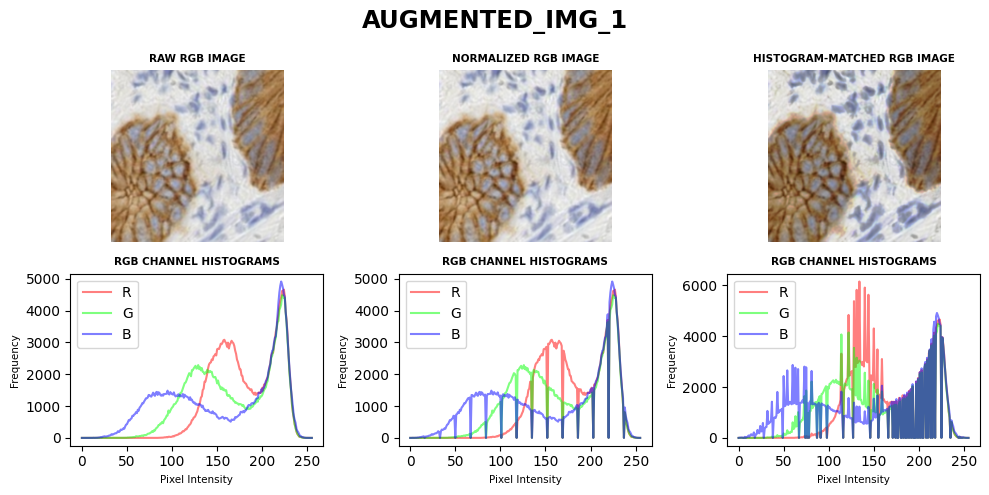

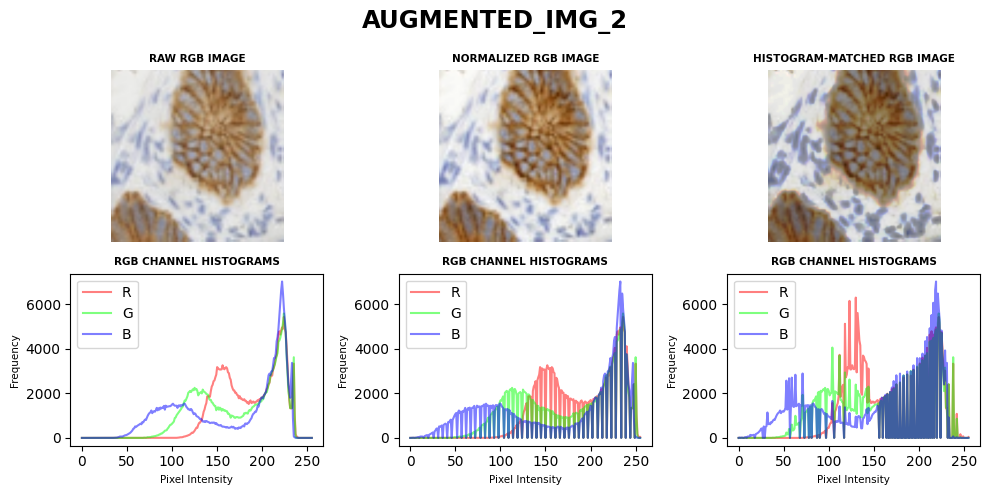

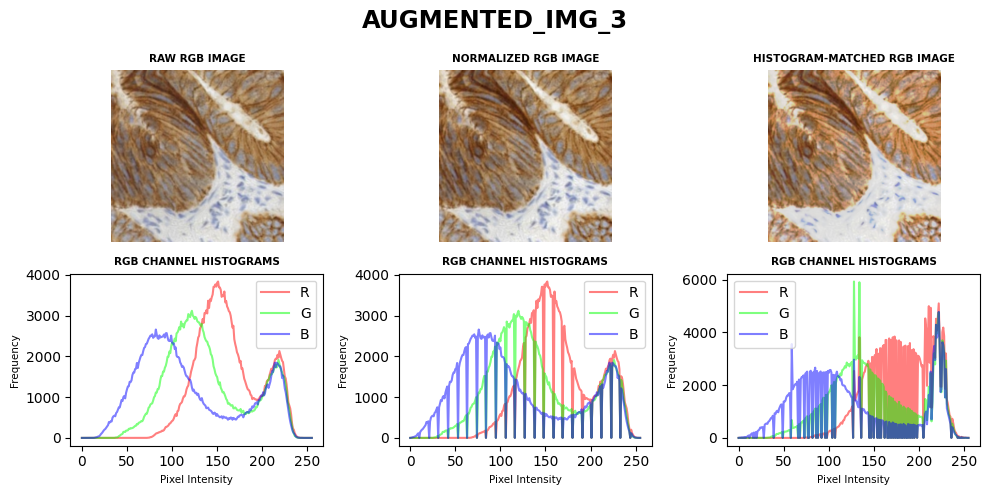

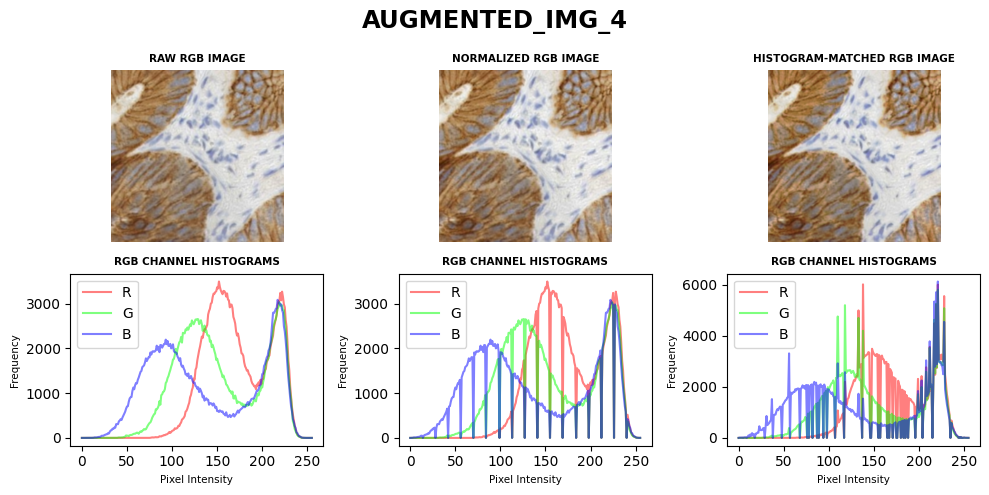

In [127]:
# // ------------------------------------------------------------ //
# // ----------- || STAIN-IMAGES HISTOGRAM ANALYSIS || ---------- //
# // ------------------------------------------------------------ //
# // ---- // PARAMs:
fig_imgs   = process_input_images[:PREVIEW_RANGE] if PREVIEW_RANGE is not None else process_input_images
fig_bins   = [ h_bins_0_256  , h_bins_0_256  , h_bins_0_256  ]
fig_ranges = [ h_range_0_256 , h_range_0_256 , h_range_0_256 ]

figs_basic_rgb_histogram_analysis = []

# // ---- // FIGURE GENERATION ROUTINE:
for entry_index in range( len( fig_imgs) ):

  fig     = FIGURE_FULL_SET_PROCESS_HISTOGRAM_COMPARISON(
    ** {
        'entry_index'                            : entry_index                            ,
        'fig_raw_images'                         : fig_imgs                               ,
        'fig_histogram_matching_reference_image' : histogram_matching_rgb_reference_image ,
        'fig_colors'                             : rgb_colors                             ,
        'fig_acronym'                            : rgb_acronym                            ,
        'fig_chs_acronyms'                       : rgb_chs_acronyms                       ,
        'fig_bins'                               : fig_bins                               ,
        'fig_ranges'                             : fig_ranges                             ,
        'alpha_overlay_multiplier'               : 1                                      ,
        'f_s'                                    : 5                                      ,
        'return_figure'                          : True                                   ,
       }
                                                        )

  display( fig )

  print()

  figs_basic_rgb_histogram_analysis.append( fig )
  # // ------------------------------------------------------------ //

### // ----------------------------------------------- //

### **@ [ ` FIG ` ] - FULL-SET STAIN HISTOGRAM ANALYSIS :**

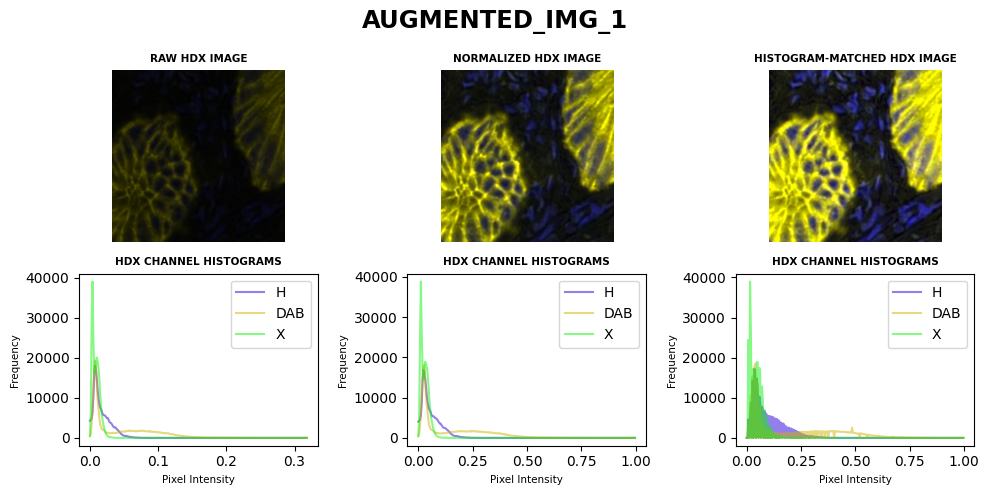

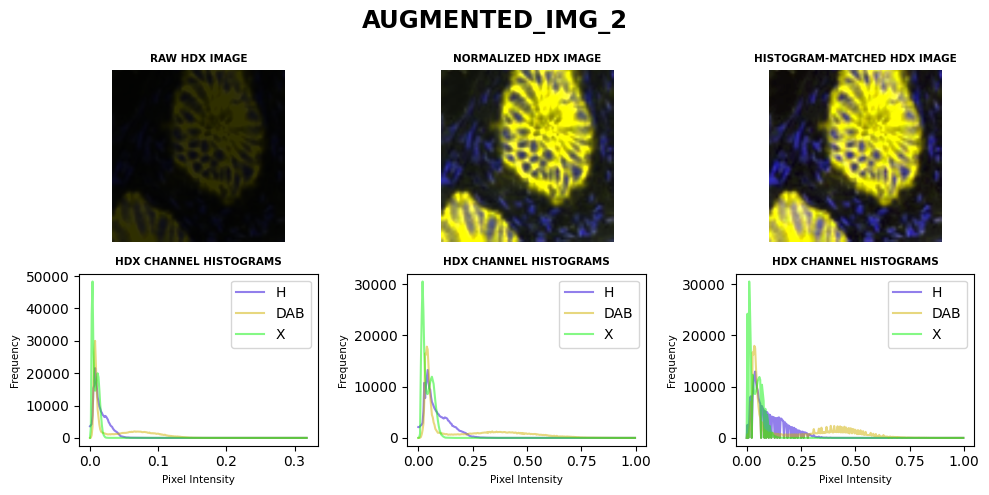

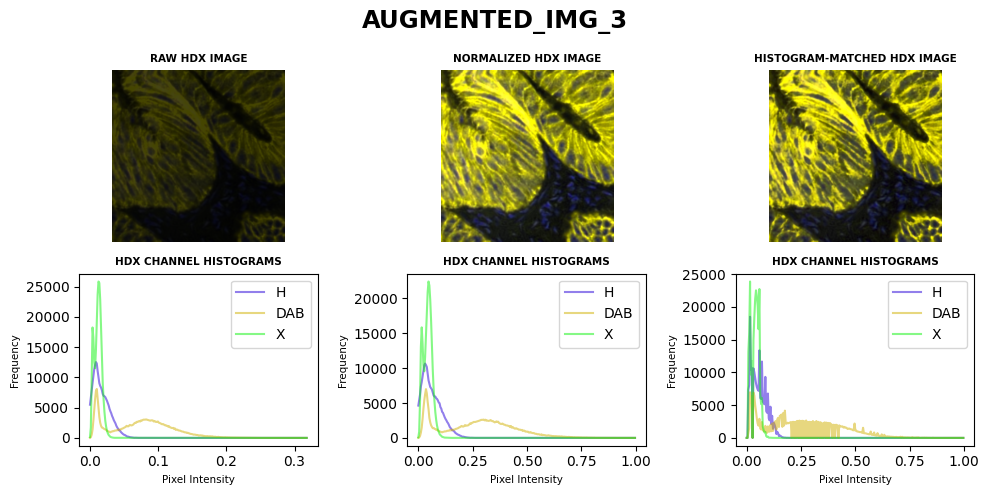

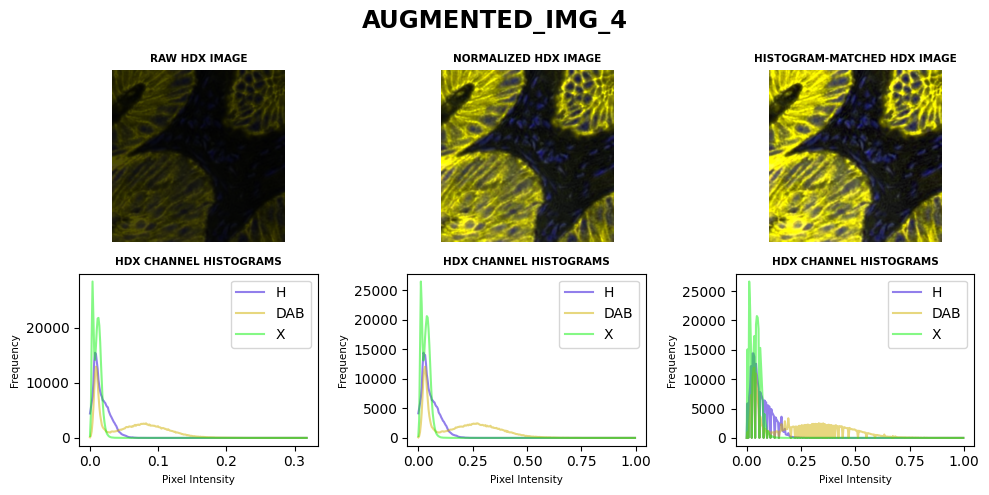

In [128]:
# // ------------------------------------------------------------ //
# // ----------- || STAIN-IMAGES HISTOGRAM ANALYSIS || ---------- //
# // ------------------------------------------------------------ //
# // ---- // PARAMs:
fig_raw_images = np.asarray(
    [
      sk.color.separate_stains( img , conv_matrix = stain_matrix )
      for img in process_input_images
    ]
                           )
fig_imgs       = fig_raw_images[:PREVIEW_RANGE] if PREVIEW_RANGE is not None else fig_raw_images
fig_bins       = [ h_bins_0_256                 , h_bins_0_256 , h_bins_0_256 ]
fig_ranges     = [ [ 0 , fig_raw_images.max() ] , h_range_0_1  , h_range_0_1  ]

figs_basic_stain_histogram_analysis = []


# // ---- // FIGURE GENERATION ROUTINE:
for entry_index in range( len( fig_imgs) ):

  fig     = FIGURE_FULL_SET_PROCESS_HISTOGRAM_COMPARISON(
    ** {
        'entry_index'                            : entry_index                              ,
        'fig_raw_images'                         : fig_imgs                                 ,
        'fig_histogram_matching_reference_image' : histogram_matching_stain_reference_image ,
        'fig_colors'                             : stain_colors                             ,
        'fig_acronym'                            : stain_acronym                            ,
        'fig_chs_acronyms'                       : stain_chs_acronyms                       ,
        'fig_bins'                               : fig_bins                                 ,
        'fig_ranges'                             : fig_ranges                               ,
        'fig_colorize_images'                    : True                                     ,
        'fig_colorize_image_params'              : stain_colorize_image_params              ,
        'alpha_overlay_multiplier'               : 1                                        ,
        'f_s'                                    : 5                                        ,
        'return_figure'                          : True                                     ,
       }
                                                        )

  display( fig )

  print()

  figs_basic_stain_histogram_analysis.append( fig )

  # // ------------------------------------------------------------ //

### // ----------------------------------------------- //

## // ------------------------------------------------------------ //

## **@ [ ` FIGs ` ] - STAIN SEGMENTATION PROCESS :**

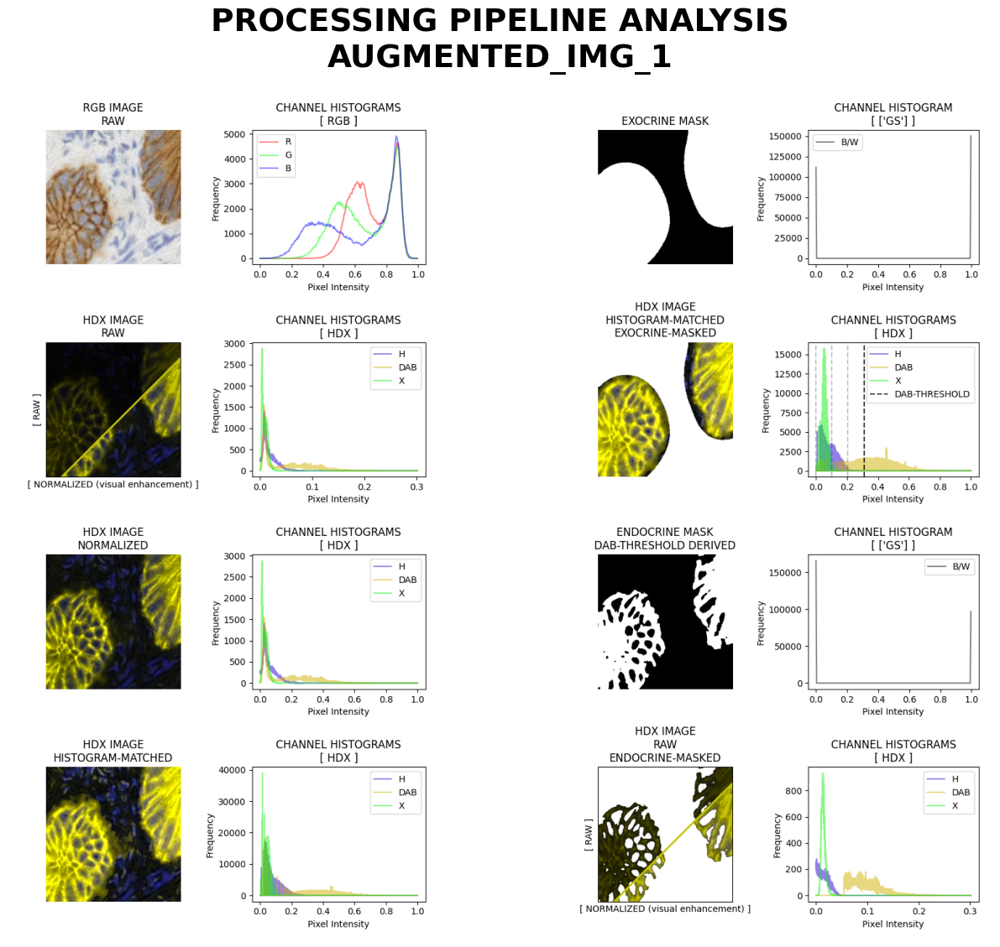

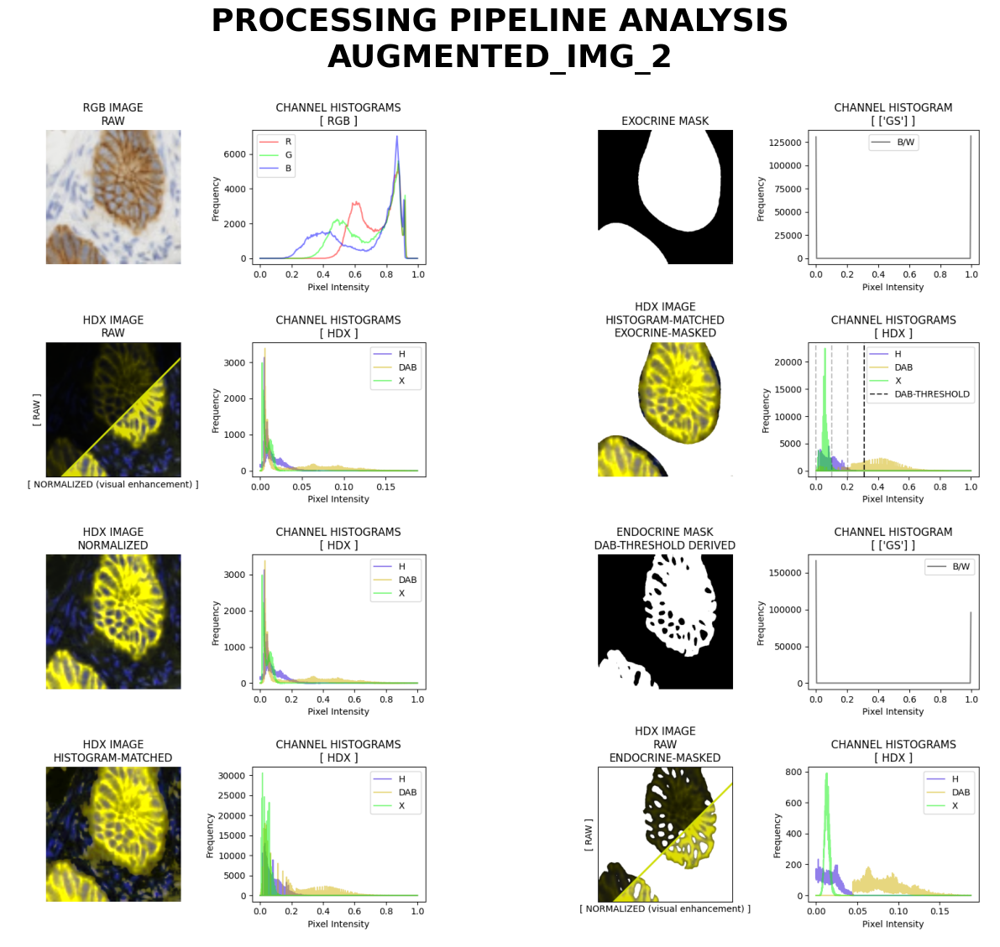

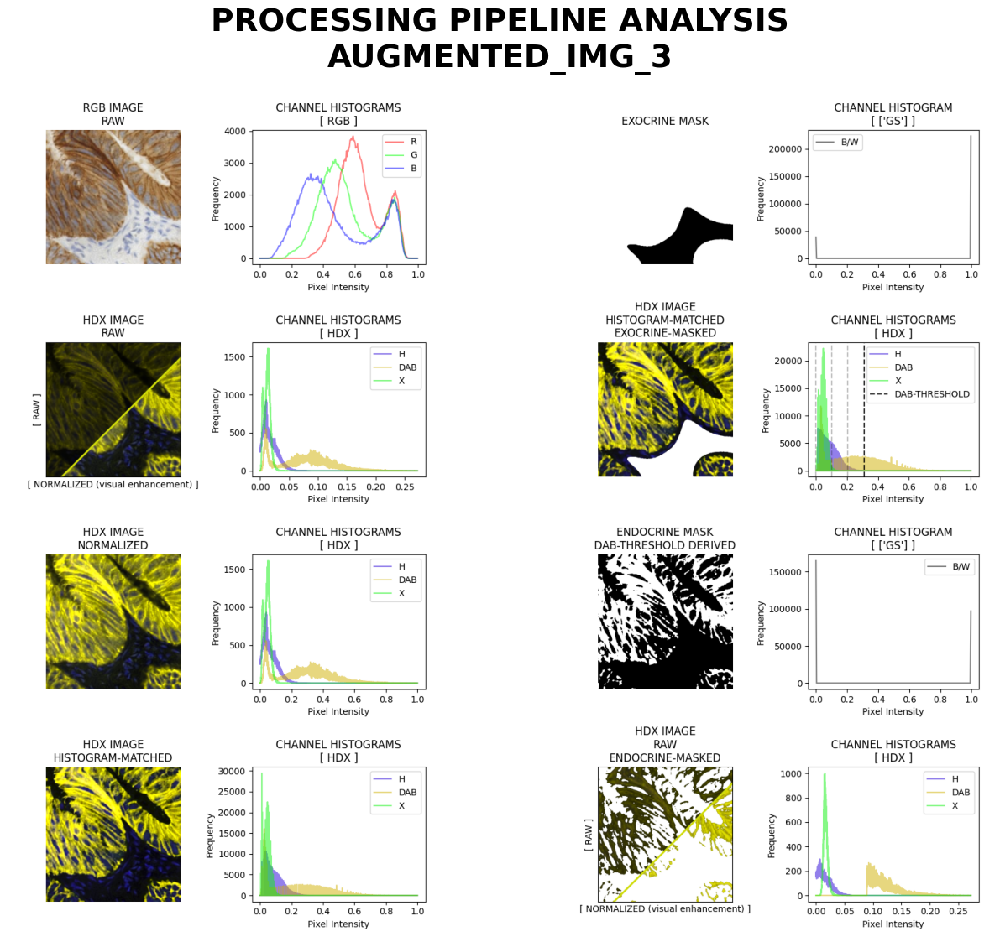

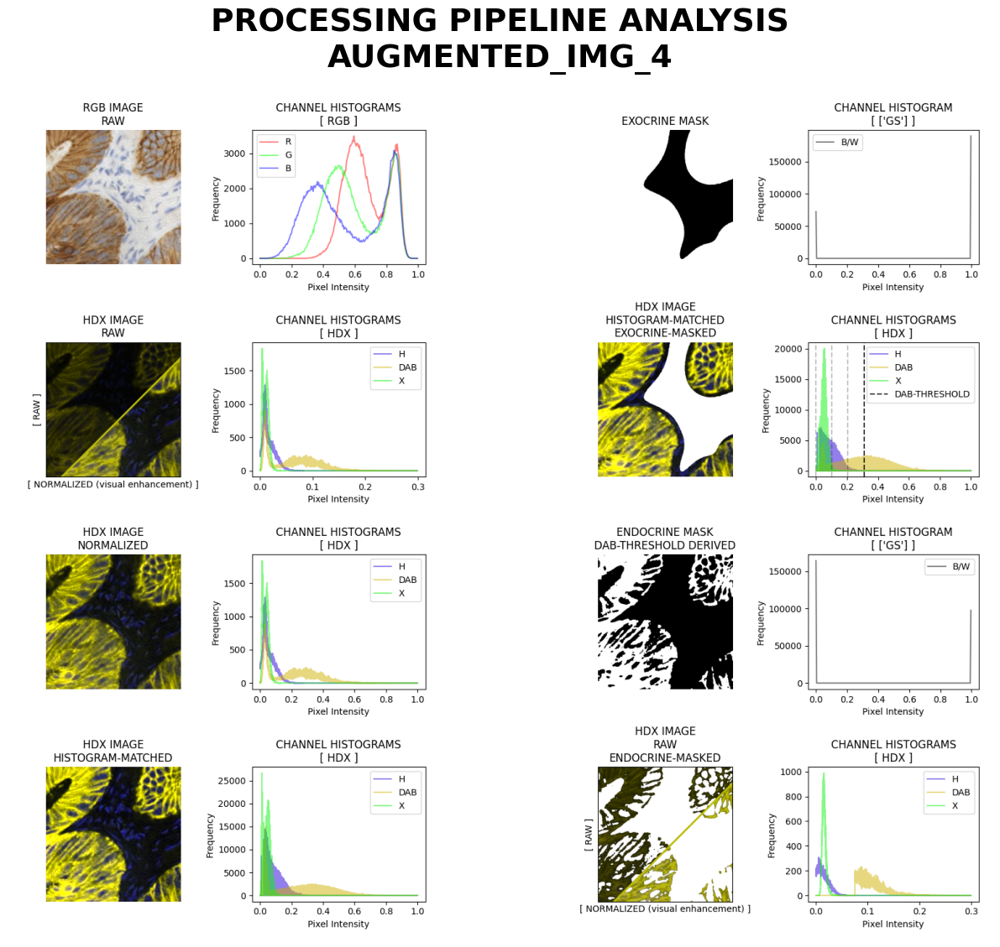

In [129]:
# // ---- // PARAMs:
f_s                       = 4.5
fig_colorize_image_params = stain_colorize_image_params
remove_empty_frames       = True
return_figures            = True
x_offset                  = -64


# // ---- // FIGURE GENERATION ROUTINE:
if return_figures: figs_segmentation_process_overview = []

fig_imgs = process_input_images[:PREVIEW_RANGE] if PREVIEW_RANGE is not None else process_input_images

for idx in range( len(fig_imgs) ):
  fig_segmentation_method_comparison = FIGURE_META_SEGMENTATION_PROCESS_OVERVIEW(
    ** {
        'image_index'               : idx                       ,
        'fig_colorize_image_params' : fig_colorize_image_params ,
        'x_offset'                  : x_offset                  ,
        'remove_empty_frames'       : remove_empty_frames       ,
        'f_s'                       : f_s                       ,
        'return_figure'             : return_figures            ,
       }
                                                                                )

  if return_figures:

    figs_segmentation_process_overview.append( fig_segmentation_method_comparison )
    print()
    display( figs_segmentation_process_overview[-1] )

## // ------------------------------------------------------------ //

## **@ [ ` FIGs ` ] - ANALYSIS & RESULTS :**

### // ----------------------------------------------- //

### **@ [ ` FIG ` ] - [ ` CONFIGs ` ] - STATISTICS :**

In [130]:

# // ---- // FIGURE PARAMs:
horizontal_offset_factor = 0.0 #3 # Set to 0 for no displacement

grid_alpha               = 0.5
subject_values_alpha     = 0.65
mean_values_alpha        = 0.95
mean_floor_values_alpha  = mean_values_alpha * 0.85

plot_mean_floor          = False
use_colored_markers      = False #True
#graphic_cmap             = 'gist_rainbow' #'Grays' #'tab10' #'gnuplot'
graphic_cmap             = 'Grays'
gradient_stretch_factor  = 1.45 # [ 1 ] == FULL GRADIENT RANGE. || [ > 1 ] == PARTIAL GRADIENT RANGE. || [ < 1 ] == NO!

mean_marker_type         = '_' #'d' #'D'
mean_marker_size         = 950 #800 #150

mean_floor_marker_type   = '_'
mean_floor_marker_size   = mean_marker_size * 0.35

subject_marker_size      = 85#60
subject_marker_types     = np.asarray(
  [
    ( 'd' , subject_marker_size * 1.00 ) ,
    ( 'D' , subject_marker_size * 0.65 ) ,
    ( 'v' , subject_marker_size * 1.00 ) ,
    ( '^' , subject_marker_size * 1.00 ) ,
    ( '8' , subject_marker_size * 1.00 ) ,
    ( 's' , subject_marker_size * 0.75 ) ,
    ( 'p' , subject_marker_size * 1.25 ) ,
    ( 'P' , subject_marker_size * 1.00 ) ,
    ( '*' , subject_marker_size * 1.25 ) ,
    ( 'h' , subject_marker_size * 1.00 ) ,
    ( 'H' , subject_marker_size * 1.00 ) ,
    ( '+' , subject_marker_size * 1.00 ) ,
    ( 'x' , subject_marker_size * 1.00 ) ,
    ( 'X' , subject_marker_size * 1.00 ) ,
  ]                                          ,
  dtype = object                             ,
                                     )
#subject_marker_type      = '.'
#subject_marker_size      = 250

In [131]:
# // ---- // DEFINE THE REMOVABLE COLUMN-CATEGORIES:
cat_selector_removables = [
    'LAMINATE'                                                   ,
    'SUBJECT SAMPLE ID'                                          ,
    'IMAGE NAME'                                                 ,
    'IMAGE PIXELS'                                               ,
    f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²)'           ,
    f'MAX INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL' ,
                          ]

# // ---- // EXTRACT COLUMN NAMES FOR THE SELECTOR OPTIONS:
cat_selector_options = DF.columns.tolist()

# // ----- // REMOVE INVALID COLUMNs FROM OPTIONs:
for cat in cat_selector_removables:
  if cat in cat_selector_options:
    cat_selector_options.remove(cat)

# // ---- // CREATING THE SELECTOR WIDGET:
cat_selector = ipywidgets.Dropdown(
    options = cat_selector_options                                     ,
    value   = f'INTEGRATED {stain_ch_acronym} DENSITY (µm²) - CONTROL' ,
                                  )

### // ----------------------------------------------- //

### **@ [ ` FIGs ` ] - [ ` WIDGET ` ] - STATISTICS :**

In [132]:
# // ---- // DISPLAY CAT-SELECTOR WIDGET:
display(cat_selector)

Dropdown(index=7, options=('DAB PIXELS', 'DAB AREA (%)', 'DAB AREA (pix)', 'DAB AREA (µm²)', 'INTEGRATED DAB D…

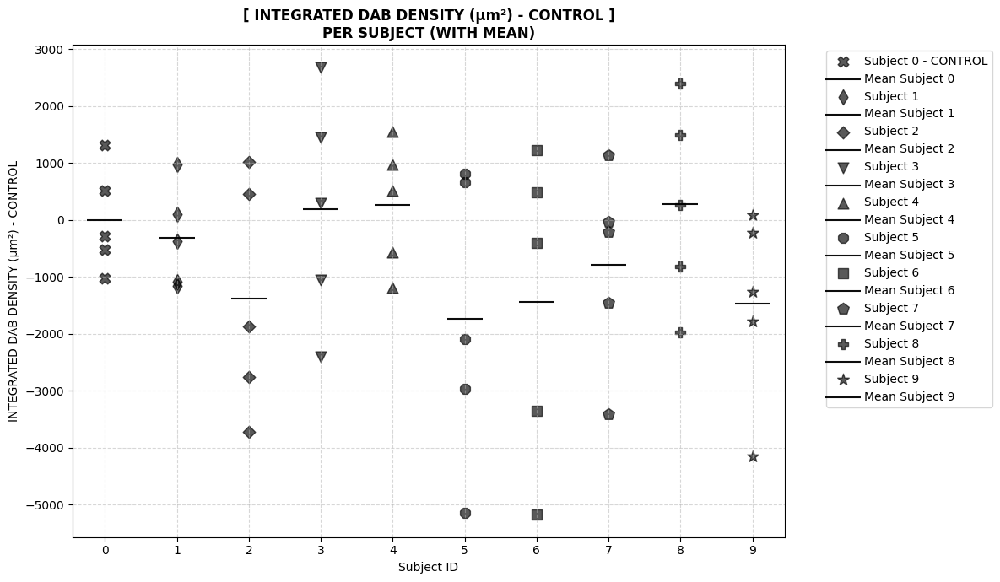

In [133]:
# // ---- // EXTRACTING THE CATEGORY  TO PLOT
# // ---- // FROM THE SELECTOR-WIDGET'S VALUE
# // ---- // AND GENERATING A FIGURE FROM IT:
FIGURE_FROM_PANDAS_COLUMN( cat_selector.value )

In [134]:
figs_statistics = []
for cat in cat_selector_options:
  print( f'COMPUTING FIG...: {cat}' )
  statistics_fig = FIGURE_FROM_PANDAS_COLUMN( cat , return_figure = True )
  figs_statistics.append( statistics_fig )

COMPUTING FIG...: DAB PIXELS
COMPUTING FIG...: DAB AREA (%)
COMPUTING FIG...: DAB AREA (pix)
COMPUTING FIG...: DAB AREA (µm²)
COMPUTING FIG...: INTEGRATED DAB DENSITY (%)
COMPUTING FIG...: INTEGRATED DAB DENSITY (pix)
COMPUTING FIG...: INTEGRATED DAB DENSITY (µm²)
COMPUTING FIG...: INTEGRATED DAB DENSITY (µm²) - CONTROL
COMPUTING FIG...: INTEGRATED DAB DENSITY - CONTROL (% of MAX per µm²)


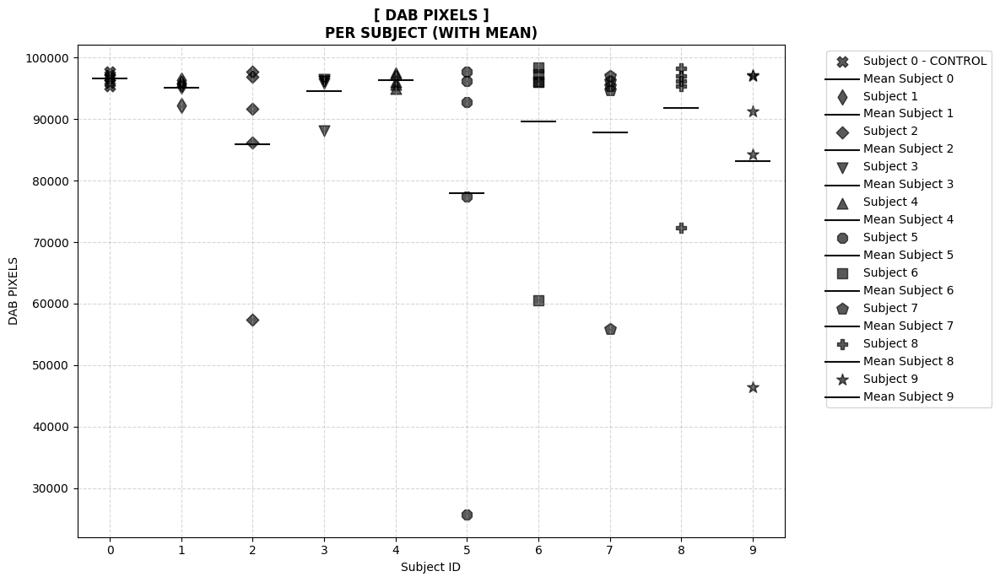

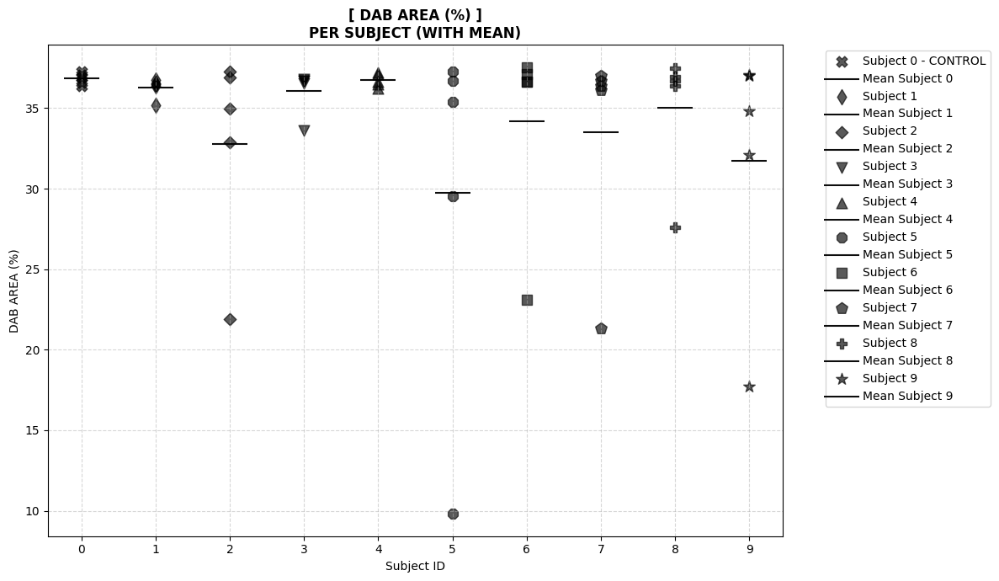

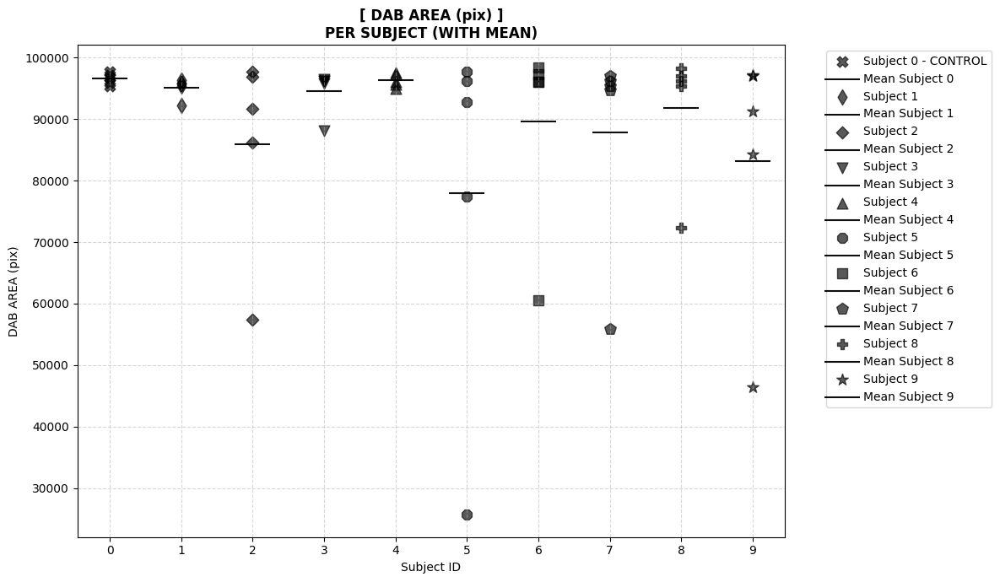

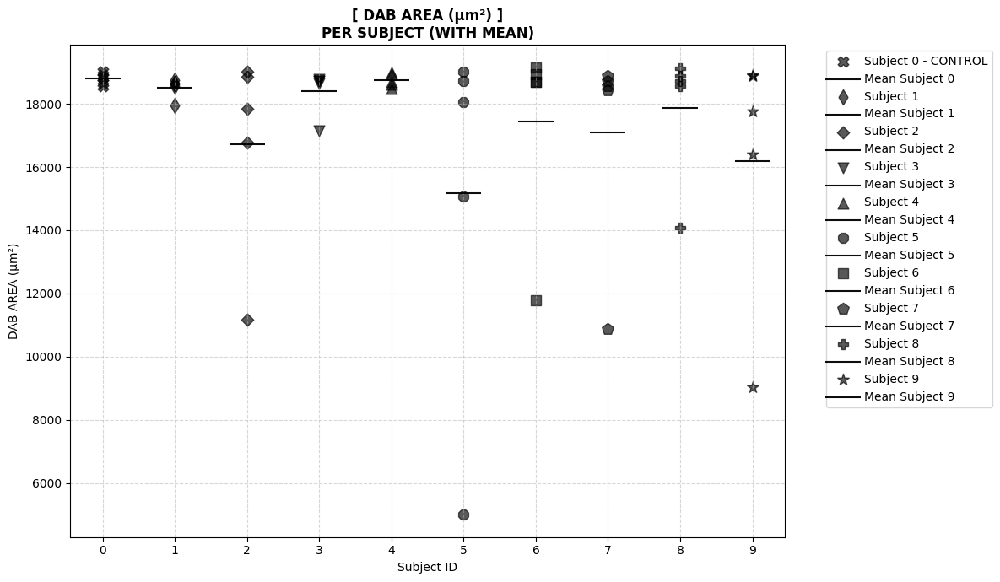

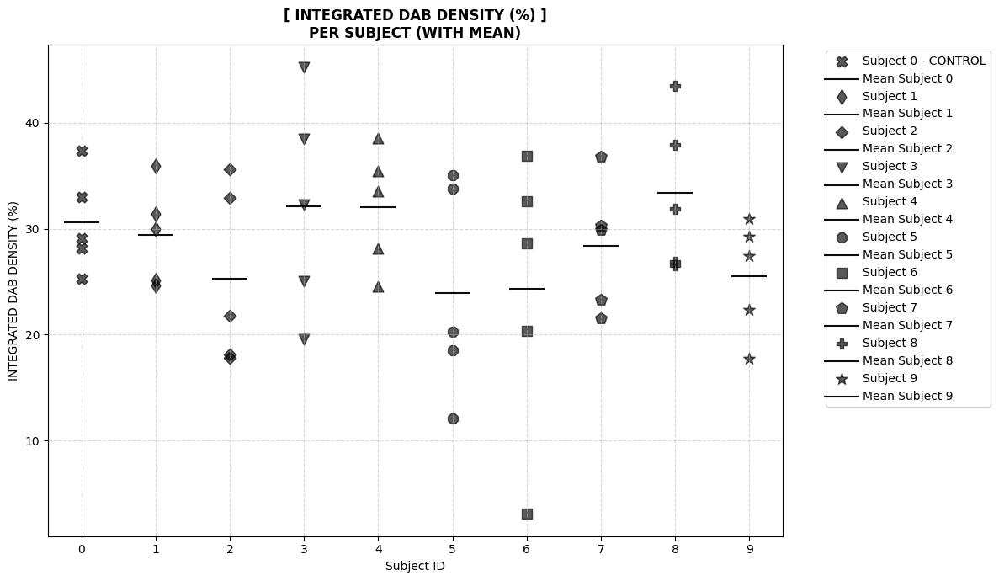

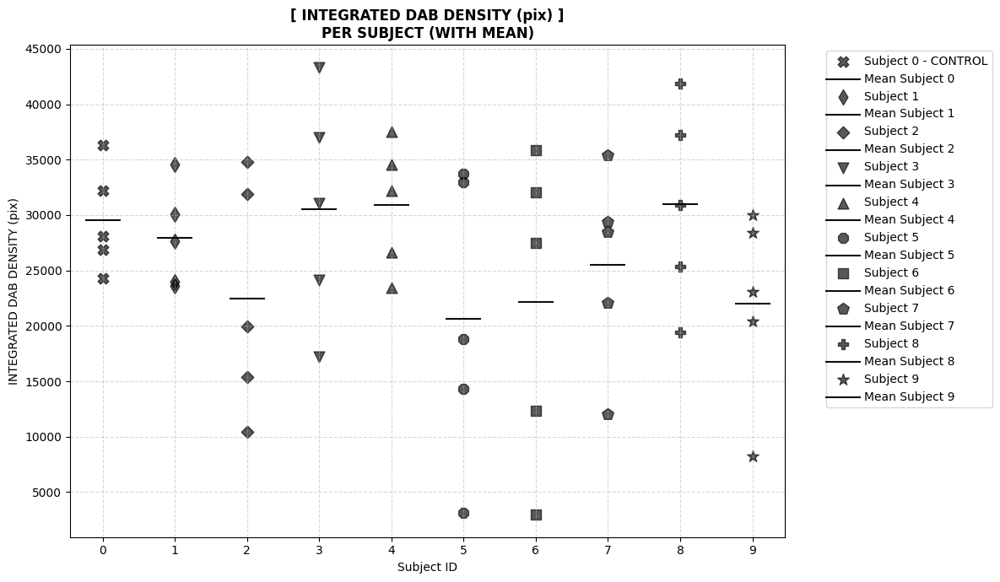

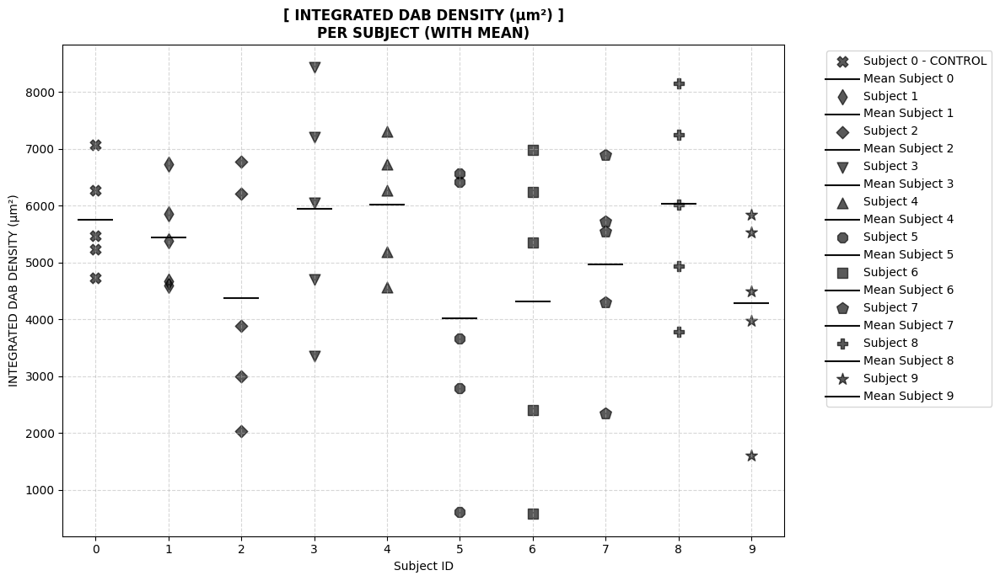

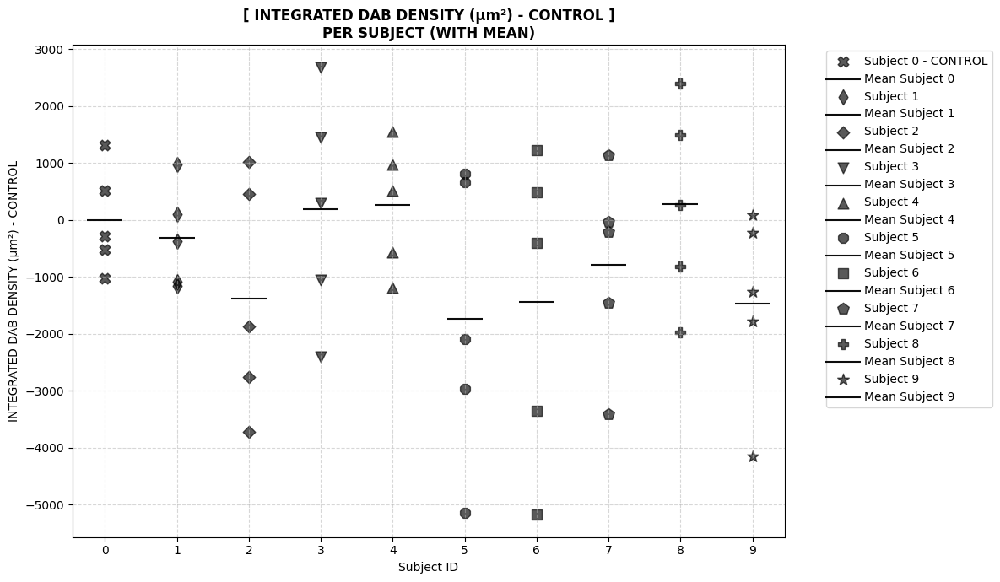

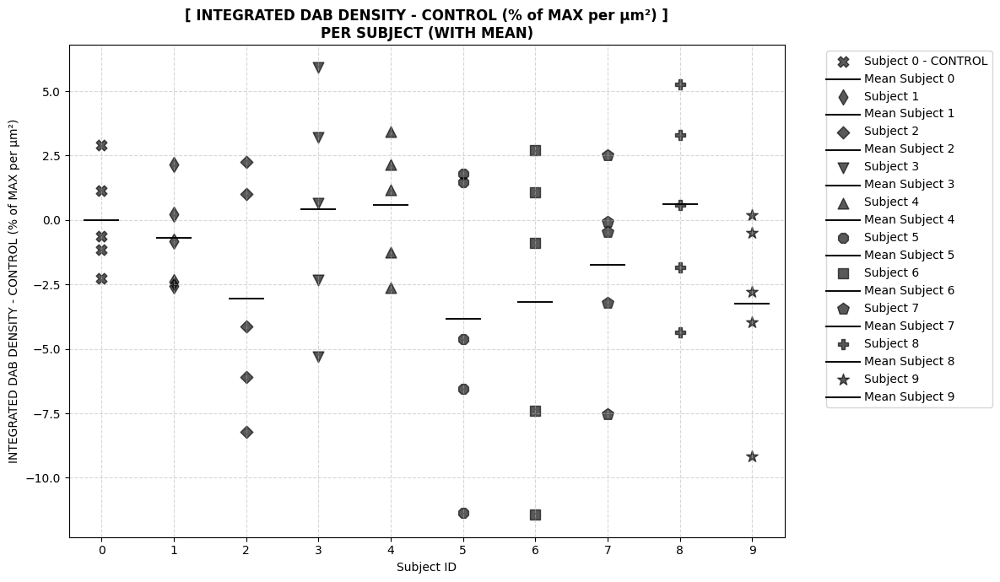

In [135]:
for fig_statistics in figs_statistics:
  display( ( fig_statistics ) )
  print()

### // ----------------------------------------------- //

## // ------------------------------------------------------------ //

# // ======================================================== //

# **@ [ ` SAVE-ROUTINE ` ] :**

## // ------------------------------------------------------------ //

## **@ [ ` SAVE-ROUTINE ` ] - SAVING THE CSV DATA TO STORAGE :**

In [136]:
# // ---- // SPECIFY THE PATH TO SAVE THE CSV FILE TO:
csv_path = f'{'/'.join( meta_container_path.split('/')[:-1] )}/RESULTS/{container_name}/CSV/'

# // ---- // FILE-NAME:
csv_name = 'DATABASE'

# // ---- // REMOVE (& re-create) PATH'S HIERARCHY (if it already exists, otherwise create it):
if os.path.exists( csv_path ): shutil.rmtree( csv_path )
os.makedirs( csv_path )

# // ---- // SAVING THE DATA-FRAME AS A .CSV FILE:
csv_full_save_path = csv_path + csv_name + '.csv'
DF.to_csv( csv_full_save_path , index = False )

print(f"CSV file saved to: {csv_full_save_path}")

CSV file saved to: /content/drive/MyDrive/PPX-IHC-ANALYSIS/RESULTS/PPX-TEST-ANALYSIS/CSV/DATABASE.csv


## // ------------------------------------------------------------ //

## **@ [ ` SAVE-ROUTINE ` ] - SAVING THE GENERATED FIGURES & IMAGES :**

### // ----------------------------------------------- //

### ***@ CREATING THE SAVE-DIRECTORIES... :***

In [137]:
# // ---- // PATHs OF RELEVANT DIRECTORIES AS A LIST:
paths = [
  save_path                                               ,
  figs_save_path                                          ,

  process_input_images_save_path                          ,
  manual_masks_save_path                                  ,
  threshold_masks_save_path                               ,
  rgb_endocrine_masked_images_save_path                   ,
  stain_endocrine_masked_images_save_path                 ,
  stain_images_save_path                                  ,
  stain_target_channel_images_save_path                   ,
  stain_visualizables_save_path                           ,

  figs_stain_coloring_scheme_save_path                    ,
  figs_segmentation_process_overview_save_path            ,
  figs_basic_rgb_histogram_analysis_save_path             ,
  figs_basic_stain_histogram_analysis_save_path           ,

  figs_statistics_save_path                               ,
        ]

# // ---- // PRE-DELETION --|> RE-CREATE DIRECTORY FROM SCRATCH (if it already exists):
if os.path.exists( save_path ) : shutil.rmtree( save_path )

# // ---- // DIRECTORIES' CREATION:
for path in paths: os.makedirs( path , exist_ok = True )

### // ----------------------------------------------- //

### ***@ IMAGES :***

In [138]:
# // ---- // SAVING THE MANUALLY GENERATED MASKS SET:
if process_input_images is not None:
  if os.path.exists(process_input_images_save_path):
    shutil.rmtree(process_input_images_save_path)

  os.makedirs( process_input_images_save_path , exist_ok = True )

  for idx, img in enumerate( process_input_images ):
    raw_img = im.fromarray( img )
    raw_img.save( process_input_images_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS INPUT IMAGES TO SAVE TO FILE..." )

In [139]:
# // ---- // SAVING THE MANUALLY GENERATED MASKS SET:
if process_manual_masks is not None:
  if os.path.exists( manual_masks_save_path ):
    shutil.rmtree( manual_masks_save_path )

  os.makedirs( manual_masks_save_path , exist_ok = True )

  for idx, img in enumerate( process_manual_masks ):
    threshold_mask_img = im.fromarray( dtyped_image( img , np.uint8 ) )
    threshold_mask_img.save( manual_masks_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS MANUAL MASK IMAGES TO SAVE TO FILE..." )

In [140]:
# // ---- // SAVING THE THREHSOLD MASKS SET:
if process_threshold_masks is not None:
  if os.path.exists( threshold_masks_save_path ):
    shutil.rmtree( threshold_masks_save_path )

  os.makedirs( threshold_masks_save_path , exist_ok = True )

  for idx, img in enumerate( process_threshold_masks ):
    threshold_mask_img = im.fromarray( dtyped_image( img , np.uint8 ) )
    threshold_mask_img.save( threshold_masks_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS THRESHOLD MASK IMAGES TO SAVE TO FILE..." )

In [141]:
# // ---- // SAVING THE ENDOCRINE-MASKED RGB IMAGES SET:
if process_threshold_masks is not None:
  if os.path.exists( rgb_endocrine_masked_images_save_path ):
    shutil.rmtree( rgb_endocrine_masked_images_save_path )

  os.makedirs( rgb_endocrine_masked_images_save_path , exist_ok = True )

  for idx, _img in enumerate( process_input_images ):
    img = image_mask_multiply( _img , process_threshold_masks[idx] )
    endocrine_masked_rgb_image = im.fromarray( dtyped_image( img , np.uint8 ) )
    endocrine_masked_rgb_image.save( rgb_endocrine_masked_images_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO ENDOCRINE-MASKED RGB IMAGES TO SAVE TO FILE..." )

In [142]:
# // ---- // SAVING THE ENDOCRINE-MASKED STAIN IMAGES SET:
if process_threshold_masks is not None:
  if os.path.exists( stain_endocrine_masked_images_save_path ):
    shutil.rmtree( stain_endocrine_masked_images_save_path )

  os.makedirs( stain_endocrine_masked_images_save_path , exist_ok = True )

  for idx, _img in enumerate( process_input_images ):
    img = sk.color.separate_stains( _img , conv_matrix = stain_matrix )
    img = normalize_image( img , **stain_normalization_params )
    img = image_mask_multiply( img , process_threshold_masks[idx] )
    endocrine_masked_stain_image = im.fromarray( dtyped_image( img , np.uint8 ) )
    endocrine_masked_stain_image.save( stain_endocrine_masked_images_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO ENDOCRINE-MASKED RGB IMAGES TO SAVE TO FILE..." )

In [143]:
# // ---- // SAVING THE RAW / PURE STAIN IMAGES SET:
if process_stain_images is not None:
  if os.path.exists( stain_images_save_path ):
    shutil.rmtree( stain_images_save_path )

  os.makedirs( stain_images_save_path , exist_ok = True )

  for idx, img in enumerate( process_stain_images ):
    stain_image = im.fromarray( dtyped_image( img , np.uint8 ) )
    stain_image.save( stain_images_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS STAIN IMAGES TO SAVE TO FILE..." )

In [144]:
# // ---- // SAVING THE DAB IMAGES SET:
if process_stain_images is not None:
  if os.path.exists( stain_target_channel_images_save_path ):
    shutil.rmtree( stain_target_channel_images_save_path )

  os.makedirs( stain_target_channel_images_save_path , exist_ok = True )

  for idx, img in enumerate( process_stain_images ):
    stain_target_channel_image = im.fromarray( dtyped_image( img[:,:,mask_channel] , np.uint8 ) )
    stain_target_channel_image.save( stain_target_channel_images_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS STAIN IMAGES / TARGET-STAIN CHANNEL IMAGES TO SAVE TO FILE..." )

In [145]:
# // ---- // SAVING THE COLORIZED STAIN IMAGES SET:
if process_stain_images is not None:
  if os.path.exists(stain_visualizables_save_path):
    shutil.rmtree(stain_visualizables_save_path)

  os.makedirs( stain_visualizables_save_path , exist_ok = True )

  for idx, img in enumerate( process_stain_images ):
    colorized_stain_image = colorize_image(
                              normalize_image(
                                img                          ,
                                **stain_normalization_params ,
                                             )                  ,
                              **stain_colorize_image_params     ,
                                          )
    colorized_stain_image = im.fromarray( colorized_stain_image )
    colorized_stain_image.save( stain_visualizables_save_path + process_image_names[idx] + IMAGE_SAVE_EXTENSION )
else:
  print( "NO PROCESS STAIN IMAGES TO SAVE TO FILE..." )

### // ----------------------------------------------- //

### ***@ FIGURES :***

In [146]:
# // ---- // SAVING THE "STAIN COLOR SCHEME" FIGURES SET:
if figs_stain_coloring_scheme is not None:
  if os.path.exists(figs_stain_coloring_scheme_save_path):
    shutil.rmtree(figs_stain_coloring_scheme_save_path)

  os.makedirs( figs_stain_coloring_scheme_save_path , exist_ok = True )

  for idx, fig in enumerate( figs_stain_coloring_scheme ):
    fig.savefig(
      figs_stain_coloring_scheme_save_path + process_image_names[idx] ,
      format = IMAGE_SAVE_EXTENSION.split('.')[-1]                    ,
               )
else:
  print( "NO FIGURES TO SAVE TO FILE..." )

In [147]:
# // ---- // SAVING THE "BASIC RGB HISTOGRAM ANALYSIS" FIGURES SET:
if figs_basic_rgb_histogram_analysis is not None:
  if os.path.exists(figs_basic_rgb_histogram_analysis_save_path):
    shutil.rmtree(figs_basic_rgb_histogram_analysis_save_path)

  os.makedirs( figs_basic_rgb_histogram_analysis_save_path , exist_ok = True )

  for idx, fig in enumerate( figs_basic_rgb_histogram_analysis ):
    fig.savefig(
      figs_basic_rgb_histogram_analysis_save_path + process_image_names[idx] ,
      format = IMAGE_SAVE_EXTENSION.split('.')[-1]                           ,
               )
else:
  print( "NO FIGURES TO SAVE TO FILE..." )

In [148]:
# // ---- // SAVING THE "SEGMENTATION PROCESS OVERVIEW" FIGURES SET:
if figs_segmentation_process_overview is not None:
  if os.path.exists(figs_segmentation_process_overview_save_path):
    shutil.rmtree(figs_segmentation_process_overview_save_path)

  os.makedirs( figs_segmentation_process_overview_save_path , exist_ok = True )

  for idx, fig in enumerate( figs_segmentation_process_overview ):
    fig.savefig(
      figs_segmentation_process_overview_save_path + process_image_names[idx] ,
      format = IMAGE_SAVE_EXTENSION.split('.')[-1]                            ,
               )
else:
  print( "NO FIGURES TO SAVE TO FILE..." )

In [149]:
# // ---- // SAVING THE "CONTROL STATISTICS'" FIGURES SET:
if figs_statistics is not None:
  if os.path.exists(figs_statistics_save_path):
    shutil.rmtree(figs_statistics_save_path)

  os.makedirs( figs_statistics_save_path , exist_ok = True )

  for idx, fig in enumerate( figs_statistics ):
    fig.savefig(
        figs_statistics_save_path + process_image_names[idx] ,
        format = IMAGE_SAVE_EXTENSION.split('.')[-1]         ,
               )
else:
  print( "NO FIGURES TO SAVE TO FILE..." )

### // ----------------------------------------------- //

## // ------------------------------------------------------------ //

# // ======================================================== //